## Convertir Imagenes 1

In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 75 bytes


In [ ]:
!pip install pydicom

In [ ]:
!kaggle competitions download -c edem-mda-b-2023-24-data-project-4

edem-mda-b-2023-24-data-project-4.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
import os
import random
import glob
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image, ImageEnhance, ImageFilter
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Input, Activation, Add, ReLU, Convolution2D, BatchNormalization, Dropout, AveragePooling2D, Dense, Flatten, Concatenate
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from zipfile import ZipFile
from tqdm.notebook import tqdm as tqdm_notebook  # Updated to use the correct tqdm for Jupyter Notebook
import pydicom


In [ ]:
from zipfile import ZipFile
file_name = "/content/edem-mda-b-2023-24-data-project-4.zip"
with ZipFile(file_name,'r') as zip:
  zip.extractall()
  print('Done')

Done


In [ ]:
path_train = "/content/train"
path_test = "/content/test"
traind = []
testnd = []
Y_train = pd.read_csv('/content/train.csv', delimiter=',')
Y_test = pd.read_csv('/content/sample_submission.csv', delimiter=',')

In [ ]:
listtrain = os.listdir("/content/train")
number_files_train = len(listtrain)
print(number_files_train)

listtest = os.listdir("/content/test")
number_files_test = len(listtest)
print(number_files_test)

1279
328


/usr/local/lib/python3.10/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:238: UserWarning: The (0028,0101) 'Bits Stored' value (15-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  warnings.warn(


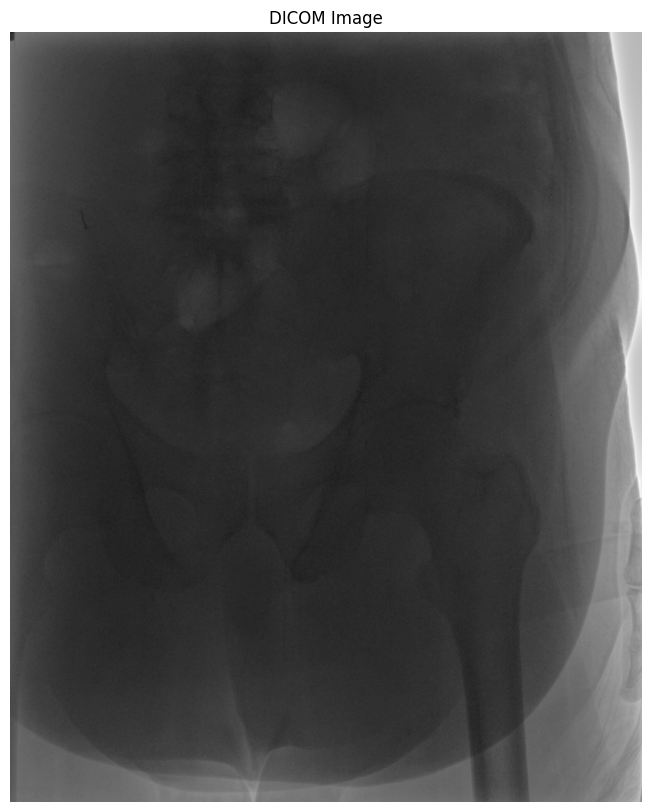

In [ ]:
import pydicom
from matplotlib import pyplot as plt

# Ruta al archivo DICOM
file_path = '/content/train/1.2.826.0.1.3680043.8.498.10025629581362719970278200333618114258.dcm'

# Leer la imagen DICOM
ds = pydicom.dcmread(file_path)
img = ds.pixel_array

# Mostrar la imagen
plt.figure(figsize=(10, 10))
plt.imshow(img, cmap='gray')
plt.title('DICOM Image')
plt.axis('off')  # Ocultar los ejes
plt.show()


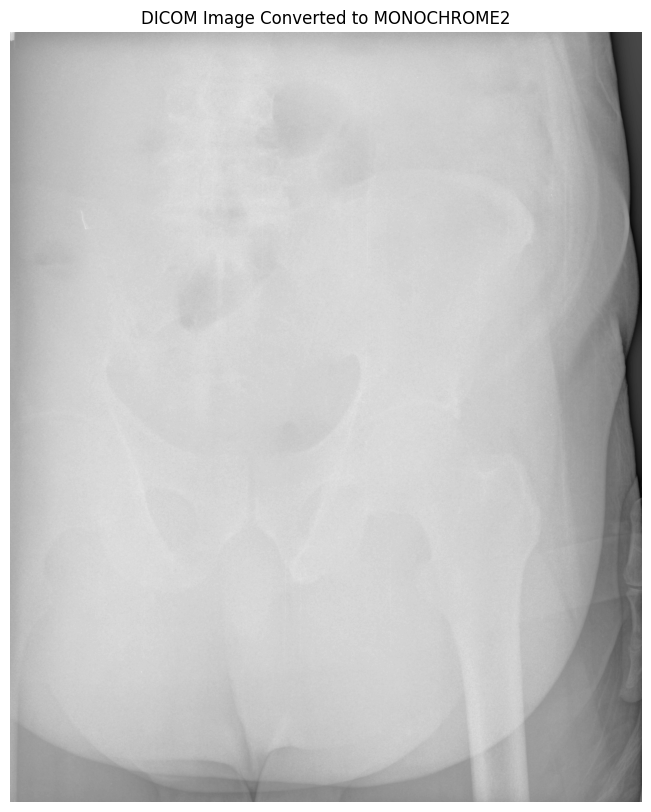

In [ ]:
# Invertir la imagen si está en MONOCHROME1

img = ds.pixel_array

if ds.data_element('PhotometricInterpretation').value == 'MONOCHROME1':
    img = np.max(img) - img  # Invertir los valores de los píxeles

# Mostrar la imagen invertida
plt.figure(figsize=(10, 10))
plt.imshow(img, cmap='gray')
plt.title('DICOM Image Converted to MONOCHROME2')
plt.axis('off')  # Ocultar los ejes
plt.show()

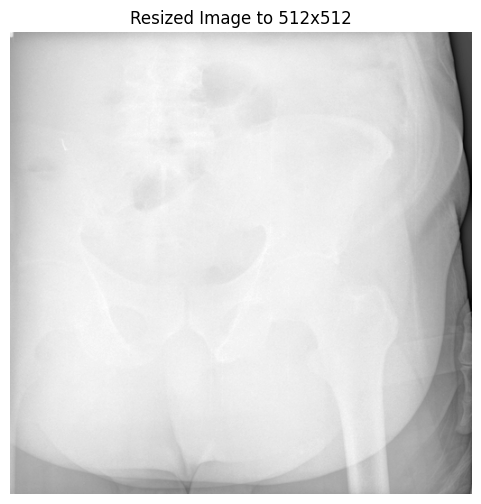

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt



# Normalizar y escalar la imagen a 0-255 si aún no está en este rango
img_normalized = (img - np.min(img)) / (np.max(img) - np.min(img)) * 255

img_normalized = img_normalized.astype(np.uint8)

pil_img = Image.fromarray(img_normalized, 'L')
# Redimensionar la imagen a 512x512
resized_img = pil_img.resize((512, 512), Image.LANCZOS)
resized_img.save('/content/resized_image.png')
img_resized = np.array(resized_img)


# Mostrar la imagen redimensionada
plt.figure(figsize=(6, 6))
plt.imshow(img_resized, cmap='gray')
plt.title('Resized Image to 512x512')
plt.axis('off')  # Ocultar los ejes
plt.show()


In [ ]:
import os
import numpy as np
import pydicom
from PIL import Image
from matplotlib import pyplot as plt

def process_dicom_image(file_path, output_directory, output_size=(512, 512)):
    # Leer la imagen DICOM
    ds = pydicom.dcmread(file_path)
    img = ds.pixel_array

    # Invertir la imagen si está en MONOCHROME1
    if ds.data_element('PhotometricInterpretation').value == 'MONOCHROME1':
        img = np.max(img) - img

    # Aplicar ajuste de percentiles
    p01 = np.percentile(img.ravel(), 1)
    p99 = np.percentile(img.ravel(), 99)
    img = np.clip(img, p01, p99)

    # Normalizar y escalar la imagen a 0-255
    img_normalized = (img - np.min(img)) / (np.max(img) - np.min(img)) * 255
    img_normalized = img_normalized.astype(np.uint8)

    # Convertir la imagen a PIL para redimensionar
    pil_img = Image.fromarray(img_normalized, 'L')
    resized_img = pil_img.resize(output_size, Image.LANCZOS)

    # Guardar la imagen redimensionada en formato PNG
    output_filename = os.path.basename(file_path).replace('.dcm', '.png')
    output_path = os.path.join(output_directory, output_filename)
    resized_img.save(output_path)
    print(f'Image saved as {output_path}')

def process_all_images(directory_path, output_directory):
    # Crear el directorio de salida si no existe
    os.makedirs(output_directory, exist_ok=True)

    # Procesar cada archivo DICOM en el directorio
    filenames = [f for f in os.listdir(directory_path) if f.endswith('.dcm')]
    for filename in filenames:
        file_path = os.path.join(directory_path, filename)
        process_dicom_image(file_path, output_directory)

# Ejemplo de uso
input_directory1 = '/content/train'
input_directory2 =  "/content/test"
output_directory1 = '/content/train_images'  # Ruta donde se guardarán las imágenes PNG
output_directory2 = '/content/test_images'



In [ ]:
process_all_images(input_directory1, output_directory1)

/usr/local/lib/python3.10/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:238: UserWarning: The (0028,0101) 'Bits Stored' value (15-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  warnings.warn(


Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.45507155843140808710559423485351865555.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.61935240681171831691209674888082688803.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.47792547773219390661042907257416202156.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.67559537148654160011527959040969363789.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.29581911459637473463731685532424058271.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.10766182678440607097974548538894412972.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.25204606916349302724934438931245202727.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.23761741990071343226444302301529121300.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.64856655695166446239802167810992758453.png
Image saved as /content/train_images/1.2.826.0

/usr/local/lib/python3.10/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:238: UserWarning: The (0028,0101) 'Bits Stored' value (10-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  warnings.warn(


Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.28178536867288617051101415657230487181.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.75371875098288485781683142614443689050.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.39709929915116422422774291452500742900.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.76866669644399923079251454289445878725.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.63828825734267483748619137855837840990.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.12456483389094621446738888682372272348.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.10423267111363824461063550726749517156.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.38245131900608261980021796046173197413.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.11235855239046664015333328177072591600.png
Image saved as /content/train_images/1.2.826.0

/usr/local/lib/python3.10/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:238: UserWarning: The (0028,0101) 'Bits Stored' value (12-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  warnings.warn(


Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.64780435588685129989778773284444060095.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.13991090089851460010665839222948439048.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.13392867864690899781590934884409903318.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.65724950385121664606938319165870413404.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.12781870272366327239431992873991536152.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.11583449165849197381539073980360763039.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.12890381296975892829022621008724647385.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.68406114115504976098308455781382728172.png
Image saved as /content/train_images/1.2.826.0.1.3680043.8.498.27192237518104864028418041285920348118.png
Image saved as /content/train_images/1.2.826.0

In [ ]:
process_all_images(input_directory2, output_directory2)

/usr/local/lib/python3.10/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:238: UserWarning: The (0028,0101) 'Bits Stored' value (15-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  warnings.warn(


Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.97088113898277989257775166735772820210.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.87427722256738190488460877117656414808.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.76769883690062886340068554422038907177.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.77935599580860430196193423571021869872.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.92246625291646357768244433090457419058.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.94191630626826666666908037532848358568.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.82496683259058624581931962359144322169.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.87935379073442194933586677724267942859.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.89570960388945351624625586720783962554.png
Image saved as /content/test_images/1.2.826.0.1.3680043

/usr/local/lib/python3.10/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:238: UserWarning: The (0028,0101) 'Bits Stored' value (10-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  warnings.warn(


Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.76020208464480144206974914217082888054.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.98229201581139590153090960568103270985.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.92127115820268888239113572137981968546.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.85277699722730898683263183740351354808.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.74083193005573851060258495550786359123.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.78471440699080915296158726514805771201.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.81821820223500601248235580217624909228.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.97308803306058942894121558948007151624.png
Image saved as /content/test_images/1.2.826.0.1.3680043.8.498.84791765678612446017805462067606438053.png
Image saved as /content/test_images/1.2.826.0.1.3680043

In [ ]:
from google.colab import files
import shutil

def download_folder1(folder_path):
    # Comprimir la carpeta en un archivo zip
    shutil.make_archive('train', 'zip', folder_path)

    # Iniciar la descarga
    files.download('train.zip')

# Ejemplo de uso
download_folder1(output_directory1)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
import shutil

def download_folder2(folder_path):
    # Comprimir la carpeta en un archivo zip
    shutil.make_archive('test', 'zip', folder_path)

    # Iniciar la descarga
    files.download('test.zip')

# Ejemplo de uso
download_folder2(output_directory2)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
def load_image(sample_path):
    ds = pydicom.dcmread(sample_path)
    img = ds.pixel_array
    p01 = np.percentile(img.ravel(), 1)
    p99 = np.percentile(img.ravel(), 99)
    img[img > p99] = p99
    img[img < p01] = p01
    if ds.data_element('PhotometricInterpretation').value == 'MONOCHROME1':
        img = np.invert(img)
    img = (img - img.min()) / (img.max() - img.min())
    return img

## Convertir imagenes 2

In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 75 bytes


In [ ]:
!pip install pydicom

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 24.3 MB/s eta 0:00:00


In [ ]:
!kaggle competitions download -c edem-mda-b-2023-24-data-project-4

100% 19.1G/19.1G [17:55<00:00, 19.6MB/s]
100% 19.1G/19.1G [17:55<00:00, 19.1MB/s]


In [ ]:
import os
import random
import glob
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image, ImageEnhance, ImageFilter
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Input, Activation, Add, ReLU, Convolution2D, BatchNormalization, Dropout, AveragePooling2D, Dense, Flatten, Concatenate
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from zipfile import ZipFile
from tqdm.notebook import tqdm as tqdm_notebook  # Updated to use the correct tqdm for Jupyter Notebook
import pydicom

In [ ]:
file_name = "/content/edem-mda-b-2023-24-data-project-4.zip"
with ZipFile(file_name,'r') as zfile:
  zfile.extractall()
  print('Done')

Done


In [ ]:
import numpy as np
import pydicom
import os
import matplotlib.pyplot as plt
from zipfile import ZipFile
from PIL import Image

def load_and_transform_image(sample_path):
    ds = pydicom.dcmread(sample_path)

    # Ajustar los metadatos `Bits Stored` si es necesario
    if 'PixelData' in ds:
        actual_bits_stored = ds.pixel_array.dtype.itemsize * 8
        if ds.BitsStored != actual_bits_stored:
            ds.BitsStored = actual_bits_stored

    # Convertir a MONOCHROME2 si es necesario
    if ds.PhotometricInterpretation == 'MONOCHROME1':
        img = np.invert(ds.pixel_array)
    else:
        img = ds.pixel_array

    p01 = np.percentile(img.ravel(), 1)
    p99 = np.percentile(img.ravel(), 99)
    img = np.clip(img, p01, p99)

    img = (img - img.min()) / (img.max() - img.min())

    return img

def resize_image(img, size=(224, 224)):
    # Asegurar que la imagen esté en el rango correcto [0, 1] antes de convertirla
    img = (img * 255).astype(np.uint8)  # Convertir a 8 bits por píxel
    img = Image.fromarray(img, mode='L')  # Convertir a imagen PIL en modo 'L' (escala de grises)
    img = img.resize(size, Image.BICUBIC)  # Reescalar usando interpolación bicúbica
    return np.array(img) / 255.0  # Convertir de nuevo a array numpy y normalizar a [0, 1]

def save_transformed_image(img, output_path):
    plt.imsave(output_path, img, cmap='gray', format='png')

input_dirs = ['/content/train', '/content/test']
output_dirs = ['/content/transformed_train', '/content/transformed_test']

# Crear directorios de salida si no existen
for output_dir in output_dirs:
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

# Transformar y guardar las imágenes
for input_dir, output_dir in zip(input_dirs, output_dirs):
    for filename in os.listdir(input_dir):
        if filename.endswith('.dcm'):
            sample_path = os.path.join(input_dir, filename)
            output_path = os.path.join(output_dir, filename.replace('.dcm', '.png'))
            img = load_and_transform_image(sample_path)
            img = resize_image(img, size=(224, 224))
            save_transformed_image(img, output_path)

# Función para comprimir directorios en archivos zip separados
def zip_directory(directory_path, zip_path):
    with ZipFile(zip_path, 'w') as zip_file:
        for foldername, subfolders, filenames in os.walk(directory_path):
            for filename in filenames:
                file_path = os.path.join(foldername, filename)
                zip_file.write(file_path, os.path.relpath(file_path, directory_path))

# Comprimir las imágenes transformadas en archivos zip separados




/usr/local/lib/python3.10/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:238: UserWarning: The (0028,0101) 'Bits Stored' value (15-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:238: UserWarning: The (0028,0101) 'Bits Stored' value (12-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:238: UserWarning: The (0028,0101) 'Bits Stored' value (10-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  warnings.warn(


In [ ]:
zip_directory('/content/transformed_test', '/content/transformed_test.zip')
print("Las imágenes transformadas de test han sido comprimidas en /content/transformed_test.zip")

Las imágenes transformadas de test han sido comprimidas en /content/transformed_test.zip


In [ ]:
zip_directory('/content/transformed_train', '/content/transformed_train.zip')
print("Las imágenes transformadas de train han sido comprimidas en /content/transformed_train.zip")

Las imágenes transformadas de train han sido comprimidas en /content/transformed_train.zip


## Padding


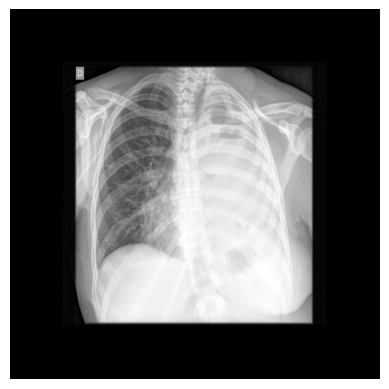

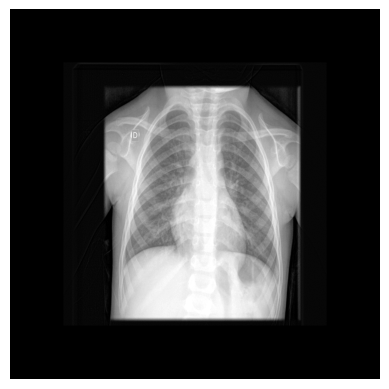

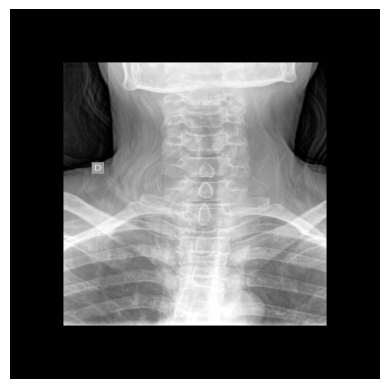

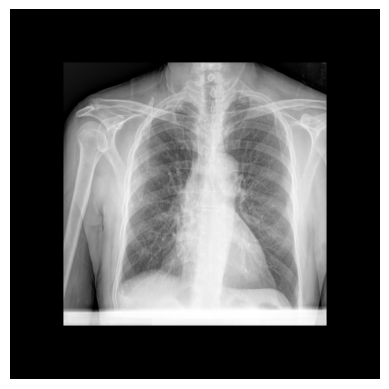

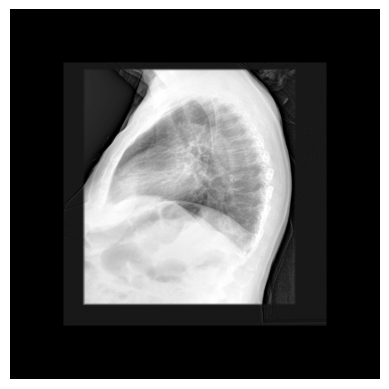

...

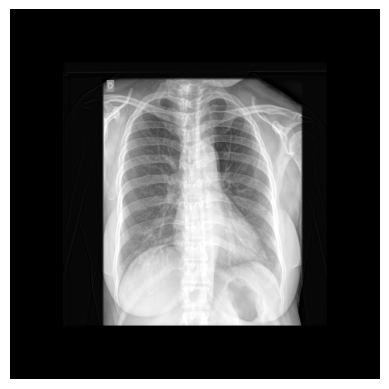

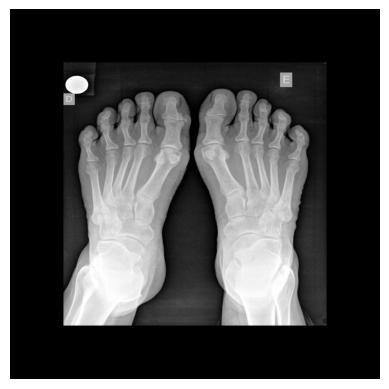

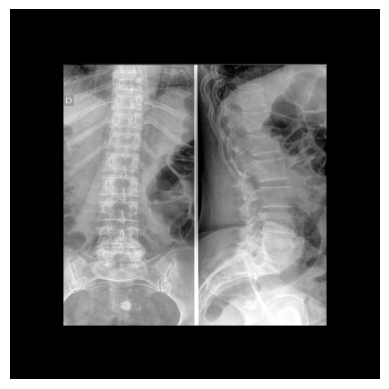

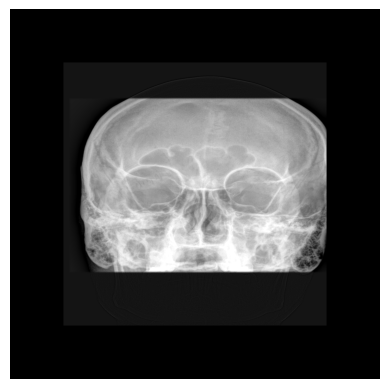

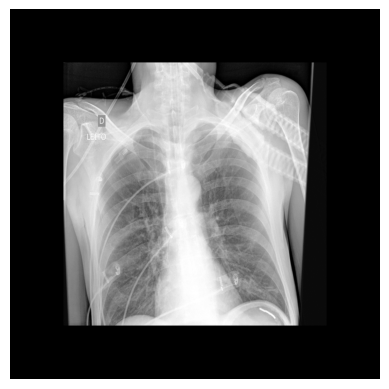

In [ ]:
import os
from zipfile import ZipFile
from PIL import Image
import matplotlib.pyplot as plt

def pad_image(image_path, target_size):
    # Abrir la imagen
    img = Image.open(image_path)

    # Obtener el tamaño actual de la imagen
    width, height = img.size

    # Calcular la cantidad de relleno necesario
    pad_width = max(target_size[0] - width, 0)
    pad_height = max(target_size[1] - height, 0)

    # Calcular el relleno para cada lado de la imagen
    left_padding = pad_width // 2
    top_padding = pad_height // 2
    right_padding = pad_width - left_padding
    bottom_padding = pad_height - top_padding

    # Aplicar el relleno a la imagen
    padded_img = Image.new(img.mode, target_size, 0)  # Cambio de (0, 0, 0) a 0
    padded_img.paste(img, (left_padding, top_padding))

    return padded_img

# Archivo zip de entrada
zip_file = "/content/test.zip"

# Carpeta de salida para las imágenes rellenadas
output_folder = "output_images/"

# Tamaño deseado de la imagen
target_size = (720, 720)

# Crear la carpeta de salida si no existe
os.makedirs(output_folder, exist_ok=True)

# Descomprimir el archivo zip
with ZipFile(zip_file, 'r') as zip_ref:
    zip_ref.extractall(output_folder)

# Iterar sobre todas las imágenes en la carpeta de salida
for filename in os.listdir(output_folder):
    if filename.endswith(".png"):  # Solo procesar archivos PNG
        # Ruta de la imagen de entrada
        input_image_path = os.path.join(output_folder, filename)

        # Aplicar el relleno a la imagen
        padded_image = pad_image(input_image_path, target_size)

        # Guardar la imagen rellenada
        padded_image.save(os.path.join(output_folder, "padded_" + filename))

        # Mostrar la imagen rellenada
        plt.imshow(padded_image, cmap='gray')  # Usar cmap='gray' para mostrar en escala de grises
        plt.axis('off')  # Desactivar los ejes
        plt.show()


## Mejor try

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# import os
# import shutil

# # Ruta al directorio principal y a la nueva ubicación
# base_path = '/content/drive/MyDrive/data_proyect_4/Data/muraData/descompress/MURA-v1.1/train'
# destination_path = '/content/drive/MyDrive/data_proyect_4/Data/muraData/processed_images_forUs'

# # Crear el directorio de destino si no existe
# os.makedirs(destination_path, exist_ok=True)

# # Listar las clases en el primer nivel del directorio 'train'
# classes = ['XR_FOREARM', 'XR_HAND', 'XR_FINGER', 'XR_WRIST', 'XR_HUMERUS', 'XR_ELBOW', 'XR_SHOULDER']

# for class_dir in classes:
#     class_path = os.path.join(base_path, class_dir)
#     if os.path.isdir(class_path):
#         # Crear una subcarpeta en el directorio de destino para la clase actual
#         class_destination_path = os.path.join(destination_path, class_dir)
#         os.makedirs(class_destination_path, exist_ok=True)

#         # Recorre cada paciente dentro de la clase
#         for patient_dir in os.listdir(class_path):
#             patient_path = os.path.join(class_path, patient_dir)
#             if os.path.isdir(patient_path):
#                 # Recorre cada estudio dentro del paciente
#                 for study_dir in os.listdir(patient_path):
#                     study_path = os.path.join(patient_path, study_dir)
#                     if os.path.isdir(study_path) and 'negative' in study_dir:
#                         # Obtener una lista de los archivos de imagen en el estudio
#                         image_files = [os.path.join(study_path, f) for f in os.listdir(study_path) if f.endswith('.png') or f.endswith('.jpg') or f.endswith('.jpeg')]

#                         # Copiar las imágenes al directorio de destino con el nuevo nombre
#                         for i, image_file in enumerate(image_files):
#                             # Definir el nuevo nombre de la imagen
#                             new_image_name = f'mura_{class_dir}_{patient_dir}_{i+1}.png'
#                             destination_file = os.path.join(class_destination_path, new_image_name)
#                             # Copiar la imagen
#                             shutil.copy(image_file, destination_file)

# print("Imágenes negativas copiadas y renombradas correctamente en sus respectivas carpetas.")




In [ ]:
# Ruta al directorio de destino
import os
destination_path = '/content/drive/MyDrive/data_proyect_4/Data/muraData/processed_images_forUs'

# Listar las clases en el directorio de destino
classes = [d for d in os.listdir(destination_path) if os.path.isdir(os.path.join(destination_path, d))]
print(classes)

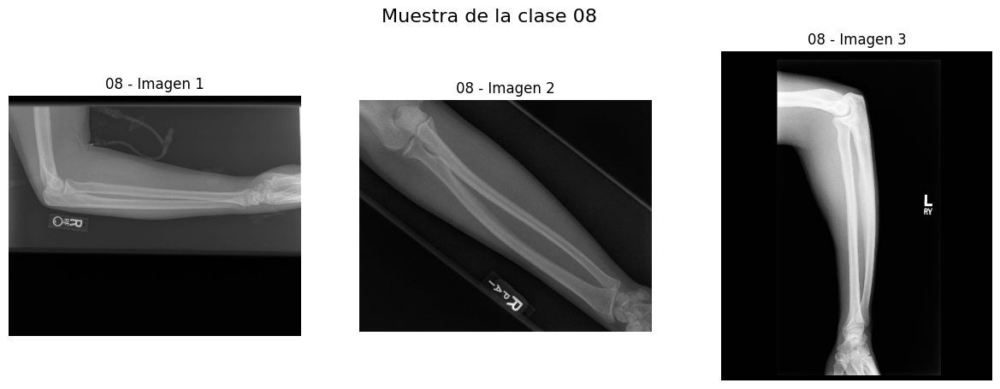

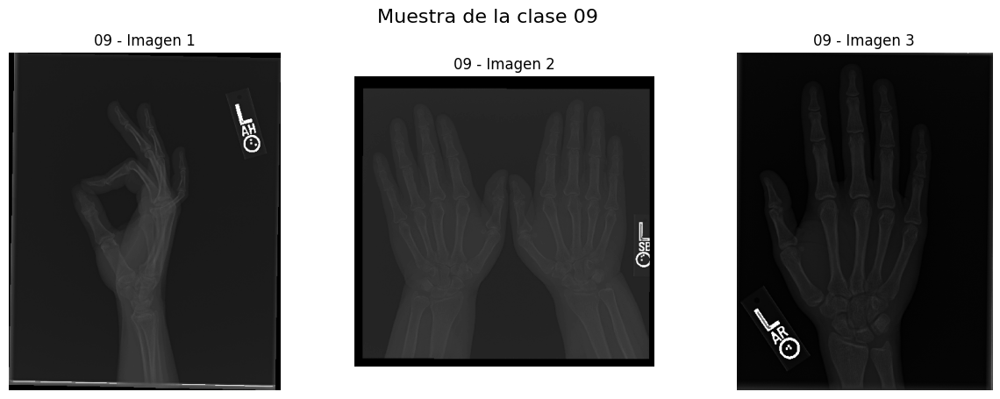

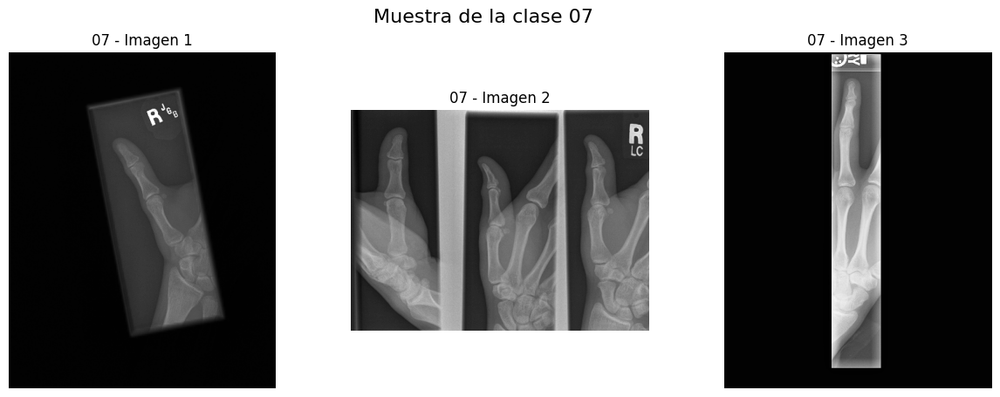

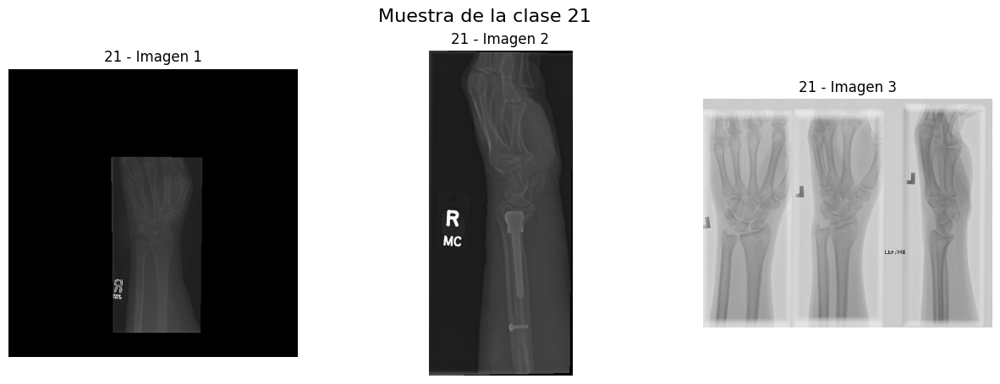

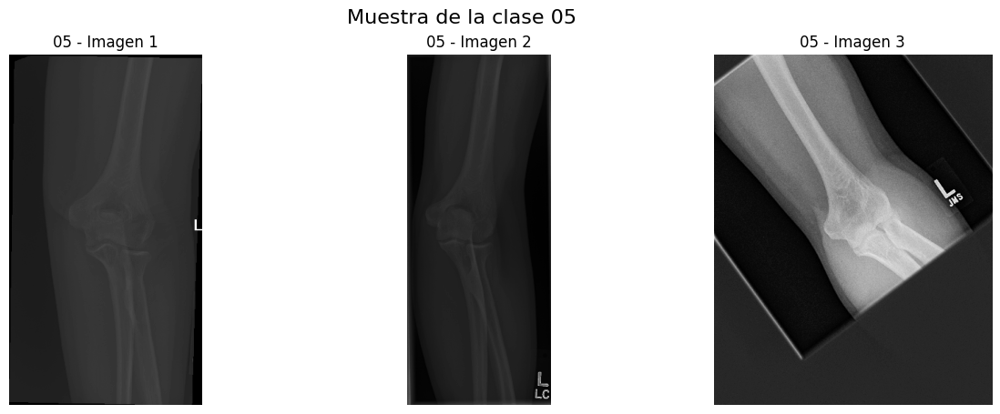

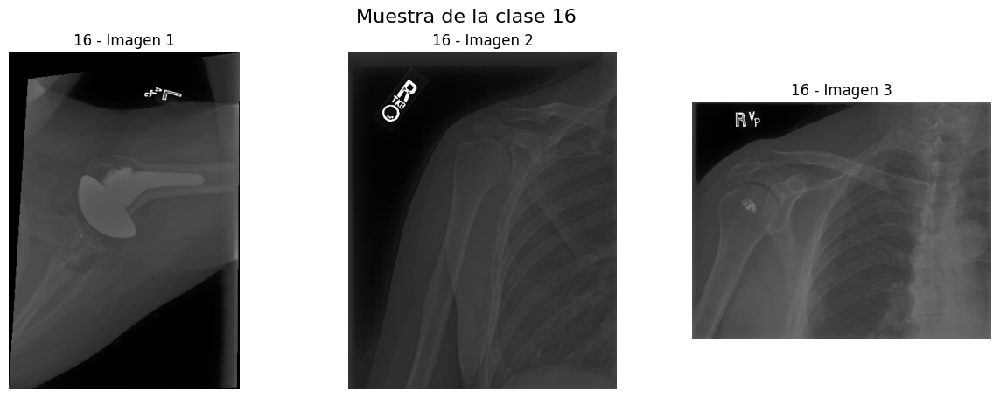

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import cv2

# Ruta al directorio de destino
destination_path = '/content/drive/MyDrive/data_proyect_4/Data/muraData/processed_images_forUs'

# Listar las clases en el directorio de destino
classes = [d for d in os.listdir(destination_path) if os.path.isdir(os.path.join(destination_path, d))]

# Definir el número de muestras por clase
num_samples = 3

# Mostrar una muestra aleatoria de tres imágenes de cada clase
for class_dir in classes:
    class_path = os.path.join(destination_path, class_dir)
    # Obtener una lista de todas las imágenes en la clase
    image_files = [os.path.join(class_path, f) for f in os.listdir(class_path) if f.endswith('.png') or f.endswith('.jpg') or f.endswith('.jpeg')]

    # Verificar si hay imágenes en la clase
    if not image_files:
        print(f"No se encontraron imágenes en la clase {class_dir}")
        continue

    # Seleccionar aleatoriamente tres imágenes
    sample_images = random.sample(image_files, min(num_samples, len(image_files)))

    # Plotear las imágenes seleccionadas
    plt.figure(figsize=(15, 5))
    for i, image_file in enumerate(sample_images):
        img = cv2.imread(image_file, cv2.IMREAD_GRAYSCALE)
        plt.subplot(1, num_samples, i+1)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
        plt.title(f'{class_dir} - Imagen {i+1}')

    plt.suptitle(f'Muestra de la clase {class_dir}', fontsize=16)
    plt.show()


In [ ]:
import os
import random
import shutil

# Rutas a tu dataset original y al dataset de MURA
# original_dataset_path = '/content/drive/MyDrive/data_proyect_4/Data/datafastai/train'
# mura_dataset_path = '/content/drive/MyDrive/data_proyect_4/Data/muraData/processed_images_forUs'
# combined_dataset_path = '/content/drive/MyDrive/data_proyect_4/Data/trainset+mura_images'

# # Crear el directorio combinado si no existe
# os.makedirs(combined_dataset_path, exist_ok=True)

# # Paso 1: Copiar todas las imágenes del dataset original al dataset combinado
# for class_dir in os.listdir(original_dataset_path):
#     original_class_path = os.path.join(original_dataset_path, class_dir)
#     combined_class_path = os.path.join(combined_dataset_path, class_dir)

#     if os.path.isdir(original_class_path):
#         os.makedirs(combined_class_path, exist_ok=True)

#         original_images = [os.path.join(original_class_path, f) for f in os.listdir(original_class_path) if os.path.isfile(os.path.join(original_class_path, f))]
#         for img_path in original_images:
#             shutil.copy(img_path, combined_class_path)

# # Definir las clases comunes entre el dataset original y MURA
# original_classes = set(os.listdir(original_dataset_path))
# mura_classes = set(os.listdir(mura_dataset_path))
# common_classes = list(original_classes.intersection(mura_classes))

# # Paso 2: Agregar 500 imágenes de MURA a las clases comunes
# for class_dir in common_classes:
#     mura_class_path = os.path.join(mura_dataset_path, class_dir)
#     combined_class_path = os.path.join(combined_dataset_path, class_dir)

#     # Seleccionar 500 imágenes de MURA y copiarlas
#     mura_images = [os.path.join(mura_class_path, f) for f in os.listdir(mura_class_path) if os.path.isfile(os.path.join(mura_class_path, f))]
#     selected_mura_images = random.sample(mura_images, min(500, len(mura_images)))

#     for img_path in selected_mura_images:
#         shutil.copy(img_path, combined_class_path)

# print("Imágenes copiadas correctamente al dataset combinado.")

# # Paso 3: Contar el número total de imágenes en el nuevo dataset combinado
# total_images = 0
# class_image_counts = {}

# # Recorrer todas las carpetas y subcarpetas para contar las imágenes
# for class_dir in os.listdir(combined_dataset_path):
#     class_path = os.path.join(combined_dataset_path, class_dir)
#     if os.path.isdir(class_path):
#         image_count = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
#         class_image_counts[class_dir] = image_count
#         total_images += image_count

# # Imprimir el número total de imágenes y el conteo por clase
# print(f"Total de imágenes en el dataset: {total_images}")
# for class_dir, count in class_image_counts.items():
#     print(f'Clase {class_dir}: {count} imágenes')


In [ ]:
# import os
# import shutil
# import numpy as np
# from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img

# # Directorio base donde se almacenan las imágenes
# base_dir = '/content/drive/MyDrive/data_proyect_4/Data/trainset+mura_images'

# # Crear un generador de datos con data augmentation
# datagen = ImageDataGenerator(
#     rotation_range=20,
#     width_shift_range=0.2,
#     height_shift_range=0.2,
#     shear_range=0.2,
#     zoom_range=0.2,
#     horizontal_flip=True,
#     fill_mode='nearest'
# )

# # Función para aumentar el número de imágenes en clases subrepresentadas
# def augment_images(class_dir, target_count=50):
#     image_files = [f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))]
#     current_count = len(image_files)

#     if current_count >= target_count:
#         return  # No es necesario aumentar esta clase

#     for img_file in image_files:
#         img_path = os.path.join(class_dir, img_file)
#         img = load_img(img_path)
#         x = img_to_array(img)
#         x = np.expand_dims(x, axis=0)

#         # Generar imágenes aumentadas hasta alcanzar el objetivo
#         i = 0
#         for batch in datagen.flow(x, batch_size=1, save_to_dir=class_dir, save_prefix='aug', save_format='jpeg'):
#             i += 1
#             if current_count + i >= target_count:
#                 break

# # Identificar las clases subrepresentadas y aplicar data augmentation
# for class_name in os.listdir(base_dir):
#     class_dir = os.path.join(base_dir, class_name)
#     if os.path.isdir(class_dir):
#         image_count = len([f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))])
#         if image_count < 50:
#             print(f'Aumentando imágenes para la clase {class_name} (actual: {image_count} imágenes)')
#             augment_images(class_dir, target_count=50)

# print('Data augmentation completada.')


In [ ]:
import os

# Directorio base donde se almacenan las imágenes
base_dir = '/content/drive/MyDrive/data_proyect_4/Data/trainset+mura_images'

# Crear un diccionario para almacenar el conteo de imágenes por clase
class_counts = {}

# Recorrer cada clase en el directorio base
for class_name in os.listdir(base_dir):
    class_dir = os.path.join(base_dir, class_name)
    if os.path.isdir(class_dir):
        # Contar el número de imágenes en la clase
        image_count = len([f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))])
        class_counts[class_name] = image_count

# Mostrar el número de imágenes por cada clase
for class_name, count in class_counts.items():
    print(f'Clase {class_name}: {count} imágenes')


In [ ]:
# import os
# import zipfile
# import os

# # Ruta al archivo ZIP en Google Drive
# zip_path = '/content/drive/MyDrive/data_proyect_4/LeraData/LERA Dataset.zip'

# # Directorio donde se descomprimirá el archivo
# extract_dir = '/content/drive/MyDrive/data_proyect_4/LeraData/LERA_Dataset'

# # Crear el directorio de destino si no existe
# os.makedirs(extract_dir, exist_ok=True)

# # Descomprimir el archivo ZIP
# with zipfile.ZipFile(zip_path, 'r') as zip_ref:
#     zip_ref.extractall(extract_dir)

# print(f'Archivos descomprimidos en: {extract_dir}')



In [ ]:
# import matplotlib.pyplot as plt
# from PIL import Image
# import os

# folder_path = '/content/drive/MyDrive/data_proyect_4/LeraData/LERA_Dataset/LERA Dataset/1005/ST-1'
# files = os.listdir(folder_path)

# image_files = [f for f in files if f.lower().endswith(('png', 'jpg', 'jpeg'))]

# num_images_to_show = 9
# plt.figure(figsize=(15, 15))

# for i, image_file in enumerate(image_files[:num_images_to_show]):
#     image_path = os.path.join(folder_path, image_file)
#     img = Image.open(image_path)
#     plt.subplot(1, num_images_to_show, i + 1)
#     plt.imshow(img, cmap='gray')
#     plt.axis('off')
#     plt.title(f"Imagen {i + 1}")

# plt.show()


In [ ]:
import os
import zipfile
import shutil
# Ruta del archivo comprimido
zip_file_path = '/content/drive/MyDrive/LERA_Dataset/LERA Dataset/data_proyect_4/LeraData/LERA Dataset.zip'
# Ruta donde se descomprimirá el contenido
unzip_folder_path = '/content/drive/MyDrive/LERA_Dataset/LERA Dataset/data_proyect_4/LeraData/unzippedLeraData'

# Descomprimir el archivo
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(unzip_folder_path)


In [ ]:
import pandas as pd

# Ruta al archivo CSV
csv_path = '/content/drive/MyDrive/Data Project IV/LERA Dataset/labels.csv'

# Cargar el archivo CSV y asignar nombres de columnas, asegurando que todas las columnas tengan nombres
column_names = ['case_number', 'body_part']
df = pd.read_csv(csv_path, header=None, names=column_names, index_col=False)

# Mostrar las primeras filas del DataFrame para verificar
print(df.head())


In [ ]:
# Agrupar por la columna body_part
grouped = df.groupby('body_part')['case_number'].apply(list).reset_index()
print(grouped)


In [ ]:
import os
import shutil

# Ruta base a las carpetas de imágenes
base_dir = '/content/drive/MyDrive/LERA_Dataset/LERA Dataset/data_proyect_4/LeraData/unzippedLeraData/LERA Dataset'
dest_base_dir = '/content/drive/MyDrive/LERA_Dataset/LERA Dataset/data_proyect_4/LeraData/LeraSortedForbodypart'

# Crear el directorio de destino si no existe
os.makedirs(dest_base_dir, exist_ok=True)

for index, row in grouped.iterrows():
    body_part = row['body_part']
    case_numbers = row['case_number']

    # Crear un nuevo directorio para el body_part si no existe
    dest_dir = os.path.join(dest_base_dir, body_part)
    os.makedirs(dest_dir, exist_ok=True)

    for case_number in case_numbers:
        source_dir = os.path.join(base_dir, str(case_number))
        if os.path.exists(source_dir):
            # Recorrer los subdirectorios dentro del directorio del case_number
            for subdir, _, files in os.walk(source_dir):
                for file in files:
                    # Crear la ruta completa del archivo fuente
                    source_file = os.path.join(subdir, file)
                    # Obtener el nombre del subdirectorio relativo a case_number
                    subdir_name = os.path.relpath(subdir, source_dir).replace(os.sep, '_')
                    # Crear el nuevo nombre del archivo y su ruta de destino
                    new_file_name = f"{case_number}_{subdir_name}_{file}"
                    dest_file = os.path.join(dest_dir, new_file_name)
                    # Copiar el archivo y renombrarlo
                    shutil.copy2(source_file, dest_file)
                    print(f'Copiado y renombrado: {source_file} -> {dest_file}')
        else:
            print(f'Directorio no encontrado: {source_dir}')


In [ ]:
# Crear un diccionario para almacenar los conteos
body_part_counts = {}

# Recorrer los subdirectorios y contar los archivos
for body_part in os.listdir(dest_base_dir):
    body_part_dir = os.path.join(dest_base_dir, body_part)
    if os.path.isdir(body_part_dir):
        num_files = sum([len(files) for r, d, files in os.walk(body_part_dir)])
        body_part_counts[body_part] = num_files

# Mostrar los resultados
for body_part, count in body_part_counts.items():
    print(f'{body_part}: {count} fotos')

In [ ]:


# Rutas
source_base_dir = '/content/drive/MyDrive/LERA_Dataset/LERA Dataset/data_proyect_4/LeraData/LeraSortedForbodypart'
dest_base_dir = '/content/drive/MyDrive/LERA_Dataset/LERA Dataset/data_proyect_4/Data/trainset+mura_images'

# Especificaciones de copias
copy_specs = {
    'XR ANKLE': 100,
    'XR FOOT': 'todas',
    'XR HIP': 90,
    'XR KNEE': 'todas'
}

# Mapeo de etiquetas al directorio destino
destination_labels = {
    'XR ANKLE': '01',
    'XR FOOT': '06',
    'XR HIP': '10',
    'XR KNEE': '11'
}

# Crear el directorio de destino si no existe
os.makedirs(dest_base_dir, exist_ok=True)

# Función para copiar archivos
def copy_files(source_dir, dest_dir, num_files='todas'):
    files = os.listdir(source_dir)
    if num_files != 'todas':
        files = random.sample(files, num_files)
    for file in files:
        source_file = os.path.join(source_dir, file)
        dest_file = os.path.join(dest_dir, file)
        shutil.copy2(source_file, dest_file)
        print(f'Copiado: {source_file} -> {dest_file}')

# Realizar las copias según las especificaciones
for body_part, num_files in copy_specs.items():
    dest_label = destination_labels[body_part]
    source_dir = os.path.join(source_base_dir, body_part)
    dest_dir = os.path.join(dest_base_dir, dest_label)
    os.makedirs(dest_dir, exist_ok=True)
    copy_files(source_dir, dest_dir, num_files)


In [ ]:
import os

# Directorio base donde se almacenan las imágenes
base_dir = '/content/drive/MyDrive/LERA_Dataset/LERA Dataset/data_proyect_4/Data/trainset+mura_images'

# Crear un diccionario para almacenar el conteo de imágenes por clase
class_counts = {}

# Recorrer cada clase en el directorio base
for class_name in os.listdir(base_dir):
    class_dir = os.path.join(base_dir, class_name)
    if os.path.isdir(class_dir):
        # Contar el número de imágenes en la clase
        image_count = len([f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))])
        class_counts[class_name] = image_count

# Mostrar el número de imágenes por cada clase
for class_name, count in class_counts.items():
    print(f'Clase {class_name}: {count} imágenes')

In [ ]:
import os
from PIL import Image

# Directorio base donde se almacenan las imágenes
base_dir = '/content/drive/MyDrive/data_proyect_4/Data/trainset+mura_images'

def verify_images(directory):
    """
    Verifica todas las imágenes en el directorio y elimina las que están corruptas.
    """
    num_invalid_files = 0
    for subdir, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(subdir, file)
            try:
                with Image.open(file_path) as img:
                    img.verify()  # Verifica que se puede abrir la imagen
            except (IOError, SyntaxError) as e:
                print(f'Eliminando archivo inválido: {file_path}')
                os.remove(file_path)
                num_invalid_files += 1
    print(f'Número de archivos inválidos eliminados: {num_invalid_files}')

# Verificar todas las imágenes en el conjunto de datos
verify_images(base_dir)


In [ ]:
import tensorflow as tf

# Ruta al dataset combinado
base_dir = '/content/drive/MyDrive/LERA_Dataset/LERA Dataset/data_proyect_4/Data/trainset+mura_images'



# Definir el tamaño del lote y el tamaño de las imágenes
batch_size = 32  # Puedes ajustar este valor según sea necesario
img_size = 256  # Puedes ajustar este valor según sea necesario

train_ds = tf.keras.utils.image_dataset_from_directory(
    base_dir,
    labels='inferred',
    label_mode='int',
    seed=42,
    validation_split=0.2,
    subset='training',
    batch_size=batch_size,
    image_size=(img_size, img_size)
)

# Crear el conjunto de validación
val_ds = tf.keras.utils.image_dataset_from_directory(
    base_dir,
    labels='inferred',
    label_mode='int',
    seed=42,
    validation_split=0.2,
    subset='validation',
    batch_size=batch_size,
    image_size=(img_size, img_size)
)

# Imprimir información sobre los conjuntos de datos
print("Conjunto de entrenamiento:")
for images, labels in train_ds.take(1):
    print(f"Imágenes: {images.shape}, Labels: {labels.shape}")

print("\nConjunto de validación:")
for images, labels in val_ds.take(1):
    print(f"Imágenes: {images.shape}, Labels: {labels.shape}")


In [ ]:
# Convertir el conjunto de entrenamiento a un iterador de NumPy
train_ds_iterator = train_ds.as_numpy_iterator()

# Obtener el primer lote de datos
train_batch = train_ds_iterator.next()

# Mostrar las formas de las imágenes y etiquetas del primer lote
print(f"Forma de las imágenes del primer lote: {train_batch[0].shape}")


In [ ]:
from tensorflow.keras.applications import ConvNeXtXLarge
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Conv2D, MaxPooling2D, Input, Dropout, BatchNormalization, Activation, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def create_model(num_classes, input_shape=(256, 256, 3)):
    input_tensor = Input(shape=input_shape)

    # Cargar el modelo ConvNeXtXLarge preentrenado
    base_model = ConvNeXtXLarge(include_top=False, weights='imagenet', input_tensor=input_tensor)
    base_model.trainable = False  # Congelar las capas del modelo base

    # Tomando la última capa del modelo ConvNeXtXLarge como punto de partida
    last_layer = base_model.output

    # Añadir capas convolucionales adicionales
    x = Conv2D(filters=64, kernel_size=(3, 3), padding='same', name='conv1')(last_layer)
    x = BatchNormalization(name='bn1')(x)
    x = Activation('relu', name='act1')(x)
    x = MaxPooling2D(pool_size=(2, 2), name='pool1')(x)

    x = Conv2D(filters=128, kernel_size=(3, 3), padding='same', name='conv2')(x)
    x = BatchNormalization(name='bn2')(x)
    x = Activation('relu', name='act2')(x)
    x = MaxPooling2D(pool_size=(2, 2), name='pool2')(x)

    x = Conv2D(filters=256, kernel_size=(3, 3), padding='same', name='conv3')(x)
    x = BatchNormalization(name='bn3')(x)
    x = Activation('relu', name='act3')(x)
    x = MaxPooling2D(pool_size=(2, 2), name='pool3')(x)


    # Añadir capas densas
    x = Flatten()(x)
    x = BatchNormalization()(x)
    x = Dense(256, activation='relu', kernel_regularizer=l2(0.01))(x)
    x = Dropout(0.3)(x)
    x = BatchNormalization()(x)
    x = Dense(128, activation='relu', kernel_regularizer=l2(0.01))(x)
    x = Dropout(0.3)(x)
    x = BatchNormalization()(x)
    output_tensor = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=output_tensor)

    # Descongelar las últimas 20 capas del modelo base
    for layer in base_model.layers[-20:]:
        layer.trainable = True

    model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model


In [ ]:
# Ruta al dataset combinado
base_dir = '/content/drive/MyDrive/LERA_Dataset/LERA Dataset/data_proyect_4/Data/trainset+mura_images'

# Contar el número de clases en el directorio
num_classes = len([d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))])


# Crear el modelo
model = create_model(num_classes=num_classes, input_shape=(256, 256, 3))

# Mostrar el resumen del modelo
model.summary()


In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import os

# Directorio en Google Drive donde se guardarán los checkpoints
checkpoint_dir = '/content/drive/MyDrive/LERA_Dataset/LERA Dataset/data_proyect_4/model_checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)

# Callback para guardar el mejor modelo basado en la precisión de validación
checkpoint_callback = ModelCheckpoint(
    filepath=os.path.join(checkpoint_dir, 'model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.2f}.h5'),
    monitor='val_accuracy',
    save_best_only=True,
    save_weights_only=False,
    mode='max',  # Cambia esto a 'min' si monitoreas 'val_loss'
    verbose=1
)

# Configurar EarlyStopping para detener el entrenamiento si no hay mejora en la precisión de validación
early_stopper = EarlyStopping(
    monitor='val_accuracy',
    patience=10,  # Número de épocas sin mejora tras las cuales se detiene el entrenamiento
    restore_best_weights=True,
    verbose=1
)


In [ ]:
# from collections import Counter

# # Calcular el número de ejemplos por clase en el conjunto de entrenamiento
# train_labels = []
# for _, labels in train_ds.unbatch():
#     train_labels.extend(labels.numpy())

# class_counts = Counter(train_labels)
# total_samples = sum(class_counts.values())

# # Calcular los pesos de clase
# class_weights = {class_id: total_samples / (num_classes * count) for class_id, count in class_counts.items()}

# print("Pesos de clase:", class_weights)


In [ ]:
# Entrenar el modelo
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=30)


In [ ]:
import os

# Definir la ruta de la carpeta
folder_path = '/content/drive/MyDrive/LERA_Dataset/LERA Dataset/data_proyect_4/savedmodelsh5'

# Crear la carpeta si no existe
os.makedirs(folder_path, exist_ok=True)

# Definir la ruta completa para guardar el modelo
save_path = os.path.join(folder_path, 'convnextxl_setdatos250524.h5')

# Guardar el modelo en la carpeta específica
model.save(save_path)

print(f'Modelo guardado en: {save_path}')



In [ ]:
# from tensorflow.keras.models import load_model

# # Cargar el modelo guardado
# model_path = '/content/drive/MyDrive/data_proyect_4/Data/models/convnextxl_setdatos2305.h5'
# model = load_model(model_path)


In [ ]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory

# Ruta al directorio de test
test_dir = '/content/drive/MyDrive/Data Project IV/test'

# Parámetros de imagen
img_size = 256  # Asegúrate de que coincida con el tamaño de imagen utilizado en tu modelo
batch_size = 32

# Crear dataset de prueba
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    labels=None,
    label_mode=None,
    batch_size=batch_size,
    image_size=(img_size, img_size),
    shuffle=False
)


In [ ]:
# Realizar predicciones
predictions = model.predict(test_ds)
predicted_labels = tf.argmax(predictions, axis=1).numpy()


In [ ]:
import os
import pandas as pd

# Formatear las etiquetas predichas para que tengan dos dígitos
formatted_labels = [f"{label:02d}" for label in predicted_labels]

# Obtener los nombres de los archivos de prueba
file_paths = test_ds.file_paths

# Asegurarse de que los nombres de archivo estén en el formato esperado
file_names = [os.path.splitext(os.path.basename(file_path))[0] for file_path in file_paths]

# Crear la carpeta de destino si no existe
submission_folder = '/content/drive/MyDrive/LERA_Dataset/LERA Dataset/data_proyect_4/predictions_csv'
os.makedirs(submission_folder, exist_ok=True)

# Ruta completa para el archivo de predicciones
submission_path = os.path.join(submission_folder, 'submission2505.csv')

# Crear un DataFrame con las predicciones
submission_df = pd.DataFrame({
    'SOPInstanceUID': file_names,  # Cambiar el nombre de la columna a 'SOPInstanceUID'
    'label': formatted_labels
})

# Guardar las predicciones en un archivo CSV
submission_df.to_csv(submission_path, index=False)

print(f'Submission file saved to {submission_path}')


## Try + eficiente

In [ ]:
from fastai.vision.all import *
import warnings
warnings.filterwarnings("ignore")


In [ ]:
import os
import zipfile

# Ruta de los archivos ZIP que quieres descomprimir
archivo_zip_1 = '/content/sorted_train_images_2.zip'  # Cambia esto por la ruta de tu primer archivo ZIP
archivo_zip_2 = '/content/test.zip'  # Cambia esto por la ruta de tu segundo archivo ZIP

# Carpeta de destino para las imágenes descomprimidas del primer archivo
carpeta_destino_1 = '/content/imagenes_train'  # Cambia esto por la carpeta de destino para el primer archivo ZIP

# Carpeta de destino para las imágenes descomprimidas del segundo archivo
carpeta_destino_2 = '/content/imagenes_test'  # Cambia esto por la carpeta de destino para el segundo archivo ZIP

# Crear la carpeta de destino si no existe
if not os.path.exists(carpeta_destino_1):
    os.makedirs(carpeta_destino_1)

if not os.path.exists(carpeta_destino_2):
    os.makedirs(carpeta_destino_2)

# Descomprimir el primer archivo ZIP
with zipfile.ZipFile(archivo_zip_1, 'r') as zip_ref:
    zip_ref.extractall(carpeta_destino_1)

# Descomprimir el segundo archivo ZIP
with zipfile.ZipFile(archivo_zip_2, 'r') as zip_ref:
    zip_ref.extractall(carpeta_destino_2)

# Mover los archivos al directorio deseado
for archivo in os.listdir(carpeta_destino_1):
    ruta_archivo = os.path.join(carpeta_destino_1, archivo)
    os.rename(ruta_archivo, os.path.join('/content/imagenes_train', archivo))

for archivo in os.listdir(carpeta_destino_2):
    ruta_archivo = os.path.join(carpeta_destino_2, archivo)
    os.rename(ruta_archivo, os.path.join('/content/imagenes_test', archivo))

print('unzipeado y ordenado en carpetas')



unzipeado y ordenado en carpetas


In [ ]:
path = Path('/content/imagenes_train')
dls = ImageDataLoaders.from_folder(path, train='train' , valid_pct = 0.2 , seed = 42 ,
                               item_tfms=Resize(512), batch_tfms = aug_transforms(size=224))

#path.ls()

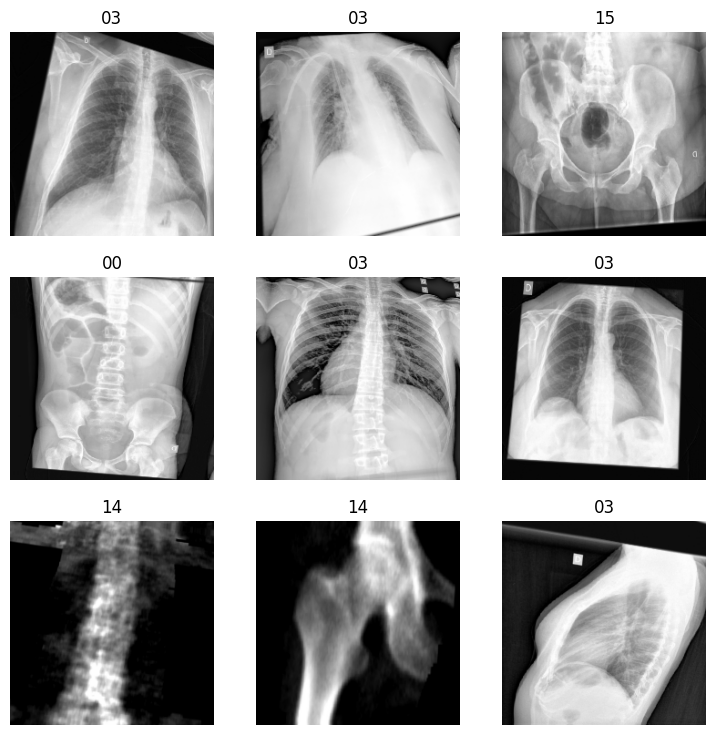

In [ ]:
# Show batch of data
dls.show_batch()


In [ ]:
# Initialize model
learn = vision_learner(dls, vgg16_bn , metrics=accuracy)

Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /root/.cache/torch/hub/checkpoints/vgg16_bn-6c64b313.pth
100%|██████████| 528M/528M [00:34<00:00, 15.9MB/s]


In [ ]:
# Find LR
#learn.lr_find()

KeyboardInterrupt: 

In [ ]:
# Train the model
learn.fine_tune(10, 0.0008317637839354575)

epoch,train_loss,valid_loss,accuracy,time
0,3.938656,2.165648,0.458824,00:11


epoch,train_loss,valid_loss,accuracy,time
0,2.368224,1.762565,0.580392,00:12
1,2.115175,1.167458,0.729412,00:12
2,1.736420,0.817823,0.784314,00:12
3,1.394641,0.623205,0.843137,00:12
4,1.140244,0.534489,0.858824,00:12
5,0.962857,0.474260,0.874510,00:12
6,0.815185,0.452756,0.874510,00:12
7,0.706089,0.442521,0.878431,00:12
8,0.622139,0.435425,0.878431,00:12
9,0.546377,0.433608,0.878431,00:12


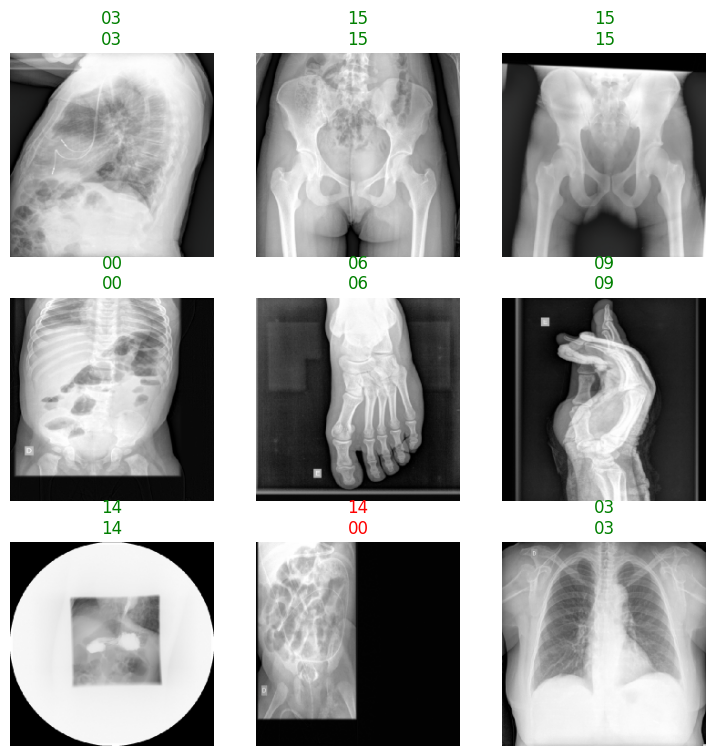

In [ ]:
# Show a batch of predictions
learn.show_results()

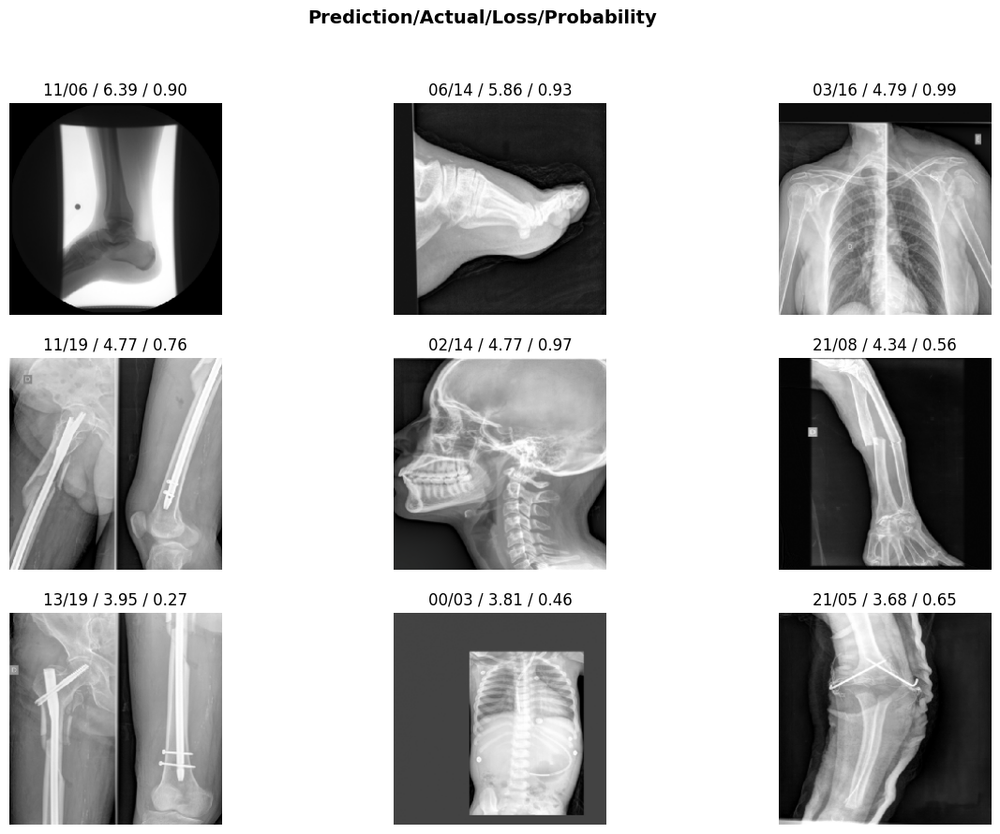

In [ ]:
# Show worst classified images
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(9, figsize=(15,10))

In [ ]:
from fastai.vision.all import *  # Importar todo desde fastai.vision
import os


# Hacer predicciones sobre las imágenes de test
test_path = Path("/content/imagenes_test")  # Ruta a las imágenes de test
test_images = get_image_files(test_path)
test_dl = dls.test_dl(test_images)  # Crear un DataLoader para las imágenes de test
preds, _ = learn.get_preds(dl=test_dl)

# Obtener los nombres de los archivos PNG (SOAP instances)
soap_instances = [os.path.splitext(os.path.basename(fn))[0] for fn in test_images]

# Convertir las predicciones a etiquetas predichas
pred_labels = [learn.dls.vocab[pred.argmax()] for pred in preds]

# Crear un DataFrame de pandas con los SOAP y las etiquetas predichas
data = {"SOPInstanceUID": soap_instances, "Target": pred_labels}
df = pd.DataFrame(data)

df.head()


,SOPInstanceUID,Target
0,1.2.826.0.1.3680043.8.498.82496683259058624581931962359144322169,03
1,1.2.826.0.1.3680043.8.498.85006210041675057929961354275447248755,00
2,1.2.826.0.1.3680043.8.498.87935379073442194933586677724267942859,15
3,1.2.826.0.1.3680043.8.498.92127115820268888239113572137981968546,13
4,1.2.826.0.1.3680043.8.498.94628786370134083856021264951776222688,03


In [ ]:

# Guardar el DataFrame en un archivo CSV
df.to_csv("FastAI.csv", index=False)


## Ensamble

In [ ]:
import os
import random
import glob
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image, ImageEnhance, ImageFilter
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Input, Activation, Add, ReLU, Convolution2D, BatchNormalization, Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D,Dense, Flatten, Concatenate
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from zipfile import ZipFile
from tqdm.notebook import tqdm as tqdm_notebook


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls "/content/drive/My Drive/"


 01_1_EDA.ipynb				   EDEM_1_Tokenizado.ipynb
 01_2_EDA.ipynb				   metaflow-basics.ipynb
 01_Regression.ipynb			   metaflow-model-training.ipynb
 02_LinearRegressionImplementation.ipynb   trainset+mura_images
 02_Normalizacion.ipynb			   Workshop_1_Visión_Artificial.ipynb
 03_Classificacion.ipynb		   Workshop_2_CIFAR10.ipynb
 04_Perceptron.ipynb			  'Workshop_3_Mnist (Solved).ipynb'
 bankmarketing.csv			   Workshop_5_Segmentation_fastai.ipynb
'Colab Notebooks'			   Workshop_8_Challenge.ipynb
 Colab_Notebooks


In [ ]:
Y_train = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/train.csv", delimiter=',')
Y_test = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/sample_submission.csv", delimiter=',')

In [ ]:
# Directorio donde se extraerán los archivos
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/sorted_train_images.zip" -d "/content/train_images"
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/test.zip" -d "/content/test_images/"

Archive:  /content/drive/My Drive/Colab_Notebooks/DP4/sorted_train_images.zip
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.84376932274171387825449553240103366458.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.10677807821925693390499268368372932921.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.49400526067632042474199585836196052618.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.66322363497584370900137914447702444544.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.46435289400241312752698231528369523618.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.12026546951142746370157902599973764184.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.78130438947168388315140188988306288915.png  
  inflating: /conte

In [ ]:
import os
from PIL import Image
import numpy as np

def load_and_save_images(folder_path, dataframe, output_base_path):
    images = []
    labels = []
    # Asegurar que exista el directorio base de salida
    if not os.path.exists(output_base_path):
        os.mkdir(output_base_path)

    for _, row in dataframe.iterrows():
        file_path = os.path.join(folder_path, row['SOPInstanceUID'] + '.png')  # Asumiendo que las extensiones son .png
        # Formatear el nombre del target folder para incluir ceros delante si es necesario
        target_folder_name = str(row['Target']).zfill(2)
        target_folder = os.path.join(output_base_path, target_folder_name)

        # Crear el directorio del Target si no existe
        if not os.path.exists(target_folder):
            os.mkdir(target_folder)

        # Cargar la imagen
        with Image.open(file_path) as img:
            img_array = np.array(img)
            images.append(img_array)
            labels.append(row['Target'])

        # Guardar la imagen en la carpeta correspondiente
        output_path = os.path.join(target_folder, row['SOPInstanceUID'] + '.png')
        img.save(output_path)

    return np.array(images), np.array(labels)


In [ ]:
# Rutas a los directorios
test_images_path = '/content/test_images'
output_test_images_path = '/content/sorted_test_images'

# Cargar y guardar las imágenes de entrenamiento
X_test, Y_test_labels = load_and_save_images(test_images_path, Y_test, output_test_images_path)


In [ ]:
listtrain = os.listdir("/content/train_images")
number_files_train = len(listtrain)
print(number_files_train)

listtest = os.listdir("/content/test_images")
number_files_test = len(listtest)
print(number_files_test)

1
328


In [ ]:
X_test.shape

(328, 512, 512)

### PREDICIONES

In [ ]:
X_test.shape

(328, 512, 512)

In [ ]:
# Asumiendo que X_test es un array de imágenes en escala de grises de shape (328, 512, 512)
# Primero, expande la dimensión de canales
X_test = tf.expand_dims(X_test, axis=-1)  # Esto cambiará la forma a (328, 512, 512, 1)




In [ ]:
X_test.shape

TensorShape([328, 512, 512, 1])

In [ ]:
def preprocess_images(images, target_size=(224, 224)):
    # Redimensiona las imágenes
    images = tf.image.resize(images, target_size)  # Ahora, esto redimensionará correctamente
    return images

# Redimensionar las imágenes
X_test_resized = preprocess_images(X_test)

# Verifica la forma del tensor antes de predecir
print("Forma del tensor de imágenes redimensionadas:", X_test_resized.shape)
# Debería ser (328, 256, 256, 1) para imágenes en escala de grises

# Si las imágenes deben ser a color y tienen 3 canales, asegúrate de que X_test inicialmente tenga esa cuarta dimensión.

Forma del tensor de imágenes redimensionadas: (328, 224, 224, 1)


In [ ]:
X_test.shape

TensorShape([328, 512, 512, 1])

In [ ]:
X_test_resized.shape

TensorShape([328, 224, 224, 1])

In [ ]:
import tensorflow as tf

# Función para convertir imágenes de escala de grises a RGB
def convert_to_rgb(images):
    # Repite el canal de grises tres veces para simular una imagen RGB
    images_rgb = tf.image.grayscale_to_rgb(images)
    return images_rgb

# Asumiendo que X_test_resized ya está en la forma (328, 224, 224, 1)
X_test_rgb = convert_to_rgb(X_test_resized)

# Ahora X_test_rgb debería tener la forma (328, 224, 224, 3)
print("Forma del tensor de imágenes RGB:", X_test_rgb.shape)

Forma del tensor de imágenes RGB: (328, 224, 224, 3)


In [ ]:
from tensorflow.keras import Sequential, layers

# Configuración inicial
original_size = 224
crop_factor = 0.9
crop_size = int(original_size * crop_factor)  # Aproximadamente 201 píxeles

# Secuencia completa de preprocesamiento
data_augmentation = Sequential([
    layers.Rescaling(1./255),  # Reescalado de intensidad de píxeles
    layers.RandomRotation(factor=0.1),  # Rango de ±10 grados
    layers.RandomTranslation(height_factor=0.2, width_factor=0.2, fill_mode='reflect'),
    layers.RandomCrop(height=crop_size, width=crop_size),  # Tamaño específico del recorte
    layers.RandomZoom(height_factor=(-0.1, 0.2), width_factor=(-0.1, 0.2))  # Zoom de +/- 10%
])


In [ ]:
# Supongamos que X_test_rgb es un tensor o un batch de imágenes
processed_images = data_augmentation(X_test_rgb)  # Aplica el preprocesamiento


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Layer

class LayerScale(Layer):
    def __init__(self, init_values=1e-06, projection_dim=None, **kwargs):
        super(LayerScale, self).__init__(**kwargs)
        self.init_values = init_values
        self.projection_dim = projection_dim  # This might represent some dimensionality characteristic

    def build(self, input_shape):
        # Assuming 'projection_dim' is used to define the shape of the 'gamma' weight
        if self.projection_dim is None:
            self.projection_dim = input_shape[-1]

        self.gamma = self.add_weight(
            name='gamma',
            shape=(self.projection_dim,),
            initializer=tf.keras.initializers.Constant(self.init_values),
            trainable=True)

    def call(self, inputs):
        return inputs * self.gamma


In [ ]:


import numpy as np
from tensorflow.keras.models import load_model

# Paths to your saved models
model_paths = [
    '/content/drive/My Drive/Colab_Notebooks/DP4/modelconvxllarge_try11_092.h5',
    '/content/drive/My Drive/Colab_Notebooks/DP4/modeleDenseNet201EfficientNetV2B2_try13_089.h5',
    '/content/drive/My Drive/Colab_Notebooks/DP4/modeleXceptionResNet152V2_try13_091.h5',
    '/content/drive/My Drive/Colab_Notebooks/DP4/modelVGG19InceptionResNetV2_try13_091.h5',
    '/content/drive/My Drive/Colab_Notebooks/DP4/modelconvxllarge3_try11_093.h5',
    '/content/drive/My Drive/Colab_Notebooks/DP4/modelconvxllargeydense_0929.h5'


]

# Load each model with the custom LayerScale included
models = [load_model(path, custom_objects={'LayerScale': LayerScale}) for path in model_paths]

# # Example usage with your ensemble predictions
# def ensemble_predictions(models, data):
#     predictions = [model.predict(data) for model in models]
#     predictions = np.mean(predictions, axis=0)
#     return predictions

# #Assuming X_test_rgb is prepared correctly
# predictions = ensemble_predictions(models, X_test_rgb)
# final_predictions = np.argmax(predictions, axis=1)

# def majority_voting(models, data):
#     predictions = [np.argmax(model.predict(data), axis=1) for model in models]
#     predictions = np.array(predictions)
#     majority_vote = np.apply_along_axis(lambda x: np.bincount(x).argmax(), axis=0, arr=predictions)
#     return majority_vote

# # Assuming X_test_rgb is prepared correctly
# final_predictions = majority_voting(models, X_test_rgb)

def weighted_average_predictions(models, data, weights):
    predictions = [model.predict(data) for model in models]
    weighted_predictions = np.tensordot(predictions, weights, axes=(0, 0))
    return weighted_predictions / np.sum(weights)

# Asumiendo que tienes una lista de pesos de la misma longitud que el número de modelos
weights = [ 0.1667,  0.1667,  0.1667,  0.1667,  0.1667,  0.1667]
weighted_predictions = weighted_average_predictions(models, X_test_rgb, weights)
final_predictions = np.argmax(weighted_predictions, axis=1)


11/11 [==============================] - 20s 1s/step


In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# import pandas as pd
# from ipywidgets import interact, IntSlider

# # Suponiendo que X_test_rgb son tus imágenes y que predicted_class_names contiene las clases predichas
# Y_test['Predicted'] = predicted_class_names

# def plot_image(index):
#     plt.figure(figsize=(5, 5))
#     plt.imshow(X_test_rgb[index] / 255.0)  # Asegúrate de que las imágenes estén normalizadas si es necesario
#     plt.title(f'Predicted: {Y_test.loc[index, "Predicted"]}')
#     plt.axis('off')
#     plt.show()

# # Crear un slider para navegar entre las imágenes
# interact(plot_image, index=IntSlider(min=0, max=len(X_test_rgb)-1, step=1, value=0))


In [ ]:
# current_index = 326

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# import pandas as pd

# # Suponiendo que X_test_rgb son tus imágenes y que predicted_class_names contiene las clases predichas
# Y_test['Predicted'] = predicted_class_names

# # Inicializar una variable global para seguir el índice de la imagen actual
# if 'current_index' not in globals():
#     current_index = 0  # Comienza desde el primer índice al iniciar

# def plot_next_images():
#     global current_index
#     fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Ajusta el tamaño si es necesario

#     # Mostrar las próximas tres imágenes
#     for i in range(3):
#         index = current_index + i
#         if index < len(X_test_rgb):  # Verificar que el índice no exceda el número de imágenes disponibles
#             axes[i].imshow(X_test_rgb[index] / 255.0)  # Normalizar si es necesario
#             axes[i].set_title(f'Predicted: {Y_test.loc[index, "Predicted"]}')
#             axes[i].axis('off')
#         else:
#             axes[i].axis('off')  # Ocultar los ejes si el índice excede el número de imágenes

#     # Mostrar el rango de imágenes actual y el total
#     plt.suptitle(f'Images {current_index+1} to {min(current_index+3, len(X_test_rgb))} of {len(X_test_rgb)}')

#     # Actualizar el índice actual para la próxima ejecución
#     current_index += 3
#     if current_index >= len(X_test_rgb):  # Resetear el índice si alcanzamos el final del conjunto de datos
#         current_index = 0

#     plt.show()

# # Ejecutar la función para mostrar las imágenes
# plot_next_images()


In [ ]:
# Y_test.drop('Predicted', axis=1, inplace=True)

In [ ]:
# Resetear el índice de Y_test y eliminar el índice anterior
Y_test.reset_index(drop=True, inplace=True)

In [ ]:
Y_test['Target'] = final_predictions

In [ ]:
print(Y_test.columns)

Index(['SOPInstanceUID', 'Target'], dtype='object')


In [ ]:
Y_test.to_csv('/content/predicted_bobb3.csv', index=False)


## Try1

In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 75 bytes


In [ ]:
!pip install pydicom

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 12.5 MB/s eta 0:00:00


In [ ]:
!kaggle competitions download -c edem-mda-b-2023-24-data-project-4

100% 19.1G/19.1G [03:02<00:00, 97.5MB/s]
100% 19.1G/19.1G [03:02<00:00, 112MB/s] 


In [ ]:
import os
import random
import glob
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image, ImageEnhance, ImageFilter
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Input, Activation, Add, ReLU, Convolution2D, BatchNormalization, Dropout, AveragePooling2D, Dense, Flatten, Concatenate
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from zipfile import ZipFile
from tqdm.notebook import tqdm as tqdm_notebook  # Updated to use the correct tqdm for Jupyter Notebook


In [ ]:
from zipfile import ZipFile
file_name = "/content/edem-mda-b-2023-24-data-project-4.zip"
with ZipFile(file_name,'r') as zip:
  zip.extractall()
  print('Done')

Done


In [ ]:
path_train = "/content/train"
path_test = "/content/test"
traind = []
testnd = []
Y_train = pd.read_csv('/content/train.csv', delimiter=',')
Y_test = pd.read_csv('/content/sample_submission.csv', delimiter=',')

In [ ]:
Y_test

,Target
SOPInstanceUID,
1.2.826.0.1.3680043.8.498.75932240489221075589097397484896361550,0
1.2.826.0.1.3680043.8.498.80518330963406833915089209886834390159,0
1.2.826.0.1.3680043.8.498.97413731471864060627365739417678218380,0
1.2.826.0.1.3680043.8.498.98229201581139590153090960568103270985,0
1.2.826.0.1.3680043.8.498.84551354213532970228348448377009898172,0
...,...
1.2.826.0.1.3680043.8.498.60964782211363234805993194732570333546,0
1.2.826.0.1.3680043.8.498.90617059056548212763113895515703343197,0
1.2.826.0.1.3680043.8.498.77795747668217965858748681496943891312,0


In [ ]:
Y_train

,Target
SOPInstanceUID,
1.2.826.0.1.3680043.8.498.10062189329714053601496804394945741428,14
1.2.826.0.1.3680043.8.498.53411283183733547704967879802673908605,3
1.2.826.0.1.3680043.8.498.12955484645689261949928855045724356601,3
1.2.826.0.1.3680043.8.498.10408703585974384892701383895533277303,3
1.2.826.0.1.3680043.8.498.30255106562321206269035908958425925148,9
...,...
1.2.826.0.1.3680043.8.498.61418411983294329010448856651195244378,3
1.2.826.0.1.3680043.8.498.10229701585590529671513310166835241727,6
1.2.826.0.1.3680043.8.498.67348831696239827753980449955973800832,11


In [ ]:
def preprocess_dicom(path_to_dicom, target_size=(256, 256)):
    dicom_image = pydicom.dcmread(path_to_dicom)
    image_array = dicom_image.pixel_array
    image_array = image_array.astype(np.float32) / np.max(image_array)
    image_array = resize(image_array, target_size, mode='constant', anti_aliasing=True)
    return image_array

In [ ]:
train_files = [os.path.join(path_train, file) for file in os.listdir(path_train) if file.endswith('.dcm')]
test_files = [os.path.join(path_test, file) for file in os.listdir(path_test) if file.endswith('.dcm')]

In [ ]:
# Cargar y procesar imágenes de entrenamiento
train_images = []
for file_path in train_files:
    if os.path.exists(file_path):
        img = preprocess_dicom(file_path)
        train_images.append(img)

train_images = np.array(train_images)

/usr/local/lib/python3.10/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:238: UserWarning: The (0028,0101) 'Bits Stored' value (15-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:238: UserWarning: The (0028,0101) 'Bits Stored' value (10-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  warnings.warn(


In [ ]:
# Similarmente para las imágenes de prueba
test_images = []
for file_path in test_files:
    if os.path.exists(file_path):
        img = preprocess_dicom(file_path)
        test_images.append(img)

test_images = np.array(test_images)

/usr/local/lib/python3.10/dist-packages/pydicom/pixel_data_handlers/pillow_handler.py:238: UserWarning: The (0028,0101) 'Bits Stored' value (12-bit) doesn't match the JPEG 2000 data (16-bit). It's recommended that you change the 'Bits Stored' value
  warnings.warn(


In [ ]:
from tensorflow.keras.utils import to_categorical

# Suponiendo que tus etiquetas ya están en formato numérico adecuado
y_train = to_categorical(Y_train['Target'].values)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

model = Sequential([
    tf.keras.layers.Conv2D(16, (3, 3), activation='relu', input_shape=(256, 256, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(22, activation='softmax')
])



In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
history = model.fit(test_images, y_train, epochs=33, validation_split=0.2, batch_size=40)


Epoch 1/33
26/26 [==============================] - 5s 82ms/step - loss: 3.2625 - accuracy: 0.4012 - val_loss: 2.2946 - val_accuracy: 0.4570
Epoch 2/33
26/26 [==============================] - 1s 35ms/step - loss: 2.2490 - accuracy: 0.4521 - val_loss: 2.2310 - val_accuracy: 0.4570
Epoch 3/33
26/26 [==============================] - 1s 35ms/step - loss: 2.2100 - accuracy: 0.4521 - val_loss: 2.2267 - val_accuracy: 0.4570
Epoch 4/33
26/26 [==============================] - 1s 35ms/step - loss: 2.1974 - accuracy: 0.4521 - val_loss: 2.2370 - val_accuracy: 0.4570
Epoch 5/33
26/26 [==============================] - 1s 35ms/step - loss: 2.1910 - accuracy: 0.4501 - val_loss: 2.2690 - val_accuracy: 0.4531
Epoch 6/33
26/26 [==============================] - 1s 35ms/step - loss: 2.1825 - accuracy: 0.4550 - val_loss: 2.2653 - val_accuracy: 0.4570
Epoch 7/33
26/26 [==============================] - 1s 35ms/step - loss: 2.1103 - accuracy: 0.4638 - val_loss: 2.3388 - val_accuracy: 0.4570
Epoch 8/33
26

In [ ]:
predictions = model.predict(train_images)


11/11 [==============================] - 1s 50ms/step


In [ ]:
predicted_classes = np.argmax(predictions, axis=1)


In [ ]:
print(len(train_images))
print(len(Y_test))


328
328


In [ ]:
# Lista todos los archivos en el directorio que terminan con '.dcm'
files_in_test_directory = [file for file in os.listdir(path_test) if file.endswith('.dcm')]

# Contar el número de archivos
number_of_images = len(files_in_test_directory)
print("Número de imágenes en la carpeta de test:", number_of_images)

Número de imágenes en la carpeta de test: 1278


In [ ]:
# Lista todos los archivos en el directorio que terminan con '.dcm'
files_in_test_directory = [file for file in os.listdir(path_train) if file.endswith('.dcm')]

# Contar el número de archivos
number_of_images = len(files_in_test_directory)
print("Número de imágenes en la carpeta de test:", number_of_images)

Número de imágenes en la carpeta de test: 328


In [ ]:
Y_test['Target'] = predicted_classes


In [ ]:
# Resetear el índice del DataFrame, convirtiendo el índice en una columna
Y_test_reset = Y_test.reset_index()

# Renombrar las columnas si es necesario
Y_test_reset.columns = ['SOPInstanceUID', 'Target']

# Guardar el DataFrame a CSV
Y_test_reset.to_csv('/content/predicted_test.csv', index=False)


In [ ]:
import os
import pydicom
from PIL import Image
import numpy as np

def convert_dicom_to_png(dicom_folder, output_folder):
    # Asegúrate de que el directorio de salida existe
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Iterar sobre todos los archivos en el directorio DICOM
    for filename in os.listdir(dicom_folder):
        if filename.endswith(".dcm"):
            # Construir la ruta completa al archivo DICOM
            dicom_path = os.path.join(dicom_folder, filename)
            # Leer el archivo DICOM
            dicom_image = pydicom.dcmread(dicom_path)
            # Extraer la matriz de la imagen
            image_array = dicom_image.pixel_array

            # Normalizar la imagen para el rango de 0 a 255
            image_array = (np.maximum(image_array, 0) / image_array.max()) * 255.0
            image_array = np.uint8(image_array)

            # Convertir a una imagen de PIL para guardar en formato PNG
            image = Image.fromarray(image_array)
            # Construir la ruta del archivo de salida
            png_filename = filename.replace('.dcm', '.png')
            png_path = os.path.join(output_folder, png_filename)
            # Guardar la imagen
            image.save(png_path)
            print(f"Converted {dicom_path} to {png_path}")

# Ejemplo de uso:
dicom_folder = "/content/train"
output_folder = "/content/train_png"
convert_dicom_to_png(dicom_folder, output_folder)


## Try2

In [ ]:
import os
import random
import glob
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image, ImageEnhance, ImageFilter
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Input, Activation, Add, ReLU, Convolution2D, BatchNormalization, Dropout, AveragePooling2D, Dense, Flatten, Concatenate
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from zipfile import ZipFile
from tqdm.notebook import tqdm as tqdm_notebook
import pydicom


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls "/content/drive/My Drive/"


 01_1_EDA.ipynb		  03_Classificacion.ipynb  'Makis - Betera. 2ª Parte. 26-feb-2024.mp4'
 01_2_EDA.ipynb		  04_Perceptron.ipynb	   'Makis - Betera Salut. 1ª Parte-26-feb-2024.mp4'
 01_Regression.ipynb	  bankmarketing.csv
 02_Normalizacion.ipynb   Colab_Notebooks


In [ ]:
Y_train = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/train.csv", delimiter=',')
Y_test = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/sample_submission.csv", delimiter=',')

In [ ]:
# Directorio donde se extraerán los archivos
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/train.zip" -d "/content/train_images/"
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/test.zip" -d "/content/test_images/"

Archive:  /content/drive/My Drive/Colab_Notebooks/DP4/train.zip
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.15126022716559326221899996790039127181.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.69682764742272243483567433730826095292.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.31810093671028409725531983437853041806.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.16635833228585136455893778876225405045.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.33344784114194203014253567431793927863.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.11217490288602515607354344525463586055.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.14477586337410179309381694095880819502.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.10921163894995839905985376916380372297.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.304930802819350860884226659

In [ ]:
listtrain = os.listdir("/content/train_images")
number_files_train = len(listtrain)
print(number_files_train)

listtest = os.listdir("/content/test_images")
number_files_test = len(listtest)
print(number_files_test)

1278
328


In [ ]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def load_and_normalize_images(folder_path, dataframe):
    images = []
    labels = []
    # Iterar sobre el DataFrame garantiza que el orden de las imágenes cargadas coincida con el orden de las etiquetas
    for _, row in dataframe.iterrows():
        file_path = os.path.join(folder_path, row['SOPInstanceUID'] + '.png')  # Asumiendo que las extensiones son .png
        with Image.open(file_path) as img:
            img_array = np.array(img) / 255.0  # Normalización
            images.append(img_array)
            labels.append(row['Target'])
    return np.array(images), np.array(labels)

# Rutas a los directorios
train_images_path = '/content/train_images'
test_images_path = '/content/test_images'

# Cargar y normalizar las imágenes
X_train, Y_train_labels = load_and_normalize_images(train_images_path, Y_train)
X_test, Y_test_labels = load_and_normalize_images(test_images_path, Y_test)



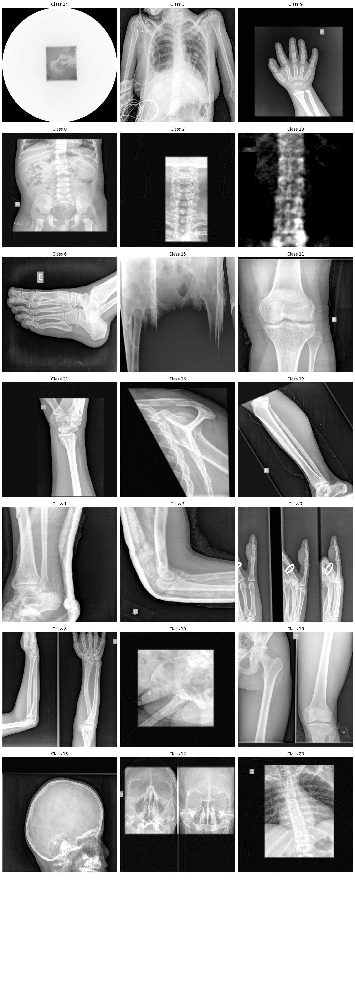

In [ ]:
import matplotlib.pyplot as plt

# Supongamos que tienes 21 clases diferentes
num_classes = 21
fig, axs = plt.subplots(nrows=(num_classes // 3 + 1), ncols=3, figsize=(15, num_classes * 2))
axs = axs.flatten()  # Aplana el array de axes para facilitar el acceso

# Encuentra y traza la primera imagen de cada clase
found_classes = set()
for idx, label in enumerate(Y_train_labels):
    if label not in found_classes:
        axs[len(found_classes)].imshow(X_train[idx], cmap='gray')
        axs[len(found_classes)].title.set_text("Class {}".format(label))
        axs[len(found_classes)].axis('off')
        found_classes.add(label)
        if len(found_classes) == num_classes:
            break

# Oculta los axes adicionales si no son necesarios
for i in range(len(found_classes), len(axs)):
    axs[i].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
X_train = np.stack(X_train, axis=0)
X_test = np.stack(X_test, axis=0)

In [ ]:
print("X_train original shape:", X_train.shape)
print("y_train original shape:", Y_train.shape)
print("X_test original shape:", X_test.shape)
print("y_test original shape:", Y_test.shape)

X_train original shape: (1278, 512, 512)
y_train original shape: (1278, 2)
X_test original shape: (328, 512, 512)
y_test original shape: (328, 2)


In [ ]:
Y_train

,SOPInstanceUID,Target
0,1.2.826.0.1.3680043.8.498.10062189329714053601...,14
1,1.2.826.0.1.3680043.8.498.53411283183733547704...,3
2,1.2.826.0.1.3680043.8.498.12955484645689261949...,3
3,1.2.826.0.1.3680043.8.498.10408703585974384892...,3
4,1.2.826.0.1.3680043.8.498.30255106562321206269...,9
...,...,...
1273,1.2.826.0.1.3680043.8.498.61418411983294329010...,3
1274,1.2.826.0.1.3680043.8.498.10229701585590529671...,6
1275,1.2.826.0.1.3680043.8.498.67348831696239827753...,11
1276,1.2.826.0.1.3680043.8.498.10105498531842222086...,3


In [ ]:
from tensorflow.keras.utils import to_categorical
num_clases = 22
# Asegúrate de que las etiquetas son enteros antes de aplicar to_categorical
Y_train['Target'] = Y_train['Target'].astype(int)

# Aplicar codificación one-hot
Y_train_one_hot = to_categorical(Y_train['Target'], num_clases)

In [ ]:
print("Forma de Y_train_one_hot:", Y_train_one_hot.shape)
print("Primeras 5 filas de Y_train_one_hot:\n", Y_train_one_hot[:5])


Forma de Y_train_one_hot: (1278, 22)
Primeras 5 filas de Y_train_one_hot:
 [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]


In [ ]:
Y_train_one_hot = Y_train_one_hot.astype('uint8')


In [ ]:
print("Forma de Y_train_one_hot:", Y_train_one_hot.shape)
print("Primeras 5 filas de Y_train_one_hot:\n", Y_train_one_hot[:5])


Forma de Y_train_one_hot: (1278, 22)
Primeras 5 filas de Y_train_one_hot:
 [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]]


In [ ]:
print("X_train original dtype:", X_train.dtype)
print("y_train original dytpe:", Y_train_one_hot.dtype)
print("X_test original dtype:", X_test.dtype)
#print("y_test original dtype:", Y_test.dtype)

X_train original dtype: float64
y_train original dytpe: uint8
X_test original dtype: float64


In [ ]:
print("Training matrix range:", "[", X_train.min(), ",", X_train.max(), "]")
print("Testing matrix range:", "[", X_test.min(), ",", X_test.max(), "]")

Training matrix range: [ 0.0 , 1.0 ]
Testing matrix range: [ 0.0 , 1.0 ]


In [ ]:
Y_train_one_hot.shape

(1278, 22)

In [ ]:
X_train.shape

(1278, 512, 512)

### EDA


In [ ]:
Y_train

,SOPInstanceUID,Target
0,1.2.826.0.1.3680043.8.498.10062189329714053601...,14
1,1.2.826.0.1.3680043.8.498.53411283183733547704...,3
2,1.2.826.0.1.3680043.8.498.12955484645689261949...,3
3,1.2.826.0.1.3680043.8.498.10408703585974384892...,3
4,1.2.826.0.1.3680043.8.498.30255106562321206269...,9
...,...,...
1273,1.2.826.0.1.3680043.8.498.61418411983294329010...,3
1274,1.2.826.0.1.3680043.8.498.10229701585590529671...,6
1275,1.2.826.0.1.3680043.8.498.67348831696239827753...,11
1276,1.2.826.0.1.3680043.8.498.10105498531842222086...,3


In [ ]:
Y_train['Target'].value_counts()

Target
3     579
14     96
11     81
0      64
2      61
6      56
15     53
21     50
16     32
1      32
13     31
9      24
5      18
17     18
10     15
12     15
7      12
20     12
8       9
18      8
4       7
19      5
Name: count, dtype: int64

#PRE-PROCESING

### Model


In [ ]:
import numpy as np

# Añade un eje al final para representar el canal único
X_train = np.expand_dims(X_train, axis=-1)


In [ ]:
import numpy as np

# Añade un eje al final para representar el canal único
X_test = np.expand_dims(X_test, axis=-1)


In [ ]:
print("Forma de X_test:", X_test.shape)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

model = Sequential([
    Conv2D(16, (3, 3), activation='relu', input_shape=(512, 512, 1)),
    MaxPooling2D(2, 2),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(22, activation='softmax')
])

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history = model.fit(X_train, Y_train_one_hot, epochs=5, validation_split=0.2, batch_size=20)

Epoch 1/5
52/52 [==============================] - 113s 2s/step - loss: 3.0944 - accuracy: 0.4530 - val_loss: 1.5244 - val_accuracy: 0.5742
Epoch 2/5
52/52 [==============================] - 110s 2s/step - loss: 1.1641 - accuracy: 0.6556 - val_loss: 1.4236 - val_accuracy: 0.6133
Epoch 3/5
52/52 [==============================] - 110s 2s/step - loss: 0.4501 - accuracy: 0.8787 - val_loss: 1.7699 - val_accuracy: 0.5000
Epoch 4/5
52/52 [==============================] - 111s 2s/step - loss: 0.1321 - accuracy: 0.9687 - val_loss: 2.0063 - val_accuracy: 0.6055
Epoch 5/5
52/52 [==============================] - 111s 2s/step - loss: 0.0765 - accuracy: 0.9775 - val_loss: 1.9979 - val_accuracy: 0.6641


In [ ]:
predictions = model.predict(X_test)

11/11 [==============================] - 7s 642ms/step


In [ ]:
predicted_classes = np.argmax(predictions, axis=1)

In [ ]:
print(len(X_test))
print(len(Y_test))

328
328


In [ ]:
Y_test['Target'] = predicted_classes

In [ ]:
Y_test

,SOPInstanceUID,Target
0,1.2.826.0.1.3680043.8.498.75932240489221075589...,3
1,1.2.826.0.1.3680043.8.498.80518330963406833915...,0
2,1.2.826.0.1.3680043.8.498.97413731471864060627...,2
3,1.2.826.0.1.3680043.8.498.98229201581139590153...,3
4,1.2.826.0.1.3680043.8.498.84551354213532970228...,3
...,...,...
323,1.2.826.0.1.3680043.8.498.60964782211363234805...,3
324,1.2.826.0.1.3680043.8.498.90617059056548212763...,3
325,1.2.826.0.1.3680043.8.498.77795747668217965858...,3
326,1.2.826.0.1.3680043.8.498.83898837859028979514...,3


In [ ]:
print(Y_test.columns)

Index(['SOPInstanceUID', 'Target'], dtype='object')


In [ ]:
Y_test_reset = Y_test.reset_index(drop=True)

In [ ]:
print(Y_test_reset.columns)  # Verificar las columnas después de resetear el índice

# Si todo está correcto, renombra las columnas si es necesario
Y_test_reset.columns = ['SOPInstanceUID', 'Target']  # Asegúrate de que esto coincida con las columnas reales


Index(['SOPInstanceUID', 'Target'], dtype='object')


In [ ]:
Y_test_reset.to_csv('/content/predicted_B.csv', index=False)


## Try3

In [ ]:
import os
import random
import glob
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image, ImageEnhance, ImageFilter
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Input, Activation, Add, ReLU, Convolution2D, BatchNormalization, Dropout, AveragePooling2D, Dense, Flatten, Concatenate
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from zipfile import ZipFile
from tqdm.notebook import tqdm as tqdm_notebook
import pydicom


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls "/content/drive/My Drive/"


 01_1_EDA.ipynb		  'Colab Notebooks'
 01_2_EDA.ipynb		   Colab_Notebooks
 01_Regression.ipynb	  'Makis - Betera. 2ª Parte. 26-feb-2024.mp4'
 02_Normalizacion.ipynb   'Makis - Betera Salut. 1ª Parte-26-feb-2024.mp4'
 03_Classificacion.ipynb   Workshop_1_Visión_Artificial.ipynb
 04_Perceptron.ipynb	   Workshop_2_CIFAR10.ipynb
 bankmarketing.csv


In [ ]:
Y_train = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/train.csv", delimiter=',')
Y_test = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/sample_submission.csv", delimiter=',')

In [ ]:
# Directorio donde se extraerán los archivos
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/train.zip" -d "/content/train_images/"
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/test.zip" -d "/content/test_images/"

Archive:  /content/drive/My Drive/Colab_Notebooks/DP4/train.zip
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.15126022716559326221899996790039127181.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.69682764742272243483567433730826095292.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.31810093671028409725531983437853041806.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.16635833228585136455893778876225405045.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.33344784114194203014253567431793927863.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.11217490288602515607354344525463586055.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.14477586337410179309381694095880819502.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.10921163894995839905985376916380372297.png  
  inflating: /content/train_images/1.2.826.0.1.3680043.8.498.304930802819350860884226659

In [ ]:
listtrain = os.listdir("/content/train_images")
number_files_train = len(listtrain)
print(number_files_train)

listtest = os.listdir("/content/test_images")
number_files_test = len(listtest)
print(number_files_test)

1278
328


In [ ]:
import os
from PIL import Image
import numpy as np

def load_and_save_images(folder_path, dataframe, output_base_path):
    images = []
    labels = []
    # Asegurar que exista el directorio base de salida
    if not os.path.exists(output_base_path):
        os.mkdir(output_base_path)

    for _, row in dataframe.iterrows():
        file_path = os.path.join(folder_path, row['SOPInstanceUID'] + '.png')  # Asumiendo que las extensiones son .png
        # Formatear el nombre del target folder para incluir ceros delante si es necesario
        target_folder_name = str(row['Target']).zfill(2)
        target_folder = os.path.join(output_base_path, target_folder_name)

        # Crear el directorio del Target si no existe
        if not os.path.exists(target_folder):
            os.mkdir(target_folder)

        # Cargar la imagen
        with Image.open(file_path) as img:
            img_array = np.array(img)
            images.append(img_array)
            labels.append(row['Target'])

        # Guardar la imagen en la carpeta correspondiente
        output_path = os.path.join(target_folder, row['SOPInstanceUID'] + '.png')
        img.save(output_path)

    return np.array(images), np.array(labels)


In [ ]:
# Rutas a los directorios
train_images_path = '/content/train_images'
test_images_path = '/content/test_images'
output_train_images_path = '/content/sorted_train_images'
output_test_images_path = '/content/sorted_test_images'

# Cargar y guardar las imágenes de entrenamiento
X_train, Y_train_labels = load_and_save_images(train_images_path, Y_train, output_train_images_path)
X_test, Y_test_labels = load_and_save_images(test_images_path, Y_test, output_test_images_path)


In [ ]:
base_dir = '/content/sorted_train_images'
img_size = 256
batch = 64

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(base_dir,
                                                       labels='inferred',
                                                       label_mode='categorical',
                                                       seed=42,
                                                       validation_split = 0.2,
                                                       subset = 'training',
                                                       batch_size = batch,
                                                       image_size = (img_size,img_size))

val_ds = tf.keras.utils.image_dataset_from_directory(base_dir,
                                                     labels='inferred',
                                                     label_mode='categorical',
                                                     seed=42,
                                                     validation_split = 0.2,
                                                     subset = 'validation',
                                                     batch_size = batch,
                                                     image_size = (img_size,img_size))


Found 1278 files belonging to 22 classes.
Using 1023 files for training.
Found 1278 files belonging to 22 classes.
Using 255 files for validation.


In [ ]:
num_classes = len(train_ds.class_names)

In [ ]:
train_classes= train_ds.class_names

In [ ]:
train_classes

['00',
 '01',
 '02',
 '03',
 '04',
 '05',
 '06',
 '07',
 '08',
 '09',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '20',
 '21']

In [ ]:
num_classes

22

In [ ]:
train_ds_iterator = train_ds.as_numpy_iterator()

In [ ]:
train_batch = train_ds_iterator.next()

In [ ]:
train_batch[0].shape

(64, 256, 256, 3)

In [ ]:
train_batch[0]

array([[[[  0.  ,   0.  ,   0.  ],
         [  0.  ,   0.  ,   0.  ],
         [  0.  ,   0.  ,   0.  ],
         ...,
         [ 23.25,  23.25,  23.25],
         [ 25.5 ,  25.5 ,  25.5 ],
         [  3.25,   3.25,   3.25]],

        [[  0.  ,   0.  ,   0.  ],
         [  0.25,   0.25,   0.25],
         [  0.  ,   0.  ,   0.  ],
         ...,
         [ 23.  ,  23.  ,  23.  ],
         [ 21.  ,  21.  ,  21.  ],
         [ 38.  ,  38.  ,  38.  ]],

        [[  0.  ,   0.  ,   0.  ],
         [  0.5 ,   0.5 ,   0.5 ],
         [  2.75,   2.75,   2.75],
         ...,
         [ 36.5 ,  36.5 ,  36.5 ],
         [ 47.25,  47.25,  47.25],
         [ 37.75,  37.75,  37.75]],

        ...,

        [[ 72.  ,  72.  ,  72.  ],
         [ 78.75,  78.75,  78.75],
         [ 87.75,  87.75,  87.75],
         ...,
         [128.5 , 128.5 , 128.5 ],
         [126.25, 126.25, 126.25],
         [118.  , 118.  , 118.  ]],

        [[ 78.75,  78.75,  78.75],
         [ 84.  ,  84.  ,  84.  ],
         [ 9

In [ ]:
type(train_ds)

tensorflow.python.data.ops.prefetch_op._PrefetchDataset

In [ ]:
val_ds_iterator = val_ds.as_numpy_iterator()

In [ ]:
val_batch = val_ds_iterator.next()

In [ ]:
val_batch[0].shape

(64, 256, 256, 3)

In [ ]:
val_batch[0]

array([[[[ 10.5 ,  10.5 ,  10.5 ],
         [  5.  ,   5.  ,   5.  ],
         [  5.25,   5.25,   5.25],
         ...,
         [  5.5 ,   5.5 ,   5.5 ],
         [  5.5 ,   5.5 ,   5.5 ],
         [  5.5 ,   5.5 ,   5.5 ]],

        [[ 10.75,  10.75,  10.75],
         [  5.  ,   5.  ,   5.  ],
         [  5.5 ,   5.5 ,   5.5 ],
         ...,
         [  6.25,   6.25,   6.25],
         [  6.  ,   6.  ,   6.  ],
         [  5.75,   5.75,   5.75]],

        [[ 11.  ,  11.  ,  11.  ],
         [  4.25,   4.25,   4.25],
         [  5.25,   5.25,   5.25],
         ...,
         [  5.25,   5.25,   5.25],
         [  5.75,   5.75,   5.75],
         [  5.75,   5.75,   5.75]],

        ...,

        [[  6.5 ,   6.5 ,   6.5 ],
         [  6.  ,   6.  ,   6.  ],
         [  8.  ,   8.  ,   8.  ],
         ...,
         [  5.75,   5.75,   5.75],
         [  6.25,   6.25,   6.25],
         [  5.5 ,   5.5 ,   5.5 ]],

        [[  6.25,   6.25,   6.25],
         [  6.5 ,   6.5 ,   6.5 ],
         [  

In [ ]:
type(val_ds)

tensorflow.python.data.ops.prefetch_op._PrefetchDataset

In [ ]:
import tensorflow as tf

# Imprimir directamente los valores mínimo y máximo
print("Valor mínimo en el batch:", tf.reduce_min(train_batch[0]).numpy())
print("Valor máximo en el batch:", tf.reduce_max(train_batch[0]).numpy())


Valor mínimo en el batch: 0.0
Valor máximo en el batch: 255.0


In [ ]:
import tensorflow as tf

# Imprimir directamente los valores mínimo y máximo
print("Valor mínimo en el batch:", tf.reduce_min(val_batch[0]).numpy())
print("Valor máximo en el batch:", tf.reduce_max(val_batch[0]).numpy())

Valor mínimo en el batch: 0.0
Valor máximo en el batch: 255.0


In [ ]:
# train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))

In [ ]:
# train_ds = train_ds.map(lambda x, y: (x/255, y))
# val_ds = val_ds.map(lambda x, y: (x/255, y))

In [ ]:
# PLOTEAR BATCH SI QUEREMOS AQUI
# import matplotlib.pyplot as plt
# import numpy as np

# # Crear una figura con 4 subplots (ajustados en una fila)
# fig, ax = plt.subplots(ncols=4, figsize=(10, 10))

# # Iterar sobre los primeros 4 elementos del batch de imágenes
# for idx, img in enumerate(train_batch[0][:4]):
#     # Normaliza la imagen para visualización dividiéndola por 255
#     ax[idx].imshow(img / 255.0, cmap='gray')  # Asegúrate de que la normalización se aplique aquí
#     # Establece el título con la clase de la etiqueta, asumiendo que es un one-hot encoding
#     ax[idx].title.set_text('Clase ' + str(np.argmax(train_batch[1][idx])))
#     ax[idx].axis('off')  # Oculta los ejes

# plt.show()



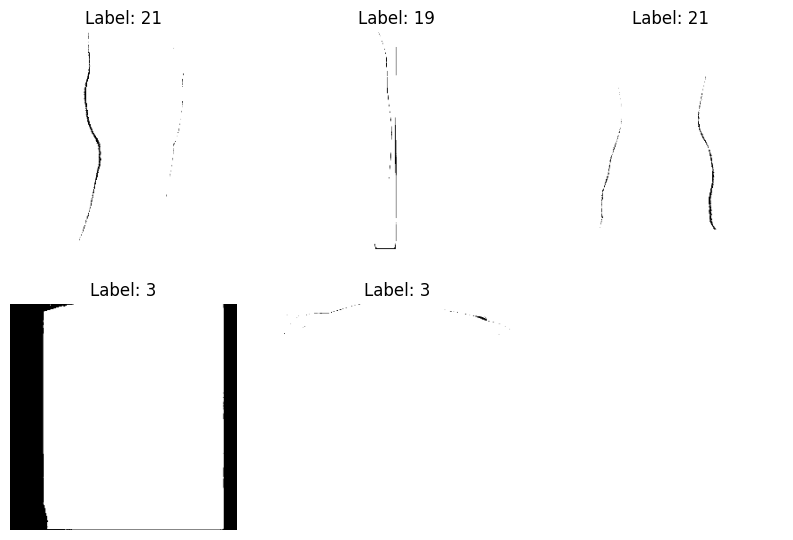

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Asegúrate de que train_ds está batcheado, si no, deberías aplicar .batch(n) donde n es el número de imágenes por batch que deseas.
for images, labels in train_ds.take(1):  # toma solo el primer batch
    # Ahora 'images' contiene un batch de imágenes 'x' normalizadas (dividido por 255)
    break  # Salimos del loop después de tomar el primer batch

n = 5  # Número de imágenes que quieres visualizar
plt.figure(figsize=(10, 10))  # Configura el tamaño de la figura
for i in range(n):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy()/255.0, cmap='gray')  # Muestra la imagen i-ésima del batch
    # Encuentra el índice de la etiqueta que es '1' en el vector one-hot
    label_index = np.argmax(labels[i])
    plt.title(f"Label: {label_index}")  # Muestra el índice como título
    plt.axis("off")
plt.show()


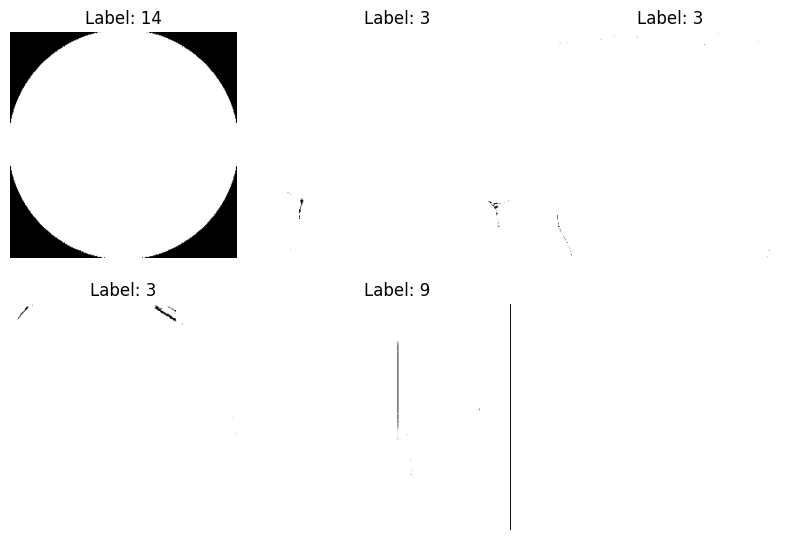

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Asegúrate de que train_ds está batcheado, si no, deberías aplicar .batch(n) donde n es el número de imágenes por batch que deseas.
for images, labels in val_ds.take(1):  # toma solo el primer batch
    # Ahora 'images' contiene un batch de imágenes 'x' normalizadas (dividido por 255)
    break  # Salimos del loop después de tomar el primer batch

n = 5  # Número de imágenes que quieres visualizar
plt.figure(figsize=(10, 10))  # Configura el tamaño de la figura
for i in range(n):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy()/255.0, cmap='gray')  # Muestra la imagen i-ésima del batch
    # Encuentra el índice de la etiqueta que es '1' en el vector one-hot
    label_index = np.argmax(labels[i])
    plt.title(f"Label: {label_index}")  # Muestra el índice como título
    plt.axis("off")
plt.show()


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
train_ds = train_ds.prefetch(buffer_size = AUTOTUNE)

In [ ]:
val_ds = val_ds.prefetch(buffer_size = AUTOTUNE)

In [ ]:
# train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size = AUTOTUNE)

In [ ]:
# val_ds = val_ds.cache().prefetch(buffer_size = AUTOTUNE)

In [ ]:
# DATA AUGMENTATION

### Model


In [ ]:
from tensorflow.keras import Sequential, layers

data_augmentation = Sequential([
    layers.RandomRotation(0.1),  # Rota la imagen en un rango pequeño para no desorientar las estructuras anatómicas
    layers.RandomTranslation(height_factor=0.1, width_factor=0.1, fill_mode='constant'),  # Mueve la imagen ligeramente en vertical y horizontal
    layers.RandomZoom(0.1, fill_mode='constant'),  # Realiza un pequeño zoom hacia adentro o hacia afuera
    layers.RandomContrast(factor=0.1)  # Ajusta el contraste de la imagen para simular variaciones en la exposición
])


In [ ]:
rescale = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255)
])

In [ ]:
from tensorflow.keras.applications import ConvNeXtTiny
# Define the model
Convnextin = ConvNeXtTiny(weights='imagenet', include_top=False,
                        input_shape=(256, 256, 3))

model = Sequential()
data_augmentation,
rescale,
model.add(Convnextin)
model.add(Flatten())
model.add(BatchNormalization())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(BatchNormalization())
model.add(Dense(22, activation='softmax'))

In [ ]:
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Configurar EarlyStopping
early_stopper = EarlyStopping(
    monitor='val_loss',  # Monitorea la pérdida de validación
    patience=3,          # Número de épocas sin mejora tras las cuales se detiene el entrenamiento
    restore_best_weights=True  # Restaura los pesos del modelo con el mejor valor de la métrica monitoreada
)

In [ ]:
# Resumen del modelo
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 convnext_tiny (Functional)  (None, 8, 8, 768)         27820128  
                                                                 
 flatten_1 (Flatten)         (None, 49152)             0         
                                                                 
 batch_normalization_1 (Bat  (None, 49152)             196608    
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 128)               6291584   
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 batch_normalization_2 (Bat  (None, 128)               512       
 chNormalization)                                     

In [ ]:
# Entrenar el modelo
epochs=30
history = model.fit(train_ds,validation_data=val_ds,epochs=epochs,callbacks=[early_stopper])


Epoch 1/30
16/16 [==============================] - 21s 1s/step - loss: 0.1739 - accuracy: 0.9648 - val_loss: 0.4147 - val_accuracy: 0.8941
Epoch 2/30
16/16 [==============================] - 21s 1s/step - loss: 0.1697 - accuracy: 0.9677 - val_loss: 0.4210 - val_accuracy: 0.9020
Epoch 3/30
16/16 [==============================] - 21s 1s/step - loss: 0.1860 - accuracy: 0.9599 - val_loss: 0.4326 - val_accuracy: 0.9020
Epoch 4/30
16/16 [==============================] - 21s 1s/step - loss: 0.1539 - accuracy: 0.9687 - val_loss: 0.3522 - val_accuracy: 0.9216
Epoch 5/30
16/16 [==============================] - 21s 1s/step - loss: 0.1392 - accuracy: 0.9707 - val_loss: 0.3578 - val_accuracy: 0.9098
Epoch 6/30
16/16 [==============================] - 21s 1s/step - loss: 0.1215 - accuracy: 0.9795 - val_loss: 0.3956 - val_accuracy: 0.9176
Epoch 7/30
16/16 [==============================] - 21s 1s/step - loss: 0.1327 - accuracy: 0.9756 - val_loss: 0.4009 - val_accuracy: 0.9059


In [ ]:
# Asumiendo que X_test es un array de imágenes en escala de grises de shape (328, 512, 512)
# Primero, expande la dimensión de canales
X_test = tf.expand_dims(X_test, axis=-1)  # Esto cambiará la forma a (328, 512, 512, 1)

def preprocess_images(images, target_size=(256, 256)):
    # Redimensiona las imágenes
    images = tf.image.resize(images, target_size)  # Ahora, esto redimensionará correctamente
    return images

# Redimensionar las imágenes
X_test_resized = preprocess_images(X_test)

# Verifica la forma del tensor antes de predecir
print("Forma del tensor de imágenes redimensionadas:", X_test_resized.shape)
# Debería ser (328, 256, 256, 1) para imágenes en escala de grises

# Si las imágenes deben ser a color y tienen 3 canales, asegúrate de que X_test inicialmente tenga esa cuarta dimensión.


Forma del tensor de imágenes redimensionadas: (328, 256, 256, 1)


In [ ]:
predicted_probabilities = model.predict(X_test_resized)

11/11 [==============================] - 8s 344ms/step


In [ ]:
predicted_class_names = np.argmax(predicted_probabilities, axis=1)

In [ ]:
# Resetear el índice de Y_test y eliminar el índice anterior
Y_test.reset_index(drop=True, inplace=True)

In [ ]:
Y_test['Target'] = predicted_class_names

In [ ]:
print(Y_test.columns)

Index(['SOPInstanceUID', 'Target'], dtype='object')


In [ ]:
Y_test.to_csv('/content/predicted_XX.csv', index=False)


## Try4

In [ ]:
import os
import random
import glob
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image, ImageEnhance, ImageFilter
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Input, Activation, Add, ReLU, Convolution2D, BatchNormalization, Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D,Dense, Flatten, Concatenate
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from zipfile import ZipFile
from tqdm.notebook import tqdm as tqdm_notebook


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls "/content/drive/My Drive/"


 01_1_EDA.ipynb		  'Colab Notebooks'
 01_2_EDA.ipynb		   Colab_Notebooks
 01_Regression.ipynb	   Workshop_1_Visión_Artificial.ipynb
 02_Normalizacion.ipynb    Workshop_2_CIFAR10.ipynb
 03_Classificacion.ipynb  'Workshop_3_Mnist (Solved).ipynb'
 04_Perceptron.ipynb	   Workshop_5_Segmentation_fastai.ipynb
 bankmarketing.csv	   Workshop_8_Challenge.ipynb


In [ ]:
Y_train = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/train.csv", delimiter=',')
Y_test = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/sample_submission.csv", delimiter=',')

In [ ]:
# Directorio donde se extraerán los archivos
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/sorted_train_images.zip" -d "/content/train_images"
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/test.zip" -d "/content/test_images/"

Archive:  /content/drive/My Drive/Colab_Notebooks/DP4/sorted_train_images.zip
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.84376932274171387825449553240103366458.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.10677807821925693390499268368372932921.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.49400526067632042474199585836196052618.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.66322363497584370900137914447702444544.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.46435289400241312752698231528369523618.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.12026546951142746370157902599973764184.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.78130438947168388315140188988306288915.png  
  inflating: /conte

In [ ]:
import os
from PIL import Image
import numpy as np

def load_and_save_images(folder_path, dataframe, output_base_path):
    images = []
    labels = []
    # Asegurar que exista el directorio base de salida
    if not os.path.exists(output_base_path):
        os.mkdir(output_base_path)

    for _, row in dataframe.iterrows():
        file_path = os.path.join(folder_path, row['SOPInstanceUID'] + '.png')  # Asumiendo que las extensiones son .png
        # Formatear el nombre del target folder para incluir ceros delante si es necesario
        target_folder_name = str(row['Target']).zfill(2)
        target_folder = os.path.join(output_base_path, target_folder_name)

        # Crear el directorio del Target si no existe
        if not os.path.exists(target_folder):
            os.mkdir(target_folder)

        # Cargar la imagen
        with Image.open(file_path) as img:
            img_array = np.array(img)
            images.append(img_array)
            labels.append(row['Target'])

        # Guardar la imagen en la carpeta correspondiente
        output_path = os.path.join(target_folder, row['SOPInstanceUID'] + '.png')
        img.save(output_path)

    return np.array(images), np.array(labels)


In [ ]:
# Rutas a los directorios
test_images_path = '/content/test_images'
output_test_images_path = '/content/sorted_test_images'

# Cargar y guardar las imágenes de entrenamiento
X_test, Y_test_labels = load_and_save_images(test_images_path, Y_test, output_test_images_path)


In [ ]:
listtrain = os.listdir("/content/train_images/sorted_train_images")
number_files_train = len(listtrain)
print(number_files_train)

listtest = os.listdir("/content/test_images")
number_files_test = len(listtest)
print(number_files_test)

22
328


In [ ]:
X_test.shape

(328, 512, 512)

### EDA

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np  # Importa NumPy

# Inicializa una variable global para almacenar el índice actual
current_index = 70

def plot_images_from_folder(folder_path, start_index, num_images=2):
    global current_index  # Declara que vas a usar la variable global
    # List all files in the folder
    files = sorted([file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))])
    total_images = len(files)

    # Calculate end index
    end_index = start_index + num_images
    current_index = end_index  # Update current index for the next call

    # Select a subset of files
    files_to_display = files[start_index:end_index]

    # Create a figure with subplots
    fig, axes = plt.subplots(1, len(files_to_display), figsize=(15, 10))
    if len(files_to_display) == 1:
        axes = [axes]  # Make sure axes is iterable
    for ax, file in zip(axes, files_to_display):
        # Load the image
        img_path = os.path.join(folder_path, file)
        image = Image.open(img_path)
        image_np = np.array(image) / 255.0  # Convierte la imagen a un array NumPy y normalízala
        ax.imshow(image_np , cmap='gray')
        ax.axis('off')
        ax.set_title(f"{file}\nImage {files.index(file)+1} of {total_images}")

    plt.tight_layout()
    plt.show()


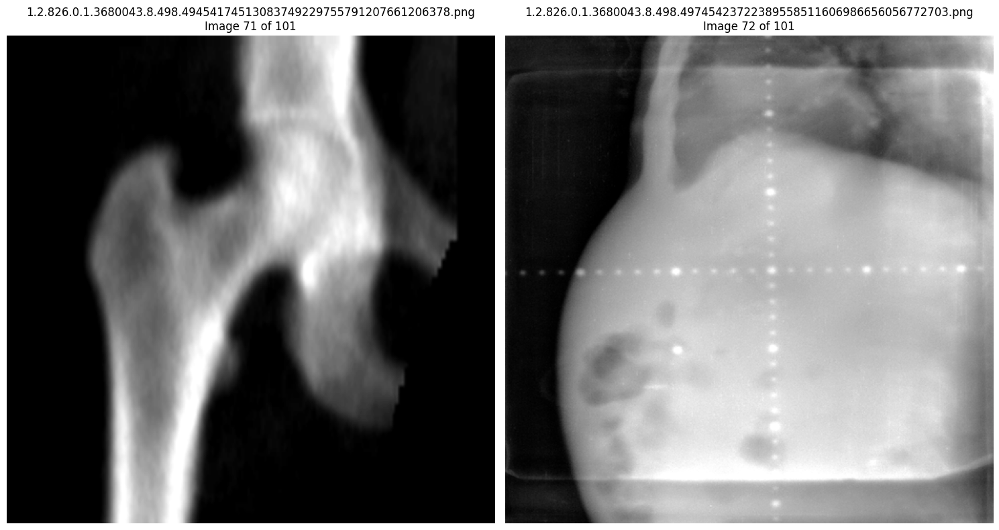

In [ ]:
folder_path = '/content/train_images/sorted_train_images/14'
plot_images_from_folder(folder_path, start_index=current_index)

In [ ]:
# import shutil
# from google.colab import files

# # Ruta de la carpeta que quieres comprimir
# folder_path = 'sorted_train_images_2'

# # Ruta del archivo zip que se creará
# zip_path = '/content/sorted_train_images_2.zip'

# # Crear el archivo zip
# shutil.make_archive(zip_path.replace('.zip', ''), 'zip', folder_path)

# # Descargar el archivo zip
# files.download(zip_path)


In [ ]:
base_dir = '/content/train_images/sorted_train_images'
img_size = 200
batch = 64

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(base_dir,
                                                       labels='inferred',
                                                       label_mode='categorical',
                                                       seed=42,
                                                       validation_split = 0.2,
                                                       subset = 'training',
                                                       batch_size = batch,
                                                       image_size = (img_size,img_size))

val_ds = tf.keras.utils.image_dataset_from_directory(base_dir,
                                                     labels='inferred',
                                                     label_mode='categorical',
                                                     seed=42,
                                                     validation_split = 0.2,
                                                     subset = 'validation',
                                                     batch_size = batch,
                                                     image_size = (img_size,img_size))


Found 1277 files belonging to 22 classes.
Using 1022 files for training.
Found 1277 files belonging to 22 classes.
Using 255 files for validation.


In [ ]:
num_classes = len(train_ds.class_names)

In [ ]:
train_classes= train_ds.class_names

In [ ]:
train_classes

['00',
 '01',
 '02',
 '03',
 '04',
 '05',
 '06',
 '07',
 '08',
 '09',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '20',
 '21']

In [ ]:
num_classes

22

In [ ]:
train_ds_iterator = train_ds.as_numpy_iterator()

In [ ]:
train_batch = train_ds_iterator.next()

In [ ]:
train_batch[0].shape

(64, 200, 200, 3)

In [ ]:
train_batch[0]

array([[[[ 58.6548   ,  58.6548   ,  58.6548   ],
         [113.74     , 113.74     , 113.74     ],
         [169.642    , 169.642    , 169.642    ],
         ...,
         [ 17.297981 ,  17.297981 ,  17.297981 ],
         [ 18.754795 ,  18.754795 ,  18.754795 ],
         [ 18.148403 ,  18.148403 ,  18.148403 ]],

        [[ 59.92     ,  59.92     ,  59.92     ],
         [112.82     , 112.82     , 112.82     ],
         [166.54     , 166.54     , 166.54     ],
         ...,
         [ 18.063984 ,  18.063984 ,  18.063984 ],
         [ 18.224398 ,  18.224398 ,  18.224398 ],
         [ 19.235601 ,  19.235601 ,  19.235601 ]],

        [[ 61.103996 ,  61.103996 ,  61.103996 ],
         [111.48399  , 111.48399  , 111.48399  ],
         [167.38998  , 167.38998  , 167.38998  ],
         ...,
         [ 16.189978 ,  16.189978 ,  16.189978 ],
         [ 17.877995 ,  17.877995 ,  17.877995 ],
         [ 17.256006 ,  17.256006 ,  17.256006 ]],

        ...,

        [[ 16.34197  ,  16.34197  ,  1

In [ ]:
type(train_ds)

tensorflow.python.data.ops.prefetch_op._PrefetchDataset

In [ ]:
val_ds_iterator = val_ds.as_numpy_iterator()

In [ ]:
val_batch = val_ds_iterator.next()

In [ ]:
val_batch[0].shape

(64, 200, 200, 3)

In [ ]:
val_batch[0]

array([[[[  7.42      ,   7.42      ,   7.42      ],
         [  5.1452    ,   5.1452    ,   5.1452    ],
         [  5.2200003 ,   5.2200003 ,   5.2200003 ],
         ...,
         [  5.4959865 ,   5.4959865 ,   5.4959865 ],
         [  5.        ,   5.        ,   5.        ],
         [  5.7799997 ,   5.7799997 ,   5.7799997 ]],

        [[  7.3452    ,   7.3452    ,   7.3452    ],
         [  5.4556    ,   5.4556    ,   5.4556    ],
         [  4.678     ,   4.678     ,   4.678     ],
         ...,
         [  5.6939917 ,   5.6939917 ,   5.6939917 ],
         [  5.2243977 ,   5.2243977 ,   5.2243977 ],
         [  5.850399  ,   5.850399  ,   5.850399  ]],

        [[  7.5980005 ,   7.5980005 ,   7.5980005 ],
         [  5.479999  ,   5.479999  ,   5.479999  ],
         [  4.3700013 ,   4.3700013 ,   4.3700013 ],
         ...,
         [  6.720019  ,   6.720019  ,   6.720019  ],
         [  6.5260034 ,   6.5260034 ,   6.5260034 ],
         [  5.3200016 ,   5.3200016 ,   5.3200016 ]],

In [ ]:
type(val_ds)

tensorflow.python.data.ops.prefetch_op._PrefetchDataset

In [ ]:
import tensorflow as tf

# Imprimir directamente los valores mínimo y máximo
print("Valor mínimo en el batch:", tf.reduce_min(train_batch[0]).numpy())
print("Valor máximo en el batch:", tf.reduce_max(train_batch[0]).numpy())


Valor mínimo en el batch: 0.0
Valor máximo en el batch: 255.0


In [ ]:
import tensorflow as tf

# Imprimir directamente los valores mínimo y máximo
print("Valor mínimo en el batch:", tf.reduce_min(val_batch[0]).numpy())
print("Valor máximo en el batch:", tf.reduce_max(val_batch[0]).numpy())

Valor mínimo en el batch: 0.0
Valor máximo en el batch: 255.0


In [ ]:
# train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))

In [ ]:
# train_ds = train_ds.map(lambda x, y: (x/255, y))
# val_ds = val_ds.map(lambda x, y: (x/255, y))

In [ ]:
# PLOTEAR BATCH SI QUEREMOS AQUI
# import matplotlib.pyplot as plt
# import numpy as np

# # Crear una figura con 4 subplots (ajustados en una fila)
# fig, ax = plt.subplots(ncols=4, figsize=(10, 10))

# # Iterar sobre los primeros 4 elementos del batch de imágenes
# for idx, img in enumerate(train_batch[0][:4]):
#     # Normaliza la imagen para visualización dividiéndola por 255
#     ax[idx].imshow(img / 255.0, cmap='gray')  # Asegúrate de que la normalización se aplique aquí
#     # Establece el título con la clase de la etiqueta, asumiendo que es un one-hot encoding
#     ax[idx].title.set_text('Clase ' + str(np.argmax(train_batch[1][idx])))
#     ax[idx].axis('off')  # Oculta los ejes

# plt.show()



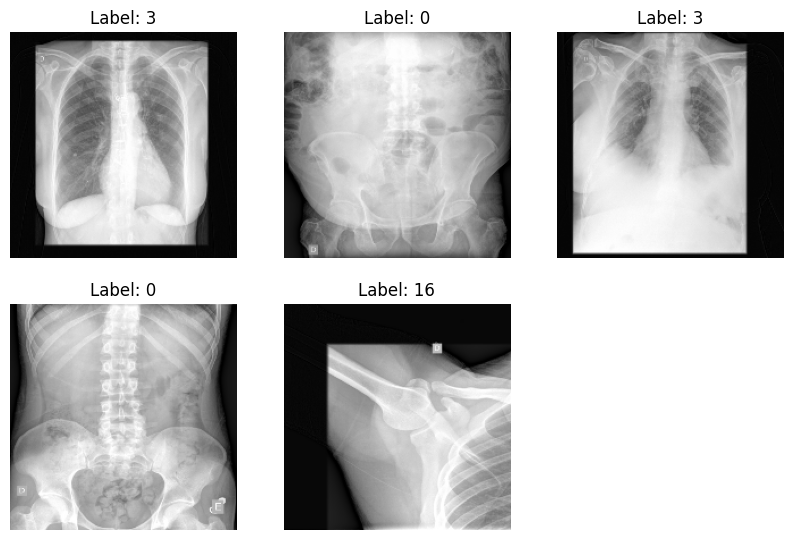

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Asegúrate de que train_ds está batcheado, si no, deberías aplicar .batch(n) donde n es el número de imágenes por batch que deseas.
for images, labels in train_ds.take(1):  # toma solo el primer batch
    # Ahora 'images' contiene un batch de imágenes 'x' normalizadas (dividido por 255)
    break  # Salimos del loop después de tomar el primer batch

n = 5  # Número de imágenes que quieres visualizar
plt.figure(figsize=(10, 10))  # Configura el tamaño de la figura
for i in range(n):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy()/255.0, cmap='gray')  # Muestra la imagen i-ésima del batch
    # Encuentra el índice de la etiqueta que es '1' en el vector one-hot
    label_index = np.argmax(labels[i])
    plt.title(f"Label: {label_index}")  # Muestra el índice como título
    plt.axis("off")
plt.show()


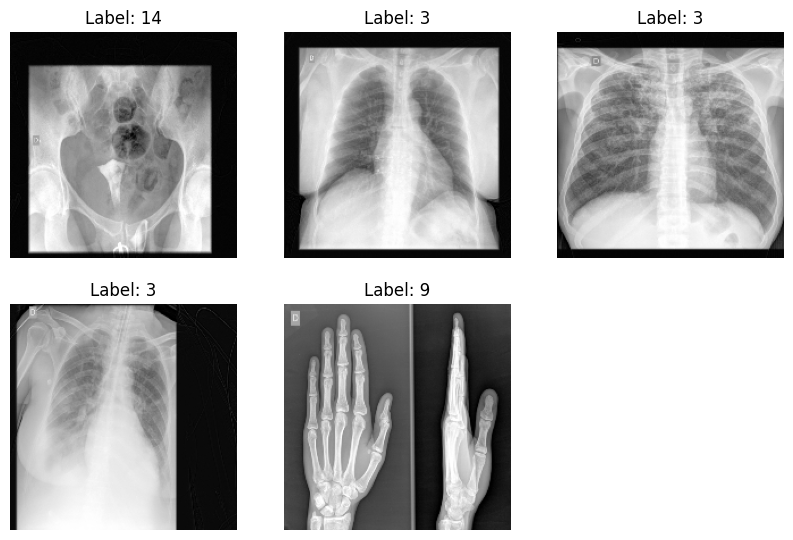

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Asegúrate de que train_ds está batcheado, si no, deberías aplicar .batch(n) donde n es el número de imágenes por batch que deseas.
for images, labels in val_ds.take(1):  # toma solo el primer batch
    # Ahora 'images' contiene un batch de imágenes 'x' normalizadas (dividido por 255)
    break  # Salimos del loop después de tomar el primer batch

n = 5  # Número de imágenes que quieres visualizar
plt.figure(figsize=(10, 10))  # Configura el tamaño de la figura
for i in range(n):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy()/255.0, cmap='gray')  # Muestra la imagen i-ésima del batch
    # Encuentra el índice de la etiqueta que es '1' en el vector one-hot
    label_index = np.argmax(labels[i])
    plt.title(f"Label: {label_index}")  # Muestra el índice como título
    plt.axis("off")
plt.show()


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
# train_ds = train_ds.prefetch(buffer_size = AUTOTUNE)

In [ ]:
# val_ds = val_ds.prefetch(buffer_size = AUTOTUNE)

In [ ]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size = AUTOTUNE)

In [ ]:
val_ds = val_ds.cache().prefetch(buffer_size = AUTOTUNE)

In [ ]:
# DATA AUGMENTATION

### Model


In [ ]:
# from tensorflow.keras import Sequential, layers

# original_size = 224
# crop_factor = 0.9
# crop_size = int(original_size * crop_factor)

# # El tamaño del recorte será 90% de 224, que es aproximadamente 201 píxeles
# print("Tamaño del recorte:", crop_size)

# data_augmentation = Sequential([
#     layers.RandomRotation(factor=0.1),  # Rango de ±10 grados
#     layers.RandomTranslation(height_factor=0.1, width_factor=0.1, fill_mode='reflect'),
#     layers.RandomZoom(height_factor=(-0.1, 0.1), width_factor=(-0.1, 0.1)), # Zoom de +/- 10%
#     layers.RandomBrightness(factor=(-0.1, 0))
# ])


In [ ]:
# rescale = tf.keras.Sequential([
#     tf.keras.layers.Rescaling(1./255)
# ])

In [ ]:
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, GlobalAveragePooling2D, ZeroPadding2D, GaussianDropout, GaussianNoise, MaxPooling2D, Conv2D
# from tensorflow.keras.applications import ConvNeXtXLarge
# import tensorflow as tf

# # Definir el modelo base de ConvNeXt con un tamaño de entrada modificado
# Convnextin = ConvNeXtXLarge(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# # Hacer que el modelo base no sea entrenable
# Convnextin.trainable = False

# # Definir el modelo secuencial
# modelconvxllarge = Sequential([
#     # Añadir rescaling y data augmentation al principio del modelo
#     data_augmentation,
#     rescale,

#     # Añadir padding a las imágenes para aumentar de 224x224 a 256x256
#     ZeroPadding2D(padding=(16, 16)),

#     # Introducir ruido gaussiano
#     GaussianNoise(0.1),

#     # Añadir el modelo ConvNeXt como una capa
#     Convnextin,

#     # Aplicar Conv2D y MaxPooling para procesar las características extraídas
#     Conv2D(128, (3, 3), activation='relu', padding='same'),
#     MaxPooling2D(pool_size=(2, 2)),

#     # Global average pooling y capas densas
#     GlobalAveragePooling2D(),
#     BatchNormalization(),
#     Dense(1024, activation='relu'),
#     Dropout(0.3),
#     GaussianDropout(0.1),
#     BatchNormalization(),
#     Dense(64, activation='relu'),
#     Dropout(0.3),
#     GaussianDropout(0.1),
#     BatchNormalization(),
#     Dense(22, activation='softmax')
# ])



In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D, ZeroPadding2D, GaussianDropout, GaussianNoise, MaxPooling2D, Conv2D, concatenate
from tensorflow.keras.applications import ConvNeXtXLarge
import tensorflow as tf

# Definir el modelo base de ConvNeXt con un tamaño de entrada modificado
base_model = ConvNeXtXLarge(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Congelar el modelo

# Capas de preprocesamiento
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomRotation(factor=0.1),  # Rango de ±10 grados
    tf.keras.layers.RandomTranslation(height_factor=0.1, width_factor=0.1, fill_mode='reflect'),
    tf.keras.layers.RandomZoom(height_factor=(-0.1, 0.1), width_factor=(-0.1, 0.1)),  # Zoom de +/- 10%
    tf.keras.layers.RandomBrightness(factor=(-0.1, 0))  # Ajuste de brillo
])
rescale = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255)
])

# Crear una entrada común
input = Input(shape=(200, 200, 3))
x = data_augmentation(input)
x = ZeroPadding2D(padding=(12, 12))(x)
x = GaussianNoise(0.1)(x)

# Obtener las características del modelo
features = base_model(x)

# Aplicar Conv2D y MaxPooling
x = Conv2D(512, (3, 3), activation='relu', padding='same')(features)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(features)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Global average pooling y capas densas
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.3)(x)
x = GaussianDropout(0.1)(x)
x = BatchNormalization()(x)
x = Dense(64, activation='relu')(x)
x = Dropout(0.3)(x)
x = GaussianDropout(0.1)(x)
x = BatchNormalization()(x)
output = Dense(22, activation='softmax')(x)

# Crear el modelo completo
model = Model(inputs=input, outputs=output)


1393257616/1393257616 [==============================] - 10s 0us/step


In [ ]:
from tensorflow.keras.optimizers import Adam

optimizer = Adam()
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Configurar EarlyStopping
early_stopper = EarlyStopping(
    monitor='val_accuracy',  # Monitorea la pérdida de validación
    patience=5,          # Número de épocas sin mejora tras las cuales se detiene el entrenamiento
    restore_best_weights=True,  # Restaura los pesos del modelo con el mejor valor de la métrica monitoreada
    verbose = 1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',  # Monitorea la pérdida de validación
    factor=0.1,          # Factor por el cual se multiplicará la tasa de aprendizaje (tasa de aprendizaje nueva = tasa de aprendizaje actual * factor)
    patience=2,          # Número de épocas sin mejora después de las cuales se reduce la tasa de aprendizaje
    min_lr=1e-6,         # Límite inferior de la tasa de aprendizaje
    verbose=1
)

In [ ]:
# Resumen del modelo
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 200, 200, 3)       0         
                                                                 
 zero_padding2d (ZeroPaddin  (None, 224, 224, 3)       0         
 g2D)                                                            
                                                                 
 gaussian_noise (GaussianNo  (None, 224, 224, 3)       0         
 ise)                                                            
                                                                 
 convnext_xlarge (Functiona  (None, 7, 7, 2048)        348147968 
 l)                                                              
                                                             

In [ ]:
# Entrenar el modelo
epochs=20
history = model.fit(train_ds,validation_data=val_ds,epochs=epochs,callbacks=[early_stopper,reduce_lr])


Epoch 1/20
16/16 [==============================] - 80s 3s/step - loss: 2.2975 - accuracy: 0.3699 - val_loss: 2.3717 - val_accuracy: 0.4902 - lr: 0.0010
Epoch 2/20
16/16 [==============================] - 34s 2s/step - loss: 1.4626 - accuracy: 0.6184 - val_loss: 1.6255 - val_accuracy: 0.6196 - lr: 0.0010
Epoch 3/20
16/16 [==============================] - 34s 2s/step - loss: 1.1502 - accuracy: 0.7211 - val_loss: 1.3004 - val_accuracy: 0.7137 - lr: 0.0010
Epoch 4/20
16/16 [==============================] - 34s 2s/step - loss: 0.9103 - accuracy: 0.7926 - val_loss: 1.0553 - val_accuracy: 0.7686 - lr: 0.0010
Epoch 5/20
16/16 [==============================] - 35s 2s/step - loss: 0.7664 - accuracy: 0.8297 - val_loss: 0.8406 - val_accuracy: 0.8157 - lr: 0.0010
Epoch 6/20
16/16 [==============================] - 35s 2s/step - loss: 0.6794 - accuracy: 0.8464 - val_loss: 0.7477 - val_accuracy: 0.8510 - lr: 0.0010
Epoch 7/20
16/16 [==============================] - 34s 2s/step - loss: 0.6154 - a

In [ ]:
for layer in base_model.layers[-6:]:
    layer.trainable = True

optimizer = Adam(learning_rate=1e-4)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
epochs=10
history = model.fit(train_ds,validation_data=val_ds,epochs=epochs,callbacks=[early_stopper])

Epoch 1/10
16/16 [==============================] - 55s 3s/step - loss: 0.3499 - accuracy: 0.9237 - val_loss: 0.5811 - val_accuracy: 0.8667
Epoch 2/10
16/16 [==============================] - 34s 2s/step - loss: 0.3202 - accuracy: 0.9335 - val_loss: 0.5657 - val_accuracy: 0.8667
Epoch 3/10
16/16 [==============================] - 34s 2s/step - loss: 0.3143 - accuracy: 0.9393 - val_loss: 0.5718 - val_accuracy: 0.8667
Epoch 4/10
16/16 [==============================] - 34s 2s/step - loss: 0.3193 - accuracy: 0.9325 - val_loss: 0.5638 - val_accuracy: 0.8627
Epoch 5/10
16/16 [==============================] - 35s 2s/step - loss: 0.2907 - accuracy: 0.9521 - val_loss: 0.5553 - val_accuracy: 0.8745
Epoch 6/10
16/16 [==============================] - 35s 2s/step - loss: 0.2643 - accuracy: 0.9609 - val_loss: 0.5298 - val_accuracy: 0.8863
Epoch 7/10
16/16 [==============================] - 34s 2s/step - loss: 0.2575 - accuracy: 0.9658 - val_loss: 0.5442 - val_accuracy: 0.8706
Epoch 8/10
16/16 [==

In [ ]:
modelconvxllargel.save('modelconvxllarge_try11.h5')  # Guarda el modelo como un archivo HDF5


NameError: name 'modelconvxllargel' is not defined

### VISUALIZAR DONDE SE EQUIVOCA

In [ ]:
# # Realiza predicciones sobre el conjunto de validación
# val_predictions = model.predict(val_ds)
# predicted_classes = np.argmax(val_predictions, axis=1)

# # Obtén las etiquetas reales del conjunto de validación
# true_labels = np.concatenate([y for x, y in val_ds], axis=0)
# true_classes = np.argmax(true_labels, axis=1)

In [ ]:
# # Encuentra los índices de las predicciones incorrectas
# incorrect_indices = np.where(predicted_classes != true_classes)[0]


In [ ]:
current_page = 0
images_per_page = 2

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output

# Asumiendo que val_ds contiene tuplas de (imagenes, etiquetas)
# Preparar datos para visualización y evaluación
images = []
true_classes = []

# Iterar sobre el dataset para recopilar imágenes y etiquetas
for image_batch, label_batch in val_ds:
    images.extend(image_batch.numpy())  # Convierte tensor a numpy y agrega a la lista
    true_classes.extend(np.argmax(label_batch.numpy(), axis=1))  # Convierte etiquetas one-hot a índices de clase

# Realizar predicciones sobre el conjunto de validación
val_predictions = modelconvxllarge.predict(val_ds)
predicted_classes = np.argmax(val_predictions, axis=1)

# Encuentra los índices de las predicciones incorrectas
incorrect_indices = np.where(predicted_classes != np.array(true_classes))[0]

# Variables para controlar la paginación
total_images = len(incorrect_indices)
images_per_page = 2

# Función para mostrar una serie de imágenes
def plot_images(page_number=0):
    start_index = page_number * images_per_page
    end_index = min(start_index + images_per_page, total_images)
    fig, axes = plt.subplots(1, images_per_page, figsize=(10, 5))

    for i in range(images_per_page):
        idx = start_index + i
        if idx < total_images:
            ax = axes[i]
            incorrect_img_idx = incorrect_indices[idx]
            img = images[incorrect_img_idx]  # Asume que las imágenes están en formato adecuado
            ax.imshow(img[..., 0], cmap='gray')  # Muestra el canal adecuado según tus imágenes
            ax.title.set_text(f'Predicted: {predicted_classes[incorrect_img_idx]}, True: {true_classes[incorrect_img_idx]}')
            ax.axis('off')
        else:
            axes[i].axis('off')

    plt.suptitle(f'Incorrect Images {start_index + 1} to {end_index} of {total_images}')
    plt.show()

# Slider para controlar la página
page_slider = widgets.IntSlider(min=0, max=(total_images // images_per_page) - (0 if total_images % images_per_page == 0 else 1), step=1, value=0)

# Mostrar el slider y las imágenes iniciales
widgets.interact(plot_images, page_number=page_slider)


### PREDICIONES

In [ ]:
X_test.shape

In [ ]:
# Asumiendo que X_test es un array de imágenes en escala de grises de shape (328, 512, 512)
# Primero, expande la dimensión de canales
X_test = tf.expand_dims(X_test, axis=-1)  # Esto cambiará la forma a (328, 512, 512, 1)




In [ ]:
X_test.shape

In [ ]:
def preprocess_images(images, target_size=(224, 224)):
    # Redimensiona las imágenes
    images = tf.image.resize(images, target_size)  # Ahora, esto redimensionará correctamente
    return images

# Redimensionar las imágenes
X_test_resized = preprocess_images(X_test)

# Verifica la forma del tensor antes de predecir
print("Forma del tensor de imágenes redimensionadas:", X_test_resized.shape)
# Debería ser (328, 256, 256, 1) para imágenes en escala de grises

# Si las imágenes deben ser a color y tienen 3 canales, asegúrate de que X_test inicialmente tenga esa cuarta dimensión.

In [ ]:
X_test.shape

In [ ]:
X_test_resized.shape

In [ ]:
import tensorflow as tf

# Función para convertir imágenes de escala de grises a RGB
def convert_to_rgb(images):
    # Repite el canal de grises tres veces para simular una imagen RGB
    images_rgb = tf.image.grayscale_to_rgb(images)
    return images_rgb

# Asumiendo que X_test_resized ya está en la forma (328, 224, 224, 1)
X_test_rgb = convert_to_rgb(X_test_resized)

# Ahora X_test_rgb debería tener la forma (328, 224, 224, 3)
print("Forma del tensor de imágenes RGB:", X_test_rgb.shape)

In [ ]:
predicted_probabilities = modelconvxllarge.predict(X_test_rgb)

In [ ]:
predicted_class_names = np.argmax(predicted_probabilities, axis=1)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from ipywidgets import interact, IntSlider

# Suponiendo que X_test_rgb son tus imágenes y que predicted_class_names contiene las clases predichas
Y_test['Predicted'] = predicted_class_names

def plot_image(index):
    plt.figure(figsize=(5, 5))
    plt.imshow(X_test_rgb[index] / 255.0)  # Asegúrate de que las imágenes estén normalizadas si es necesario
    plt.title(f'Predicted: {Y_test.loc[index, "Predicted"]}')
    plt.axis('off')
    plt.show()

# Crear un slider para navegar entre las imágenes
interact(plot_image, index=IntSlider(min=0, max=len(X_test_rgb)-1, step=1, value=0))


In [ ]:
current_index = 326

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Suponiendo que X_test_rgb son tus imágenes y que predicted_class_names contiene las clases predichas
Y_test['Predicted'] = predicted_class_names

# Inicializar una variable global para seguir el índice de la imagen actual
if 'current_index' not in globals():
    current_index = 0  # Comienza desde el primer índice al iniciar

def plot_next_images():
    global current_index
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Ajusta el tamaño si es necesario

    # Mostrar las próximas tres imágenes
    for i in range(3):
        index = current_index + i
        if index < len(X_test_rgb):  # Verificar que el índice no exceda el número de imágenes disponibles
            axes[i].imshow(X_test_rgb[index] / 255.0)  # Normalizar si es necesario
            axes[i].set_title(f'Predicted: {Y_test.loc[index, "Predicted"]}')
            axes[i].axis('off')
        else:
            axes[i].axis('off')  # Ocultar los ejes si el índice excede el número de imágenes

    # Mostrar el rango de imágenes actual y el total
    plt.suptitle(f'Images {current_index+1} to {min(current_index+3, len(X_test_rgb))} of {len(X_test_rgb)}')

    # Actualizar el índice actual para la próxima ejecución
    current_index += 3
    if current_index >= len(X_test_rgb):  # Resetear el índice si alcanzamos el final del conjunto de datos
        current_index = 0

    plt.show()

# Ejecutar la función para mostrar las imágenes
plot_next_images()


In [ ]:
Y_test.drop('Predicted', axis=1, inplace=True)

In [ ]:
# Resetear el índice de Y_test y eliminar el índice anterior
Y_test.reset_index(drop=True, inplace=True)

In [ ]:
Y_test['Target'] = predicted_class_names

In [ ]:
print(Y_test.columns)

In [ ]:
Y_test.to_csv('/content/predicted_combo.csv', index=False)


## Try 5

In [ ]:
import os
import random
import glob
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image, ImageEnhance, ImageFilter
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Input, Activation, Add, ReLU, Convolution2D, BatchNormalization, Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D,Dense, Flatten, Concatenate
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from zipfile import ZipFile
from tqdm.notebook import tqdm as tqdm_notebook


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls "/content/drive/My Drive/"


 01_1_EDA.ipynb				   EDEM_1_Tokenizado.ipynb
 01_2_EDA.ipynb				   metaflow-basics.ipynb
 01_Regression.ipynb			   metaflow-model-training.ipynb
 02_LinearRegressionImplementation.ipynb   trainset+mura_images
 02_Normalizacion.ipynb			   Workshop_1_Visión_Artificial.ipynb
 03_Classificacion.ipynb		   Workshop_2_CIFAR10.ipynb
 04_Perceptron.ipynb			  'Workshop_3_Mnist (Solved).ipynb'
 bankmarketing.csv			   Workshop_5_Segmentation_fastai.ipynb
'Colab Notebooks'			   Workshop_8_Challenge.ipynb
 Colab_Notebooks


In [ ]:
Y_train = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/train.csv", delimiter=',')
Y_test = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/sample_submission.csv", delimiter=',')

In [ ]:
# # Directorio donde se extraerán los archivos
# !unzip "/content/drive/My Drive/Colab_Notebooks/DP4/sorted_transformed_train_images.zip" -d "/content/train_images"


In [ ]:
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/transformed_test.zip" -d "/content/test_images_2/"

Archive:  /content/drive/My Drive/Colab_Notebooks/DP4/transformed_test.zip
 extracting: /content/test_images_2/1.2.826.0.1.3680043.8.498.83737120855042966743987844472601961600.png  
 extracting: /content/test_images_2/1.2.826.0.1.3680043.8.498.93605970352470670545619495981361983096.png  
 extracting: /content/test_images_2/1.2.826.0.1.3680043.8.498.92127115820268888239113572137981968546.png  
 extracting: /content/test_images_2/1.2.826.0.1.3680043.8.498.80216376436506174361301868288606662600.png  
 extracting: /content/test_images_2/1.2.826.0.1.3680043.8.498.86105545979075422856703295064345446162.png  
 extracting: /content/test_images_2/1.2.826.0.1.3680043.8.498.94191630626826666666908037532848358568.png  
 extracting: /content/test_images_2/1.2.826.0.1.3680043.8.498.90240400296093633201761059427668477066.png  
 extracting: /content/test_images_2/1.2.826.0.1.3680043.8.498.80271499847868710372361432257687519642.png  
 extracting: /content/test_images_2/1.2.826.0.1.3680043.8.498.8158071

In [ ]:
# import os
# from PIL import Image
# import numpy as np

# def load_and_save_images(folder_path, dataframe, output_base_path):
#     images = []
#     labels = []
#     # Asegurar que exista el directorio base de salida
#     if not os.path.exists(output_base_path):
#         os.mkdir(output_base_path)

#     for _, row in dataframe.iterrows():
#         file_path = os.path.join(folder_path, row['SOPInstanceUID'] + '.png')  # Asumiendo que las extensiones son .png
#         # Formatear el nombre del target folder para incluir ceros delante si es necesario
#         target_folder_name = str(row['Target']).zfill(2)
#         target_folder = os.path.join(output_base_path, target_folder_name)

#         # Crear el directorio del Target si no existe
#         if not os.path.exists(target_folder):
#             os.mkdir(target_folder)

#         # Cargar la imagen
#         with Image.open(file_path) as img:
#             img_array = np.array(img)
#             images.append(img_array)
#             labels.append(row['Target'])

#         # Guardar la imagen en la carpeta correspondiente
#         output_path = os.path.join(target_folder, row['SOPInstanceUID'] + '.png')
#         img.save(output_path)

#     return np.array(images), np.array(labels)


In [ ]:
import os
from PIL import Image
import numpy as np

def load_images_and_labels(folder_path, dataframe):
    images = []
    labels = []

    for _, row in dataframe.iterrows():
        # Construir la ruta completa de la imagen
        file_path = os.path.join(folder_path, row['SOPInstanceUID'] + '.png')  # Asumiendo que las extensiones son .png

        # Cargar la imagen
        if os.path.exists(file_path):
            with Image.open(file_path) as img:
                img_array = np.array(img)
                images.append(img_array)
                labels.append(row['Target'])
        else:
            print(f"File not found: {file_path}")

    return np.array(images), np.array(labels)


In [ ]:
# Rutas a los directorios
test_images_path = '/content/test_images_2'
output_test_images_path = '/content/sorted_test_images_2'

X_test, Y_test_labels = load_images_and_labels(test_images_path, Y_test)


In [ ]:
# listtrain = os.listdir("/content/train_images/sorted_train_images")
# number_files_train = len(listtrain)
# print(number_files_train)

# listtest = os.listdir("/content/test_images")
# number_files_test = len(listtest)
# print(number_files_test)

In [ ]:
X_test.shape

(328, 224, 224, 4)

### EDA

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np  # Importa NumPy

# Inicializa una variable global para almacenar el índice actual
current_index = 70

def plot_images_from_folder(folder_path, start_index, num_images=2):
    global current_index  # Declara que vas a usar la variable global
    # List all files in the folder
    files = sorted([file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))])
    total_images = len(files)

    # Calculate end index
    end_index = start_index + num_images
    current_index = end_index  # Update current index for the next call

    # Select a subset of files
    files_to_display = files[start_index:end_index]

    # Create a figure with subplots
    fig, axes = plt.subplots(1, len(files_to_display), figsize=(15, 10))
    if len(files_to_display) == 1:
        axes = [axes]  # Make sure axes is iterable
    for ax, file in zip(axes, files_to_display):
        # Load the image
        img_path = os.path.join(folder_path, file)
        image = Image.open(img_path)
        image_np = np.array(image) / 255.0  # Convierte la imagen a un array NumPy y normalízala
        ax.imshow(image_np , cmap='gray')
        ax.axis('off')
        ax.set_title(f"{file}\nImage {files.index(file)+1} of {total_images}")

    plt.tight_layout()
    plt.show()


In [ ]:
# folder_path = '/content/train_images/sorted_train_images/14'
# plot_images_from_folder(folder_path, start_index=current_index)

In [ ]:
# DATA AUGMENTATION

### Model


In [ ]:
# import tensorflow as tf
# from tensorflow.keras.applications.densenet import preprocess_input as preprocess_input_densenet201
# from tensorflow.keras.applications.inception_v3 import preprocess_input as preprocess_input_inceptionv3
# from tensorflow.keras.applications import DenseNet201, InceptionV3
# from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Concatenate
# from tensorflow.keras.models import Model
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
# from tensorflow.keras import layers, Sequential

# base_dir = '/content/train_images/sorted_train_images'
# img_size = 224
# batch_size = 64

# # Configuración de AUTOTUNE
# AUTOTUNE = tf.data.AUTOTUNE

# train_ds = tf.keras.utils.image_dataset_from_directory(base_dir,
#                                                        labels='inferred',
#                                                        label_mode='categorical',
#                                                        seed=42,
#                                                        validation_split=0.2,
#                                                        subset='training',
#                                                        batch_size=batch_size,
#                                                        image_size=(img_size, img_size))

# val_ds = tf.keras.utils.image_dataset_from_directory(base_dir,
#                                                      labels='inferred',
#                                                      label_mode='categorical',
#                                                      seed=42,
#                                                      validation_split=0.2,
#                                                      subset='validation',
#                                                      batch_size=batch_size,
#                                                      image_size=(img_size, img_size))

# # Aplicar optimizaciones al pipeline de datos
# train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
# val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# # Generador personalizado
# def custom_generator(dataset):
#     while True:
#         for x, y in dataset:
#             yield x, y

# train_generator = custom_generator(train_ds)
# val_generator = custom_generator(val_ds)



# # Cargar modelos preentrenados
# base_model_1 = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
# base_model_2 = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Congelar las capas base
# for layer in base_model_1.layers:
#     layer.trainable = False

# for layer in base_model_2.layers:
#     layer.trainable = False

# # Crear la entrada
# inputs = layers.Input(shape=(img_size, img_size, 3))

# # Aplicar reescalado
# x = inputs

# # Redimensionar para los modelos preentrenados
# x_densenet = layers.Lambda(lambda img: tf.image.resize(img, (224, 224)))(x)
# x_inception = layers.Lambda(lambda img: tf.image.resize(img, (224, 224)))(x)

# # Aplicar los modelos preentrenados
# x1 = base_model_1(x_densenet)
# x1 = GlobalAveragePooling2D()(x1)

# x2 = base_model_2(x_inception)
# x2 = GlobalAveragePooling2D()(x2)

# # Combinar las salidas
# merged = Concatenate()([x1, x2])

# # Salida final
# output = Dense(22, activation='softmax')(merged)  # 22 clases

# # Crear el modelo
# model = Model(inputs=inputs, outputs=output)

# # Compilar el modelo
# optimizer = Adam()
# model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# # Configurar EarlyStopping
# early_stopper = EarlyStopping(
#     monitor='val_accuracy',  # Monitorea la precisión de validación
#     patience=5,              # Número de épocas sin mejora tras las cuales se detiene el entrenamiento
#     restore_best_weights=True,  # Restaura los pesos del modelo con el mejor valor de la métrica monitoreada
#     verbose=1
# )

# reduce_lr = ReduceLROnPlateau(
#     monitor='val_loss',  # Monitorea la pérdida de validación
#     factor=0.1,          # Factor por el cual se multiplicará la tasa de aprendizaje (tasa de aprendizaje nueva = tasa de aprendizaje actual * factor)
#     patience=2,          # Número de épocas sin mejora después de las cuales se reduce la tasa de aprendizaje
#     min_lr=1e-6,         # Límite inferior de la tasa de aprendizaje
#     verbose=1
# )

# # Hardcodear steps_per_epoch y validation_steps
# total_train_images = 1022  # Reemplaza con el número real de imágenes de entrenamiento
# total_val_images = 255     # Reemplaza con el número real de imágenes de validación

# steps_per_epoch = total_train_images // batch_size
# validation_steps = total_val_images // batch_size

# # Entrenar el modelo
# epochs = 20
# history = model.fit(train_generator,
#                     validation_data=val_generator,
#                     epochs=epochs,
#                     steps_per_epoch=steps_per_epoch,
#                     validation_steps=validation_steps,
#                     callbacks=[early_stopper, reduce_lr])


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.densenet import preprocess_input as preprocess_input_densenet201
from tensorflow.keras.applications.inception_v3 import preprocess_input as preprocess_input_inceptionv3
from tensorflow.keras.applications import DenseNet201, InceptionV3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras import layers

base_dir = '/content/drive/My Drive/trainset+mura_images'
img_size = 224
batch_size = 64

# Configuración de AUTOTUNE
AUTOTUNE = tf.data.AUTOTUNE

train_ds = tf.keras.utils.image_dataset_from_directory(base_dir,
                                                       labels='inferred',
                                                       label_mode='categorical',
                                                       seed=42,
                                                       validation_split=0.2,
                                                       subset='training',
                                                       batch_size=batch_size,
                                                       image_size=(img_size, img_size))

val_ds = tf.keras.utils.image_dataset_from_directory(base_dir,
                                                     labels='inferred',
                                                     label_mode='categorical',
                                                     seed=42,
                                                     validation_split=0.2,
                                                     subset='validation',
                                                     batch_size=batch_size,
                                                     image_size=(img_size, img_size))

# Aplicar optimizaciones al pipeline de datos
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Generador personalizado
def custom_generator(dataset, preprocess_fn):
    while True:
        for x, y in dataset:
            yield preprocess_fn(x), y

train_generator_densenet = custom_generator(train_ds, preprocess_input_densenet201)
val_generator_densenet = custom_generator(val_ds, preprocess_input_densenet201)

train_generator_inception = custom_generator(train_ds, preprocess_input_inceptionv3)
val_generator_inception = custom_generator(val_ds, preprocess_input_inceptionv3)

# Cargar modelos preentrenados
base_model_1 = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model_2 = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Congelar las capas base
for layer in base_model_1.layers:
    layer.trainable = False

for layer in base_model_2.layers:
    layer.trainable = False

# Crear la entrada
inputs = layers.Input(shape=(img_size, img_size, 3))

# Aplicar reescalado
x = inputs

# Aplicar preprocesamiento específico a cada modelo
x_densenet = preprocess_input_densenet201(x)
x_inception = preprocess_input_inceptionv3(x)

# Aplicar los modelos preentrenados
x1 = base_model_1(x_densenet)
x1 = GlobalAveragePooling2D()(x1)

x2 = base_model_2(x_inception)
x2 = GlobalAveragePooling2D()(x2)

# Combinar las salidas
merged = Concatenate()([x1, x2])

# Salida final
output = Dense(22, activation='softmax')(merged)  # 22 clases

# Crear el modelo
model = Model(inputs=inputs, outputs=output)

# Compilar el modelo
optimizer = Adam()
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Configurar EarlyStopping
early_stopper = EarlyStopping(
    monitor='val_accuracy',  # Monitorea la precisión de validación
    patience=5,              # Número de épocas sin mejora tras las cuales se detiene el entrenamiento
    restore_best_weights=True,  # Restaura los pesos del modelo con el mejor valor de la métrica monitoreada
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',  # Monitorea la pérdida de validación
    factor=0.1,          # Factor por el cual se multiplicará la tasa de aprendizaje (tasa de aprendizaje nueva = tasa de aprendizaje actual * factor)
    patience=2,          # Número de épocas sin mejora después de las cuales se reduce la tasa de aprendizaje
    min_lr=1e-6,         # Límite inferior de la tasa de aprendizaje
    verbose=1
)

# Hardcodear steps_per_epoch y validation_steps
total_train_images = 1023  # Reemplaza con el número real de imágenes de entrenamiento
total_val_images = 255     # Reemplaza con el número real de imágenes de validación

steps_per_epoch = total_train_images // batch_size
validation_steps = total_val_images // batch_size

# Entrenar el modelo
epochs = 20
history = model.fit(
    train_generator_densenet,
    validation_data=val_generator_densenet,
    epochs=epochs,
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps,
    callbacks=[early_stopper, reduce_lr]
)


Found 9725 files belonging to 22 classes.
Using 7780 files for training.
Found 9725 files belonging to 22 classes.
Using 1945 files for validation.
87910968/87910968 [==============================] - 5s 0us/step
Epoch 1/20
15/15 [==============================] - 80s 4s/step - loss: 2.7886 - accuracy: 0.1688 - val_loss: 2.3451 - val_accuracy: 0.3073 - lr: 0.0010
Epoch 2/20
15/15 [==============================] - 18s 1s/step - loss: 2.1487 - accuracy: 0.4385 - val_loss: 2.1026 - val_accuracy: 0.3698 - lr: 0.0010
Epoch 3/20
15/15 [==============================] - 15s 1s/step - loss: 1.8938 - accuracy: 0.4615 - val_loss: 1.8148 - val_accuracy: 0.4531 - lr: 0.0010
Epoch 4/20
15/15 [==============================] - 21s 1s/step - loss: 1.6857 - accuracy: 0.5240 - val_loss: 1.6713 - val_accuracy: 0.4948 - lr: 0.0010
Epoch 5/20
15/15 [==============================] - 20s 1s/step - loss: 1.5720 - accuracy: 0.5771 - val_loss: 1.7207 - val_accuracy: 0.4583 - lr: 0.0010
Epoch 6/20
15/15 [====

In [ ]:
# Resumen del modelo
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 tf.math.truediv (TFOpLambd  (None, 224, 224, 3)          0         ['input_3[0][0]']             
 a)                                                                                               
                                                                                                  
 tf.nn.bias_add (TFOpLambda  (None, 224, 224, 3)          0         ['tf.math.truediv[0][0]']     
 )                                                                                                
                                                                                              

In [ ]:
for layer in model.layers[-6:]:
    layer.trainable = True

optimizer = Adam(learning_rate=1e-4)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
epochs=10
history = model.fit(train_ds,validation_data=val_ds,epochs=epochs,callbacks=[early_stopper])

Epoch 1/10
122/122 [==============================] - 314s 1s/step - loss: 0.4391 - accuracy: 0.8964 - val_loss: 0.1816 - val_accuracy: 0.9512
Epoch 2/10
122/122 [==============================] - 106s 866ms/step - loss: 0.0148 - accuracy: 0.9972 - val_loss: 0.1249 - val_accuracy: 0.9681
Epoch 3/10
122/122 [==============================] - 106s 866ms/step - loss: 0.0047 - accuracy: 0.9997 - val_loss: 0.1062 - val_accuracy: 0.9717
Epoch 4/10
122/122 [==============================] - 105s 865ms/step - loss: 0.0013 - accuracy: 0.9999 - val_loss: 0.0968 - val_accuracy: 0.9743
Epoch 5/10
122/122 [==============================] - 106s 865ms/step - loss: 0.0012 - accuracy: 0.9999 - val_loss: 0.0938 - val_accuracy: 0.9774
Epoch 6/10
122/122 [==============================] - 105s 864ms/step - loss: 4.8114e-04 - accuracy: 1.0000 - val_loss: 0.0937 - val_accuracy: 0.9784
Epoch 7/10
122/122 [==============================] - 105s 862ms/step - loss: 3.6528e-04 - accuracy: 1.0000 - val_loss: 0.0

In [ ]:
# modelconvxllargel.save('modelconvxllarge_try11.h5')  # Guarda el modelo como un archivo HDF5


### VISUALIZAR DONDE SE EQUIVOCA

In [ ]:
# # Realiza predicciones sobre el conjunto de validación
# val_predictions = model.predict(val_ds)
# predicted_classes = np.argmax(val_predictions, axis=1)

# # Obtén las etiquetas reales del conjunto de validación
# true_labels = np.concatenate([y for x, y in val_ds], axis=0)
# true_classes = np.argmax(true_labels, axis=1)

In [ ]:
# # Encuentra los índices de las predicciones incorrectas
# incorrect_indices = np.where(predicted_classes != true_classes)[0]


In [ ]:
current_page = 0
images_per_page = 2

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output

# Asumiendo que val_ds contiene tuplas de (imagenes, etiquetas)
# Preparar datos para visualización y evaluación
images = []
true_classes = []

# Iterar sobre el dataset para recopilar imágenes y etiquetas
for image_batch, label_batch in val_ds:
    images.extend(image_batch.numpy())  # Convierte tensor a numpy y agrega a la lista
    true_classes.extend(np.argmax(label_batch.numpy(), axis=1))  # Convierte etiquetas one-hot a índices de clase

# Realizar predicciones sobre el conjunto de validación
val_predictions = modelconvxllarge.predict(val_ds)
predicted_classes = np.argmax(val_predictions, axis=1)

# Encuentra los índices de las predicciones incorrectas
incorrect_indices = np.where(predicted_classes != np.array(true_classes))[0]

# Variables para controlar la paginación
total_images = len(incorrect_indices)
images_per_page = 2

# Función para mostrar una serie de imágenes
def plot_images(page_number=0):
    start_index = page_number * images_per_page
    end_index = min(start_index + images_per_page, total_images)
    fig, axes = plt.subplots(1, images_per_page, figsize=(10, 5))

    for i in range(images_per_page):
        idx = start_index + i
        if idx < total_images:
            ax = axes[i]
            incorrect_img_idx = incorrect_indices[idx]
            img = images[incorrect_img_idx]  # Asume que las imágenes están en formato adecuado
            ax.imshow(img[..., 0], cmap='gray')  # Muestra el canal adecuado según tus imágenes
            ax.title.set_text(f'Predicted: {predicted_classes[incorrect_img_idx]}, True: {true_classes[incorrect_img_idx]}')
            ax.axis('off')
        else:
            axes[i].axis('off')

    plt.suptitle(f'Incorrect Images {start_index + 1} to {end_index} of {total_images}')
    plt.show()

# Slider para controlar la página
page_slider = widgets.IntSlider(min=0, max=(total_images // images_per_page) - (0 if total_images % images_per_page == 0 else 1), step=1, value=0)

# Mostrar el slider y las imágenes iniciales
widgets.interact(plot_images, page_number=page_slider)


NameError: name 'modelconvxllarge' is not defined

### PREDICIONES

In [ ]:
X_test.shape

(328, 224, 224, 4)

In [ ]:
# Asumiendo que X_test es un array de imágenes en escala de grises de shape (328, 512, 512)
# Primero, expande la dimensión de canales
X_test = tf.expand_dims(X_test, axis=-1)  # Esto cambiará la forma a (328, 512, 512, 1)




In [ ]:
X_test.shape

TensorShape([328, 224, 224, 4, 1])

In [ ]:
def preprocess_images(images, target_size=(224, 224)):
    # Redimensiona las imágenes
    images = tf.image.resize(images, target_size)  # Ahora, esto redimensionará correctamente
    return images

# Redimensionar las imágenes
X_test_resized = preprocess_images(X_test)

# Verifica la forma del tensor antes de predecir
print("Forma del tensor de imágenes redimensionadas:", X_test_resized.shape)
# Debería ser (328, 256, 256, 1) para imágenes en escala de grises

# Si las imágenes deben ser a color y tienen 3 canales, asegúrate de que X_test inicialmente tenga esa cuarta dimensión.

Forma del tensor de imágenes redimensionadas: (328, 224, 224, 4)


In [ ]:
X_test.shape

(328, 224, 224, 4)

In [ ]:
X_test_resized.shape

TensorShape([328, 224, 224, 4])

In [ ]:
import tensorflow as tf

# Función para convertir imágenes de escala de grises a RGB
def convert_to_rgb(images):
    # Repite el canal de grises tres veces para simular una imagen RGB
    images_rgb = tf.image.grayscale_to_rgb(images)
    return images_rgb

# Asumiendo que X_test_resized ya está en la forma (328, 224, 224, 1)
X_test_rgb = convert_to_rgb(X_test_resized)

# Ahora X_test_rgb debería tener la forma (328, 224, 224, 3)
print("Forma del tensor de imágenes RGB:", X_test_rgb.shape)

ValueError: Last dimension of a grayscale image should be size 1.

In [ ]:
import tensorflow as tf

# Asumiendo que X_test tiene forma (328, 224, 224, 4) y contiene imágenes RGBA

# Eliminar el canal alfa si existe
def remove_alpha_channel(images):
    if images.shape[-1] == 4:
        images = images[..., :3]  # Mantener solo los tres primeros canales (RGB)
    return images

# Redimensionar las imágenes
def preprocess_images(images, target_size=(224, 224)):
    images = tf.image.resize(images, target_size)  # Redimensionar a target_size
    return images

# Convertir a RGB si es necesario
def convert_to_rgb(images):
    # Convertir imágenes en escala de grises a RGB, si es necesario
    if images.shape[-1] == 1:
        images = tf.image.grayscale_to_rgb(images)
    return images

# Procesar las imágenes
X_test = remove_alpha_channel(X_test)  # Eliminar canal alfa
X_test_resized = preprocess_images(X_test)  # Redimensionar las imágenes
X_test_rgb = convert_to_rgb(X_test_resized)  # Convertir a RGB si es necesario

# Verifica la forma del tensor después de cada paso
print("Forma del tensor de imágenes sin canal alfa:", X_test.shape)
print("Forma del tensor de imágenes redimensionadas:", X_test_resized.shape)
print("Forma del tensor de imágenes RGB:", X_test_rgb.shape)

# Ahora X_test_rgb debería tener la forma (328, 224, 224, 3)


Forma del tensor de imágenes sin canal alfa: (328, 224, 224, 3)
Forma del tensor de imágenes redimensionadas: (328, 224, 224, 3)
Forma del tensor de imágenes RGB: (328, 224, 224, 3)


In [ ]:
predicted_probabilities = model.predict(X_test_rgb)

11/11 [==============================] - 9s 233ms/step


In [ ]:
predicted_class_names = np.argmax(predicted_probabilities, axis=1)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from ipywidgets import interact, IntSlider

# Suponiendo que X_test_rgb son tus imágenes y que predicted_class_names contiene las clases predichas
Y_test['Predicted'] = predicted_class_names

def plot_image(index):
    plt.figure(figsize=(5, 5))
    plt.imshow(X_test_rgb[index] / 255.0)  # Asegúrate de que las imágenes estén normalizadas si es necesario
    plt.title(f'Predicted: {Y_test.loc[index, "Predicted"]}')
    plt.axis('off')
    plt.show()

# Crear un slider para navegar entre las imágenes
interact(plot_image, index=IntSlider(min=0, max=len(X_test_rgb)-1, step=1, value=0))


interactive(children=(IntSlider(value=0, description='index', max=327), Output()), _dom_classes=('widget-inter…

<function __main__.plot_image(index)>

In [ ]:
current_index = 0

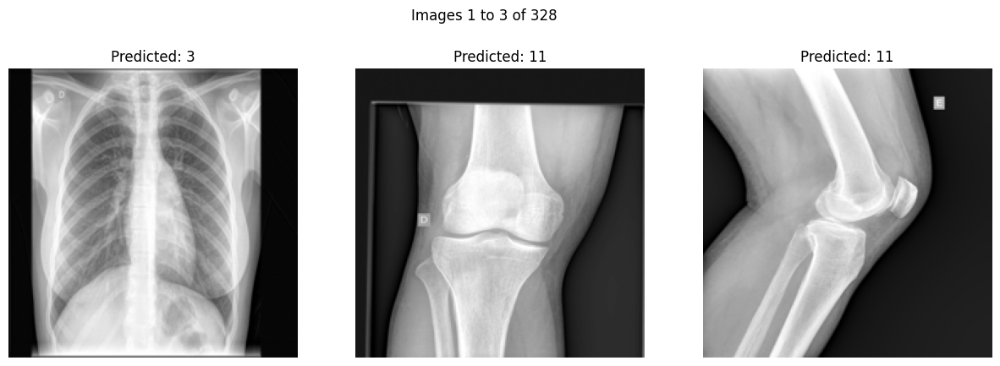

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Suponiendo que X_test_rgb son tus imágenes y que predicted_class_names contiene las clases predichas
Y_test['Predicted'] = predicted_class_names

# Inicializar una variable global para seguir el índice de la imagen actual
if 'current_index' not in globals():
    current_index = 0  # Comienza desde el primer índice al iniciar

def plot_next_images():
    global current_index
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Ajusta el tamaño si es necesario

    # Mostrar las próximas tres imágenes
    for i in range(3):
        index = current_index + i
        if index < len(X_test_rgb):  # Verificar que el índice no exceda el número de imágenes disponibles
            axes[i].imshow(X_test_rgb[index] / 255.0)  # Normalizar si es necesario
            axes[i].set_title(f'Predicted: {Y_test.loc[index, "Predicted"]}')
            axes[i].axis('off')
        else:
            axes[i].axis('off')  # Ocultar los ejes si el índice excede el número de imágenes

    # Mostrar el rango de imágenes actual y el total
    plt.suptitle(f'Images {current_index+1} to {min(current_index+3, len(X_test_rgb))} of {len(X_test_rgb)}')

    # Actualizar el índice actual para la próxima ejecución
    current_index += 3
    if current_index >= len(X_test_rgb):  # Resetear el índice si alcanzamos el final del conjunto de datos
        current_index = 0

    plt.show()

# Ejecutar la función para mostrar las imágenes
plot_next_images()


In [ ]:
Y_test.drop('Predicted', axis=1, inplace=True)

In [ ]:
# Resetear el índice de Y_test y eliminar el índice anterior
Y_test.reset_index(drop=True, inplace=True)

In [ ]:
Y_test['Target'] = predicted_class_names

In [ ]:
print(Y_test.columns)

Index(['SOPInstanceUID', 'Target'], dtype='object')


In [ ]:
Y_test.to_csv('/content/jorgedom.csv', index=False)


## Try6

In [ ]:
import os
import random
import glob
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image, ImageEnhance, ImageFilter
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Input, Activation, Add, ReLU, Convolution2D, BatchNormalization, Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D,Dense, Flatten, Concatenate
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from zipfile import ZipFile
from tqdm.notebook import tqdm as tqdm_notebook


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls "/content/drive/My Drive/"


 01_1_EDA.ipynb		   04_Perceptron.ipynb	     Workshop_1_Visión_Artificial.ipynb
 01_2_EDA.ipynb		   bankmarketing.csv	     Workshop_2_CIFAR10.ipynb
 01_Regression.ipynb	  'Colab Notebooks'	    'Workshop_3_Mnist (Solved).ipynb'
 02_Normalizacion.ipynb    Colab_Notebooks	     Workshop_5_Segmentation_fastai.ipynb
 03_Classificacion.ipynb   EDEM_1_Tokenizado.ipynb   Workshop_8_Challenge.ipynb


In [ ]:
Y_train = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/train.csv", delimiter=',')
Y_test = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/sample_submission.csv", delimiter=',')

In [ ]:
# Directorio donde se extraerán los archivos
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/sorted_train_images_2.zip" -d "/content/train_images"
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/test.zip" -d "/content/test_images/"

Archive:  /content/drive/My Drive/Colab_Notebooks/DP4/sorted_train_images_2.zip
   creating: /content/train_images/00/
   creating: /content/train_images/01/
   creating: /content/train_images/02/
   creating: /content/train_images/03/
   creating: /content/train_images/04/
   creating: /content/train_images/05/
   creating: /content/train_images/06/
   creating: /content/train_images/07/
   creating: /content/train_images/08/
   creating: /content/train_images/09/
   creating: /content/train_images/10/
   creating: /content/train_images/11/
   creating: /content/train_images/12/
   creating: /content/train_images/13/
   creating: /content/train_images/14/
   creating: /content/train_images/15/
   creating: /content/train_images/16/
   creating: /content/train_images/17/
   creating: /content/train_images/18/
   creating: /content/train_images/19/
   creating: /content/train_images/20/
   creating: /content/train_images/21/
  inflating: /content/train_images/07/1.2.826.0.1.3680043.8.49

In [ ]:
import os
from PIL import Image
import numpy as np

def load_and_save_images(folder_path, dataframe, output_base_path):
    images = []
    labels = []
    # Asegurar que exista el directorio base de salida
    if not os.path.exists(output_base_path):
        os.mkdir(output_base_path)

    for _, row in dataframe.iterrows():
        file_path = os.path.join(folder_path, row['SOPInstanceUID'] + '.png')  # Asumiendo que las extensiones son .png
        # Formatear el nombre del target folder para incluir ceros delante si es necesario
        target_folder_name = str(row['Target']).zfill(2)
        target_folder = os.path.join(output_base_path, target_folder_name)

        # Crear el directorio del Target si no existe
        if not os.path.exists(target_folder):
            os.mkdir(target_folder)

        # Cargar la imagen
        with Image.open(file_path) as img:
            img_array = np.array(img)
            images.append(img_array)
            labels.append(row['Target'])

        # Guardar la imagen en la carpeta correspondiente
        output_path = os.path.join(target_folder, row['SOPInstanceUID'] + '.png')
        img.save(output_path)

    return np.array(images), np.array(labels)


In [ ]:
# Rutas a los directorios
test_images_path = '/content/test_images'
output_test_images_path = '/content/sorted_test_images'

# Cargar y guardar las imágenes de entrenamiento
X_test, Y_test_labels = load_and_save_images(test_images_path, Y_test, output_test_images_path)


In [ ]:
listtrain = os.listdir("/content/train_images")
number_files_train = len(listtrain)
print(number_files_train)

listtest = os.listdir("/content/test_images")
number_files_test = len(listtest)
print(number_files_test)

22
328


In [ ]:
import os

# Ruta de la carpeta
folder_path = '/content/train_images/14'

# Contar el número de elementos en la carpeta
num_elements = len([name for name in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, name))])

print(f'Número de elementos en la carpeta {folder_path}: {num_elements}')

Número de elementos en la carpeta /content/train_images/14: 95


In [ ]:
X_test.shape

(328, 512, 512)

### EDA

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np  # Importa NumPy

# Inicializa una variable global para almacenar el índice actual
current_index = 70

def plot_images_from_folder(folder_path, start_index, num_images=2):
    global current_index  # Declara que vas a usar la variable global
    # List all files in the folder
    files = sorted([file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))])
    total_images = len(files)

    # Calculate end index
    end_index = start_index + num_images
    current_index = end_index  # Update current index for the next call

    # Select a subset of files
    files_to_display = files[start_index:end_index]

    # Create a figure with subplots
    fig, axes = plt.subplots(1, len(files_to_display), figsize=(15, 10))
    if len(files_to_display) == 1:
        axes = [axes]  # Make sure axes is iterable
    for ax, file in zip(axes, files_to_display):
        # Load the image
        img_path = os.path.join(folder_path, file)
        image = Image.open(img_path)
        image_np = np.array(image) / 255.0  # Convierte la imagen a un array NumPy y normalízala
        ax.imshow(image_np , cmap='gray')
        ax.axis('off')
        ax.set_title(f"{file}\nImage {files.index(file)+1} of {total_images}")

    plt.tight_layout()
    plt.show()


In [ ]:
folder_path = '/content/train_images/sorted_train_images/14'
plot_images_from_folder(folder_path, start_index=current_index)

FileNotFoundError: [Errno 2] No such file or directory: '/content/train_images/sorted_train_images/14'

In [ ]:
# import shutil
# from google.colab import files

# # Ruta de la carpeta que quieres comprimir
# folder_path = 'sorted_train_images_2'

# # Ruta del archivo zip que se creará
# zip_path = '/content/sorted_train_images_2.zip'

# # Crear el archivo zip
# shutil.make_archive(zip_path.replace('.zip', ''), 'zip', folder_path)

# # Descargar el archivo zip
# files.download(zip_path)


In [ ]:
base_dir = '/content/train_images'
img_size = 224
batch = 64

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(base_dir,
                                                       labels='inferred',
                                                       label_mode='categorical',
                                                       seed=42,
                                                       validation_split = 0.2,
                                                       subset = 'training',
                                                       batch_size = batch,
                                                       image_size = (img_size,img_size))

val_ds = tf.keras.utils.image_dataset_from_directory(base_dir,
                                                     labels='inferred',
                                                     label_mode='categorical',
                                                     seed=42,
                                                     validation_split = 0.2,
                                                     subset = 'validation',
                                                     batch_size = batch,
                                                     image_size = (img_size,img_size))


Found 1277 files belonging to 22 classes.
Using 1022 files for training.
Found 1277 files belonging to 22 classes.
Using 255 files for validation.


In [ ]:
num_classes = len(train_ds.class_names)

In [ ]:
train_classes= train_ds.class_names

In [ ]:
train_classes

In [ ]:
num_classes

In [ ]:
train_ds_iterator = train_ds.as_numpy_iterator()

In [ ]:
train_batch = train_ds_iterator.next()

In [ ]:
train_batch[0].shape

In [ ]:
train_batch[0]

In [ ]:
type(train_ds)

In [ ]:
val_ds_iterator = val_ds.as_numpy_iterator()

In [ ]:
val_batch = val_ds_iterator.next()

In [ ]:
val_batch[0].shape

In [ ]:
val_batch[0]

In [ ]:
type(val_ds)

In [ ]:
import tensorflow as tf

# Imprimir directamente los valores mínimo y máximo
print("Valor mínimo en el batch:", tf.reduce_min(train_batch[0]).numpy())
print("Valor máximo en el batch:", tf.reduce_max(train_batch[0]).numpy())


In [ ]:
import tensorflow as tf

# Imprimir directamente los valores mínimo y máximo
print("Valor mínimo en el batch:", tf.reduce_min(val_batch[0]).numpy())
print("Valor máximo en el batch:", tf.reduce_max(val_batch[0]).numpy())

In [ ]:
# train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))

In [ ]:
# train_ds = train_ds.map(lambda x, y: (x/255, y))
# val_ds = val_ds.map(lambda x, y: (x/255, y))

In [ ]:
# PLOTEAR BATCH SI QUEREMOS AQUI
# import matplotlib.pyplot as plt
# import numpy as np

# # Crear una figura con 4 subplots (ajustados en una fila)
# fig, ax = plt.subplots(ncols=4, figsize=(10, 10))

# # Iterar sobre los primeros 4 elementos del batch de imágenes
# for idx, img in enumerate(train_batch[0][:4]):
#     # Normaliza la imagen para visualización dividiéndola por 255
#     ax[idx].imshow(img / 255.0, cmap='gray')  # Asegúrate de que la normalización se aplique aquí
#     # Establece el título con la clase de la etiqueta, asumiendo que es un one-hot encoding
#     ax[idx].title.set_text('Clase ' + str(np.argmax(train_batch[1][idx])))
#     ax[idx].axis('off')  # Oculta los ejes

# plt.show()



In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Asegúrate de que train_ds está batcheado, si no, deberías aplicar .batch(n) donde n es el número de imágenes por batch que deseas.
for images, labels in train_ds.take(1):  # toma solo el primer batch
    # Ahora 'images' contiene un batch de imágenes 'x' normalizadas (dividido por 255)
    break  # Salimos del loop después de tomar el primer batch

n = 5  # Número de imágenes que quieres visualizar
plt.figure(figsize=(10, 10))  # Configura el tamaño de la figura
for i in range(n):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy()/255.0, cmap='gray')  # Muestra la imagen i-ésima del batch
    # Encuentra el índice de la etiqueta que es '1' en el vector one-hot
    label_index = np.argmax(labels[i])
    plt.title(f"Label: {label_index}")  # Muestra el índice como título
    plt.axis("off")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Asegúrate de que train_ds está batcheado, si no, deberías aplicar .batch(n) donde n es el número de imágenes por batch que deseas.
for images, labels in val_ds.take(1):  # toma solo el primer batch
    # Ahora 'images' contiene un batch de imágenes 'x' normalizadas (dividido por 255)
    break  # Salimos del loop después de tomar el primer batch

n = 5  # Número de imágenes que quieres visualizar
plt.figure(figsize=(10, 10))  # Configura el tamaño de la figura
for i in range(n):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy()/255.0, cmap='gray')  # Muestra la imagen i-ésima del batch
    # Encuentra el índice de la etiqueta que es '1' en el vector one-hot
    label_index = np.argmax(labels[i])
    plt.title(f"Label: {label_index}")  # Muestra el índice como título
    plt.axis("off")
plt.show()


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
# train_ds = train_ds.prefetch(buffer_size = AUTOTUNE)

In [ ]:
# val_ds = val_ds.prefetch(buffer_size = AUTOTUNE)

In [ ]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size = AUTOTUNE)

In [ ]:
val_ds = val_ds.cache().prefetch(buffer_size = AUTOTUNE)

In [ ]:
# DATA AUGMENTATION

### Model


In [ ]:
from tensorflow.keras import Sequential, layers

original_size = 224
crop_factor = 0.9
crop_size = int(original_size * crop_factor)

# El tamaño del recorte será 90% de 224, que es aproximadamente 201 píxeles
print("Tamaño del recorte:", crop_size)

data_augmentation = Sequential([
    layers.RandomRotation(factor=0.1),  # Rango de ±10 grados
    layers.RandomTranslation(height_factor=0.1, width_factor=0.1, fill_mode='reflect'),
    layers.RandomZoom(height_factor=(-0.1, 0.1), width_factor=(-0.1, 0.1))  # Zoom de +/- 10%
])


Tamaño del recorte: 201


In [ ]:
rescale = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255)
])

In [ ]:
from tensorflow.keras.applications import InceptionResNetV2, VGG19
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import concatenate, GlobalAveragePooling2D, BatchNormalization, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Funciones de preprocesamiento
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input as inception_preprocess
from tensorflow.keras.applications.vgg19 import preprocess_input as vgg_preprocess

# Cargar InceptionResNetV2
base_model1 = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model1.trainable = False  # Congelar el modelo

# Cargar VGG19
base_model2 = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model2.trainable = False  # Congelar el modelo

# Crear una entrada común
input = Input(shape=(224, 224, 3))

# Aplicar data augmentation
x = data_augmentation(input)

# Preprocesamiento específico de cada red
preprocessed_input1 = inception_preprocess(x)
preprocessed_input2 = vgg_preprocess(x)

# Obtener las características de ambos modelos
features1 = base_model1(preprocessed_input1)
features2 = base_model2(preprocessed_input2)

# Concatenar las características de ambos modelos
concatenated_features = concatenate([GlobalAveragePooling2D()(features1), GlobalAveragePooling2D()(features2)])
x = BatchNormalization()(concatenated_features)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.2)(x)
x = BatchNormalization()(x)
x = Dense(64, activation='relu')(x)
x = Dropout(0.2)(x)
x = BatchNormalization()(x)
output = Dense(22, activation='softmax')(x)

# Crear el modelo completo
model = Model(inputs=input, outputs=output)

# Compilar el modelo
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])



80134624/80134624 [==============================] - 1s 0us/step


In [ ]:
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
# Mostrar la arquitectura del modelo
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 sequential (Sequential)     (None, 224, 224, 3)          0         ['input_3[0][0]']             
                                                                                                  
 tf.math.truediv (TFOpLambd  (None, 224, 224, 3)          0         ['sequential[0][0]']          
 a)                                                                                               
                                                                                                  
 tf.__operators__.getitem (  (None, 224, 224, 3)          0         ['sequential[0][0]']      

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Configurar EarlyStopping
early_stopper = EarlyStopping(
    monitor='val_accuracy',  # Monitorea la pérdida de validación
    patience=5,          # Número de épocas sin mejora tras las cuales se detiene el entrenamiento
    restore_best_weights=True,  # Restaura los pesos del modelo con el mejor valor de la métrica monitoreada
    verbose = 1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',  # Monitorea la pérdida de validación
    factor=0.1,          # Factor por el cual se multiplicará la tasa de aprendizaje (tasa de aprendizaje nueva = tasa de aprendizaje actual * factor)
    patience=2,          # Número de épocas sin mejora después de las cuales se reduce la tasa de aprendizaje
    min_lr=1e-6,         # Límite inferior de la tasa de aprendizaje
    verbose=1
)

In [ ]:
# Entrenar el modelo
epochs=40
history = model.fit(train_ds,validation_data=val_ds,epochs=epochs,callbacks=[reduce_lr,early_stopper])


Epoch 1/40
16/16 [==============================] - 64s 2s/step - loss: 1.8763 - accuracy: 0.5157 - val_loss: 1.7848 - val_accuracy: 0.6118 - lr: 0.0010
Epoch 2/40
16/16 [==============================] - 7s 471ms/step - loss: 1.0273 - accuracy: 0.7544 - val_loss: 1.1639 - val_accuracy: 0.7255 - lr: 0.0010
Epoch 3/40
16/16 [==============================] - 7s 472ms/step - loss: 0.7077 - accuracy: 0.8571 - val_loss: 0.8853 - val_accuracy: 0.7922 - lr: 0.0010
Epoch 4/40
16/16 [==============================] - 7s 472ms/step - loss: 0.5476 - accuracy: 0.8924 - val_loss: 0.6976 - val_accuracy: 0.8275 - lr: 0.0010
Epoch 5/40
16/16 [==============================] - 7s 475ms/step - loss: 0.4315 - accuracy: 0.9168 - val_loss: 0.6273 - val_accuracy: 0.8471 - lr: 0.0010
Epoch 6/40
16/16 [==============================] - 7s 476ms/step - loss: 0.3537 - accuracy: 0.9227 - val_loss: 0.5786 - val_accuracy: 0.8549 - lr: 0.0010
Epoch 7/40
16/16 [==============================] - 8s 479ms/step - loss

In [ ]:
for layer in model.layers[-6:]:
    layer.trainable = True

optimizer = Adam(learning_rate=1e-6)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
epochs=20
history = model.fit(train_ds,validation_data=val_ds,epochs=epochs,callbacks=[early_stopper])

Epoch 1/20
16/16 [==============================] - 24s 762ms/step - loss: 0.1537 - accuracy: 0.9716 - val_loss: 0.4300 - val_accuracy: 0.9098
Epoch 2/20
16/16 [==============================] - 7s 471ms/step - loss: 0.1361 - accuracy: 0.9804 - val_loss: 0.4286 - val_accuracy: 0.9098
Epoch 3/20
16/16 [==============================] - 7s 471ms/step - loss: 0.1319 - accuracy: 0.9804 - val_loss: 0.4278 - val_accuracy: 0.9059
Epoch 4/20
16/16 [==============================] - 7s 474ms/step - loss: 0.1550 - accuracy: 0.9736 - val_loss: 0.4273 - val_accuracy: 0.9059
Epoch 5/20
16/16 [==============================] - 7s 475ms/step - loss: 0.1388 - accuracy: 0.9736 - val_loss: 0.4271 - val_accuracy: 0.9020
Epoch 6/20
16/16 [==============================] - 8s 507ms/step - loss: 0.1527 - accuracy: 0.9706 - val_loss: 0.4270 - val_accuracy: 0.9059
Epoch 6: early stopping


In [ ]:
model.save('modelVGG19InceptionResNetV2_try13_091.h5')  # Guarda el modelo como un archivo HDF5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### VISUALIZAR DONDE SE EQUIVOCA

In [ ]:
# # Realiza predicciones sobre el conjunto de validación
# val_predictions = model.predict(val_ds)
# predicted_classes = np.argmax(val_predictions, axis=1)

# # Obtén las etiquetas reales del conjunto de validación
# true_labels = np.concatenate([y for x, y in val_ds], axis=0)
# true_classes = np.argmax(true_labels, axis=1)

In [ ]:
# # Encuentra los índices de las predicciones incorrectas
# incorrect_indices = np.where(predicted_classes != true_classes)[0]


In [ ]:
current_page = 0
images_per_page = 2

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output

# Asumiendo que val_ds contiene tuplas de (imagenes, etiquetas)
# Preparar datos para visualización y evaluación
images = []
true_classes = []

# Iterar sobre el dataset para recopilar imágenes y etiquetas
for image_batch, label_batch in val_ds:
    images.extend(image_batch.numpy())  # Convierte tensor a numpy y agrega a la lista
    true_classes.extend(np.argmax(label_batch.numpy(), axis=1))  # Convierte etiquetas one-hot a índices de clase

# Realizar predicciones sobre el conjunto de validación
val_predictions = model.predict(val_ds)
predicted_classes = np.argmax(val_predictions, axis=1)

# Encuentra los índices de las predicciones incorrectas
incorrect_indices = np.where(predicted_classes != np.array(true_classes))[0]

# Variables para controlar la paginación
total_images = len(incorrect_indices)
images_per_page = 2

# Función para mostrar una serie de imágenes
def plot_images(page_number=0):
    start_index = page_number * images_per_page
    end_index = min(start_index + images_per_page, total_images)
    fig, axes = plt.subplots(1, images_per_page, figsize=(10, 5))

    for i in range(images_per_page):
        idx = start_index + i
        if idx < total_images:
            ax = axes[i]
            incorrect_img_idx = incorrect_indices[idx]
            img = images[incorrect_img_idx]  # Asume que las imágenes están en formato adecuado
            ax.imshow(img[..., 0], cmap='gray')  # Muestra el canal adecuado según tus imágenes
            ax.title.set_text(f'Predicted: {predicted_classes[incorrect_img_idx]}, True: {true_classes[incorrect_img_idx]}')
            ax.axis('off')
        else:
            axes[i].axis('off')

    plt.suptitle(f'Incorrect Images {start_index + 1} to {end_index} of {total_images}')
    plt.show()

# Slider para controlar la página
page_slider = widgets.IntSlider(min=0, max=(total_images // images_per_page) - (0 if total_images % images_per_page == 0 else 1), step=1, value=0)

# Mostrar el slider y las imágenes iniciales
widgets.interact(plot_images, page_number=page_slider)


### PREDICIONES

In [ ]:
X_test.shape

(328, 512, 512)

In [ ]:
# Asumiendo que X_test es un array de imágenes en escala de grises de shape (328, 512, 512)
# Primero, expande la dimensión de canales
X_test = tf.expand_dims(X_test, axis=-1)  # Esto cambiará la forma a (328, 512, 512, 1)




In [ ]:
X_test.shape

TensorShape([328, 512, 512, 1])

In [ ]:
def preprocess_images(images, target_size=(224, 224)):
    # Redimensiona las imágenes
    images = tf.image.resize(images, target_size)  # Ahora, esto redimensionará correctamente
    return images

# Redimensionar las imágenes
X_test_resized = preprocess_images(X_test)

# Verifica la forma del tensor antes de predecir
print("Forma del tensor de imágenes redimensionadas:", X_test_resized.shape)
# Debería ser (328, 256, 256, 1) para imágenes en escala de grises

# Si las imágenes deben ser a color y tienen 3 canales, asegúrate de que X_test inicialmente tenga esa cuarta dimensión.

Forma del tensor de imágenes redimensionadas: (328, 224, 224, 1)


In [ ]:
X_test.shape

TensorShape([328, 512, 512, 1])

In [ ]:
X_test_resized.shape

TensorShape([328, 224, 224, 1])

In [ ]:
import tensorflow as tf

# Función para convertir imágenes de escala de grises a RGB
def convert_to_rgb(images):
    # Repite el canal de grises tres veces para simular una imagen RGB
    images_rgb = tf.image.grayscale_to_rgb(images)
    return images_rgb

# Asumiendo que X_test_resized ya está en la forma (328, 224, 224, 1)
X_test_rgb = convert_to_rgb(X_test_resized)

# Ahora X_test_rgb debería tener la forma (328, 224, 224, 3)
print("Forma del tensor de imágenes RGB:", X_test_rgb.shape)

Forma del tensor de imágenes RGB: (328, 224, 224, 3)


In [ ]:
predicted_probabilities = model.predict(X_test_rgb)

11/11 [==============================] - 15s 425ms/step


In [ ]:
predicted_class_names = np.argmax(predicted_probabilities, axis=1)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from ipywidgets import interact, IntSlider

# Suponiendo que X_test_rgb son tus imágenes y que predicted_class_names contiene las clases predichas
Y_test['Predicted'] = predicted_class_names

def plot_image(index):
    plt.figure(figsize=(5, 5))
    plt.imshow(X_test_rgb[index] / 255.0)  # Asegúrate de que las imágenes estén normalizadas si es necesario
    plt.title(f'Predicted: {Y_test.loc[index, "Predicted"]}')
    plt.axis('off')
    plt.show()

# Crear un slider para navegar entre las imágenes
interact(plot_image, index=IntSlider(min=0, max=len(X_test_rgb)-1, step=1, value=0))


interactive(children=(IntSlider(value=0, description='index', max=327), Output()), _dom_classes=('widget-inter…

<function __main__.plot_image(index)>

In [ ]:
current_index = 0

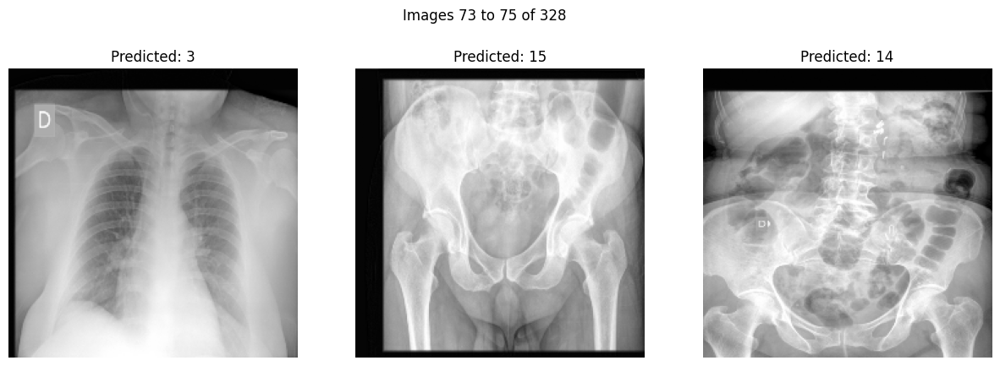

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Suponiendo que X_test_rgb son tus imágenes y que predicted_class_names contiene las clases predichas
Y_test['Predicted'] = predicted_class_names

# Inicializar una variable global para seguir el índice de la imagen actual
if 'current_index' not in globals():
    current_index = 0  # Comienza desde el primer índice al iniciar

def plot_next_images():
    global current_index
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Ajusta el tamaño si es necesario

    # Mostrar las próximas tres imágenes
    for i in range(3):
        index = current_index + i
        if index < len(X_test_rgb):  # Verificar que el índice no exceda el número de imágenes disponibles
            axes[i].imshow(X_test_rgb[index] / 255.0)  # Normalizar si es necesario
            axes[i].set_title(f'Predicted: {Y_test.loc[index, "Predicted"]}')
            axes[i].axis('off')
        else:
            axes[i].axis('off')  # Ocultar los ejes si el índice excede el número de imágenes

    # Mostrar el rango de imágenes actual y el total
    plt.suptitle(f'Images {current_index+1} to {min(current_index+3, len(X_test_rgb))} of {len(X_test_rgb)}')

    # Actualizar el índice actual para la próxima ejecución
    current_index += 3
    if current_index >= len(X_test_rgb):  # Resetear el índice si alcanzamos el final del conjunto de datos
        current_index = 0

    plt.show()

# Ejecutar la función para mostrar las imágenes
plot_next_images()


In [ ]:
Y_test.drop('Predicted', axis=1, inplace=True)

In [ ]:
# Resetear el índice de Y_test y eliminar el índice anterior
Y_test.reset_index(drop=True, inplace=True)

In [ ]:
Y_test['Target'] = predicted_class_names

In [ ]:
print(Y_test.columns)

Index(['SOPInstanceUID', 'Target'], dtype='object')


In [ ]:
Y_test.to_csv('/content/predicted_qlote.csv', index=False)


## Try 7

In [ ]:
import os
import random
import glob
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image, ImageEnhance, ImageFilter
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Input, Activation, Add, ReLU, Convolution2D, BatchNormalization, Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D,Dense, Flatten, Concatenate
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from zipfile import ZipFile
from tqdm.notebook import tqdm as tqdm_notebook


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls "/content/drive/My Drive/"


 01_1_EDA.ipynb				   EDEM_1_Tokenizado.ipynb
 01_2_EDA.ipynb				   metaflow-basics.ipynb
 01_Regression.ipynb			   metaflow-model-training.ipynb
 02_LinearRegressionImplementation.ipynb   trainset+mura_images
 02_Normalizacion.ipynb			   Workshop_1_Visión_Artificial.ipynb
 03_Classificacion.ipynb		   Workshop_2_CIFAR10.ipynb
 04_Perceptron.ipynb			  'Workshop_3_Mnist (Solved).ipynb'
 bankmarketing.csv			   Workshop_5_Segmentation_fastai.ipynb
'Colab Notebooks'			   Workshop_8_Challenge.ipynb
 Colab_Notebooks


In [ ]:
Y_train = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/train.csv", delimiter=',')
Y_test = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/sample_submission.csv", delimiter=',')

In [ ]:
# Directorio donde se extraerán los archivos
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/test.zip" -d "/content/test_images/"

Archive:  /content/drive/My Drive/Colab_Notebooks/DP4/test.zip
  inflating: /content/test_images/1.2.826.0.1.3680043.8.498.96341045777069078539684392201659993490.png  
  inflating: /content/test_images/1.2.826.0.1.3680043.8.498.78547493856827312437836387017877591660.png  
  inflating: /content/test_images/1.2.826.0.1.3680043.8.498.89570960388945351624625586720783962554.png  
  inflating: /content/test_images/1.2.826.0.1.3680043.8.498.86713234754450346697570307802905763492.png  
  inflating: /content/test_images/1.2.826.0.1.3680043.8.498.80928594779038217662239495768796594729.png  
  inflating: /content/test_images/1.2.826.0.1.3680043.8.498.92284711727470407755375436328709495348.png  
  inflating: /content/test_images/1.2.826.0.1.3680043.8.498.92006557287137600549927011234763440782.png  
  inflating: /content/test_images/1.2.826.0.1.3680043.8.498.89836102392358230941005086332549732866.png  
  inflating: /content/test_images/1.2.826.0.1.3680043.8.498.7838826154026775030234520562808780374

In [ ]:
import os
from PIL import Image
import numpy as np

def load_and_save_images(folder_path, dataframe, output_base_path):
    images = []
    labels = []
    # Asegurar que exista el directorio base de salida
    if not os.path.exists(output_base_path):
        os.mkdir(output_base_path)

    for _, row in dataframe.iterrows():
        file_path = os.path.join(folder_path, row['SOPInstanceUID'] + '.png')  # Asumiendo que las extensiones son .png
        # Formatear el nombre del target folder para incluir ceros delante si es necesario
        target_folder_name = str(row['Target']).zfill(2)
        target_folder = os.path.join(output_base_path, target_folder_name)

        # Crear el directorio del Target si no existe
        if not os.path.exists(target_folder):
            os.mkdir(target_folder)

        # Cargar la imagen
        with Image.open(file_path) as img:
            img_array = np.array(img)
            images.append(img_array)
            labels.append(row['Target'])

        # Guardar la imagen en la carpeta correspondiente
        output_path = os.path.join(target_folder, row['SOPInstanceUID'] + '.png')
        img.save(output_path)

    return np.array(images), np.array(labels)


In [ ]:
# Rutas a los directorios
test_images_path = '/content/test_images'
output_test_images_path = '/content/sorted_test_images'

# Cargar y guardar las imágenes de entrenamiento
X_test, Y_test_labels = load_and_save_images(test_images_path, Y_test, output_test_images_path)


In [ ]:
# listtrain = os.listdir("/content/train_images")
# number_files_train = len(listtrain)
# print(number_files_train)

# listtest = os.listdir("/content/test_images")
# number_files_test = len(listtest)
# print(number_files_test)

FileNotFoundError: [Errno 2] No such file or directory: '/content/train_images'

In [ ]:
X_test.shape

### EDA

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np  # Importa NumPy

# Inicializa una variable global para almacenar el índice actual
current_index = 70

def plot_images_from_folder(folder_path, start_index, num_images=2):
    global current_index  # Declara que vas a usar la variable global
    # List all files in the folder
    files = sorted([file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))])
    total_images = len(files)

    # Calculate end index
    end_index = start_index + num_images
    current_index = end_index  # Update current index for the next call

    # Select a subset of files
    files_to_display = files[start_index:end_index]

    # Create a figure with subplots
    fig, axes = plt.subplots(1, len(files_to_display), figsize=(15, 10))
    if len(files_to_display) == 1:
        axes = [axes]  # Make sure axes is iterable
    for ax, file in zip(axes, files_to_display):
        # Load the image
        img_path = os.path.join(folder_path, file)
        image = Image.open(img_path)
        image_np = np.array(image) / 255.0  # Convierte la imagen a un array NumPy y normalízala
        ax.imshow(image_np , cmap='gray')
        ax.axis('off')
        ax.set_title(f"{file}\nImage {files.index(file)+1} of {total_images}")

    plt.tight_layout()
    plt.show()


In [ ]:
# folder_path = '/content/train_images/sorted_train_images/14'
# plot_images_from_folder(folder_path, start_index=current_index)

In [ ]:
# import shutil
# from google.colab import files

# # Ruta de la carpeta que quieres comprimir
# folder_path = 'sorted_train_images_2'

# # Ruta del archivo zip que se creará
# zip_path = '/content/sorted_train_images_2.zip'

# # Crear el archivo zip
# shutil.make_archive(zip_path.replace('.zip', ''), 'zip', folder_path)

# # Descargar el archivo zip
# files.download(zip_path)


In [ ]:
base_dir = '/content/drive/My Drive/trainset+mura_images'
img_size = 224
batch = 64

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(base_dir,
                                                       labels='inferred',
                                                       label_mode='categorical',
                                                       seed=42,
                                                       validation_split = 0.2,
                                                       subset = 'training',
                                                       batch_size = batch,
                                                       image_size = (img_size,img_size))

val_ds = tf.keras.utils.image_dataset_from_directory(base_dir,
                                                     labels='inferred',
                                                     label_mode='categorical',
                                                     seed=42,
                                                     validation_split = 0.2,
                                                     subset = 'validation',
                                                     batch_size = batch,
                                                     image_size = (img_size,img_size))


Found 9725 files belonging to 22 classes.
Using 7780 files for training.
Found 9725 files belonging to 22 classes.
Using 1945 files for validation.


In [ ]:
num_classes = len(train_ds.class_names)

In [ ]:
train_classes= train_ds.class_names

In [ ]:
train_classes

In [ ]:
num_classes

In [ ]:
train_ds_iterator = train_ds.as_numpy_iterator()

In [ ]:
train_batch = train_ds_iterator.next()

In [ ]:
train_batch[0].shape

In [ ]:
train_batch[0]

In [ ]:
type(train_ds)

In [ ]:
val_ds_iterator = val_ds.as_numpy_iterator()

In [ ]:
val_batch = val_ds_iterator.next()

In [ ]:
val_batch[0].shape

In [ ]:
val_batch[0]

In [ ]:
type(val_ds)

In [ ]:
import tensorflow as tf

# Imprimir directamente los valores mínimo y máximo
print("Valor mínimo en el batch:", tf.reduce_min(train_batch[0]).numpy())
print("Valor máximo en el batch:", tf.reduce_max(train_batch[0]).numpy())


In [ ]:
import tensorflow as tf

# Imprimir directamente los valores mínimo y máximo
print("Valor mínimo en el batch:", tf.reduce_min(val_batch[0]).numpy())
print("Valor máximo en el batch:", tf.reduce_max(val_batch[0]).numpy())

In [ ]:
# train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))

In [ ]:
# train_ds = train_ds.map(lambda x, y: (x/255, y))
# val_ds = val_ds.map(lambda x, y: (x/255, y))

In [ ]:
# PLOTEAR BATCH SI QUEREMOS AQUI
# import matplotlib.pyplot as plt
# import numpy as np

# # Crear una figura con 4 subplots (ajustados en una fila)
# fig, ax = plt.subplots(ncols=4, figsize=(10, 10))

# # Iterar sobre los primeros 4 elementos del batch de imágenes
# for idx, img in enumerate(train_batch[0][:4]):
#     # Normaliza la imagen para visualización dividiéndola por 255
#     ax[idx].imshow(img / 255.0, cmap='gray')  # Asegúrate de que la normalización se aplique aquí
#     # Establece el título con la clase de la etiqueta, asumiendo que es un one-hot encoding
#     ax[idx].title.set_text('Clase ' + str(np.argmax(train_batch[1][idx])))
#     ax[idx].axis('off')  # Oculta los ejes

# plt.show()



In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Asegúrate de que train_ds está batcheado, si no, deberías aplicar .batch(n) donde n es el número de imágenes por batch que deseas.
for images, labels in train_ds.take(1):  # toma solo el primer batch
    # Ahora 'images' contiene un batch de imágenes 'x' normalizadas (dividido por 255)
    break  # Salimos del loop después de tomar el primer batch

n = 5  # Número de imágenes que quieres visualizar
plt.figure(figsize=(10, 10))  # Configura el tamaño de la figura
for i in range(n):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy()/255.0, cmap='gray')  # Muestra la imagen i-ésima del batch
    # Encuentra el índice de la etiqueta que es '1' en el vector one-hot
    label_index = np.argmax(labels[i])
    plt.title(f"Label: {label_index}")  # Muestra el índice como título
    plt.axis("off")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Asegúrate de que train_ds está batcheado, si no, deberías aplicar .batch(n) donde n es el número de imágenes por batch que deseas.
for images, labels in val_ds.take(1):  # toma solo el primer batch
    # Ahora 'images' contiene un batch de imágenes 'x' normalizadas (dividido por 255)
    break  # Salimos del loop después de tomar el primer batch

n = 5  # Número de imágenes que quieres visualizar
plt.figure(figsize=(10, 10))  # Configura el tamaño de la figura
for i in range(n):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy()/255.0, cmap='gray')  # Muestra la imagen i-ésima del batch
    # Encuentra el índice de la etiqueta que es '1' en el vector one-hot
    label_index = np.argmax(labels[i])
    plt.title(f"Label: {label_index}")  # Muestra el índice como título
    plt.axis("off")
plt.show()


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
# train_ds = train_ds.prefetch(buffer_size = AUTOTUNE)

In [ ]:
# val_ds = val_ds.prefetch(buffer_size = AUTOTUNE)

In [ ]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size = AUTOTUNE)

In [ ]:
val_ds = val_ds.cache().prefetch(buffer_size = AUTOTUNE)

In [ ]:
# DATA AUGMENTATION

### Model


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.densenet import preprocess_input
from tensorflow.keras.layers import (Input, Dense, GlobalAveragePooling2D, Dropout,
                                     BatchNormalization)
from tensorflow.keras.models import Model
from tensorflow.keras import layers

def build_custom_chexnet_model(num_classes=22, weights_path=None):
    # Definir la entrada del modelo
    inputs = Input(shape=(224, 224, 3))

    # Aplicar preprocess_input para normalizar las imágenes
    x = preprocess_input(inputs)

    # Data augmentation directamente en el modelo
    x = layers.RandomRotation(factor=0.1)(x)
    x = layers.RandomTranslation(height_factor=0.1, width_factor=0.1, fill_mode='reflect')(x)
    x = layers.RandomZoom(height_factor=(-0.1, 0.1), width_factor=(-0.1, 0.1))(x)

    # Cargar DenseNet121 con pesos preentrenados de ImageNet
    base_model = DenseNet121(include_top=False, weights='imagenet', input_tensor=x)
    x = base_model.output
    x = GlobalAveragePooling2D()(x)

    # Añadir capas personalizadas según tu necesidad
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = BatchNormalization()(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = BatchNormalization()(x)

    # Capa de salida con activación softmax para clasificación multiclase
    outputs = Dense(num_classes, activation='softmax')(x)

    # Crear el modelo final
    model = Model(inputs=inputs, outputs=outputs)

    # Cargar pesos específicos si se proporciona la ruta
    if weights_path:
        # Cargar todos los pesos excepto la última capa con los nombres de capa correspondientes y omitiendo desajustes
        model.load_weights(weights_path, by_name=True, skip_mismatch=True)

    return model

# Ruta a los pesos de CheXNet, ajusta según sea necesario
weights_path = '/content/drive/My Drive/Colab_Notebooks/DP4/CheXNet weights.h5'

# Crear el modelo con 22 clases
chexnet_model = build_custom_chexnet_model(num_classes=22, weights_path=weights_path)

# Verificar la estructura del modelo
chexnet_model.summary()


29084464/29084464 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 tf.math.truediv (TFOpLambd  (None, 224, 224, 3)          0         ['input_1[0][0]']             
 a)                                                                                               
                                                                                                  
 tf.nn.bias_add (TFOpLambda  (None, 224, 224, 3)          0         ['tf.math.truediv[0][0]']     
 )                                                                                                
                             

In [ ]:
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001)
chexnet_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Configurar EarlyStopping
early_stopper = EarlyStopping(
    monitor='val_accuracy',  # Monitorea la pérdida de validación
    patience=5,          # Número de épocas sin mejora tras las cuales se detiene el entrenamiento
    restore_best_weights=True,  # Restaura los pesos del modelo con el mejor valor de la métrica monitoreada
    verbose = 1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',  # Monitorea la pérdida de validación
    factor=0.1,          # Factor por el cual se multiplicará la tasa de aprendizaje (tasa de aprendizaje nueva = tasa de aprendizaje actual * factor)
    patience=2,          # Número de épocas sin mejora después de las cuales se reduce la tasa de aprendizaje
    min_lr=1e-6,         # Límite inferior de la tasa de aprendizaje
    verbose=1
)

In [ ]:
# Resumen del modelo
chexnet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 tf.math.truediv (TFOpLambd  (None, 224, 224, 3)          0         ['input_1[0][0]']             
 a)                                                                                               
                                                                                                  
 tf.nn.bias_add (TFOpLambda  (None, 224, 224, 3)          0         ['tf.math.truediv[0][0]']     
 )                                                                                                
                                                                                              

In [ ]:
# Entrenar el modelo
epochs=40
history = chexnet_model.fit(train_ds,validation_data=val_ds,epochs=epochs,callbacks=[reduce_lr,early_stopper])


Epoch 1/40
122/122 [==============================] - 495s 1s/step - loss: 1.8151 - accuracy: 0.4792 - val_loss: 1.6487 - val_accuracy: 0.6463 - lr: 0.0010
Epoch 2/40
122/122 [==============================] - 52s 429ms/step - loss: 0.8375 - accuracy: 0.7671 - val_loss: 1.4266 - val_accuracy: 0.5573 - lr: 0.0010
Epoch 3/40
122/122 [==============================] - 52s 429ms/step - loss: 0.5618 - accuracy: 0.8458 - val_loss: 0.7823 - val_accuracy: 0.7728 - lr: 0.0010
Epoch 4/40
122/122 [==============================] - 52s 430ms/step - loss: 0.4489 - accuracy: 0.8748 - val_loss: 0.5684 - val_accuracy: 0.8247 - lr: 0.0010
Epoch 5/40
122/122 [==============================] - 52s 429ms/step - loss: 0.3762 - accuracy: 0.8902 - val_loss: 0.4629 - val_accuracy: 0.8643 - lr: 0.0010
Epoch 6/40
122/122 [==============================] - 52s 428ms/step - loss: 0.3167 - accuracy: 0.9098 - val_loss: 0.5189 - val_accuracy: 0.8519 - lr: 0.0010
Epoch 7/40
122/122 [==============================] - 

In [ ]:
for layer in chexnet_model.layers[-3:]:
    layer.trainable = True

optimizer = Adam(learning_rate=1e-7)
chexnet_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
epochs=20
history = chexnet_model.fit(train_ds,validation_data=val_ds,epochs=epochs,callbacks=[early_stopper])

Epoch 1/20
122/122 [==============================] - 106s 446ms/step - loss: 0.1085 - accuracy: 0.9710 - val_loss: 0.1981 - val_accuracy: 0.9486
Epoch 2/20
122/122 [==============================] - 52s 427ms/step - loss: 0.1108 - accuracy: 0.9706 - val_loss: 0.2054 - val_accuracy: 0.9476
Epoch 3/20
122/122 [==============================] - 52s 428ms/step - loss: 0.1064 - accuracy: 0.9722 - val_loss: 0.2090 - val_accuracy: 0.9460
Epoch 4/20
122/122 [==============================] - 52s 427ms/step - loss: 0.1042 - accuracy: 0.9731 - val_loss: 0.2077 - val_accuracy: 0.9460
Epoch 5/20
122/122 [==============================] - 52s 427ms/step - loss: 0.1169 - accuracy: 0.9699 - val_loss: 0.2089 - val_accuracy: 0.9460
Epoch 6/20
122/122 [==============================] - 52s 428ms/step - loss: 0.1105 - accuracy: 0.9694 - val_loss: 0.2099 - val_accuracy: 0.9455
Epoch 6: early stopping


In [ ]:
chexnett_model.save('modelchexnet_model_087.h5')  # Guarda el modelo como un archivo HDF5


### VISUALIZAR DONDE SE EQUIVOCA

In [ ]:
# # Realiza predicciones sobre el conjunto de validación
# val_predictions = model.predict(val_ds)
# predicted_classes = np.argmax(val_predictions, axis=1)

# # Obtén las etiquetas reales del conjunto de validación
# true_labels = np.concatenate([y for x, y in val_ds], axis=0)
# true_classes = np.argmax(true_labels, axis=1)

In [ ]:
# # Encuentra los índices de las predicciones incorrectas
# incorrect_indices = np.where(predicted_classes != true_classes)[0]


In [ ]:
current_page = 0
images_per_page = 2

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output

# Asumiendo que val_ds contiene tuplas de (imagenes, etiquetas)
# Preparar datos para visualización y evaluación
images = []
true_classes = []

# Iterar sobre el dataset para recopilar imágenes y etiquetas
for image_batch, label_batch in val_ds:
    images.extend(image_batch.numpy())  # Convierte tensor a numpy y agrega a la lista
    true_classes.extend(np.argmax(label_batch.numpy(), axis=1))  # Convierte etiquetas one-hot a índices de clase

# Realizar predicciones sobre el conjunto de validación
val_predictions = chexnet_model.predict(val_ds)
predicted_classes = np.argmax(val_predictions, axis=1)

# Encuentra los índices de las predicciones incorrectas
incorrect_indices = np.where(predicted_classes != np.array(true_classes))[0]

# Variables para controlar la paginación
total_images = len(incorrect_indices)
images_per_page = 2

# Función para mostrar una serie de imágenes
def plot_images(page_number=0):
    start_index = page_number * images_per_page
    end_index = min(start_index + images_per_page, total_images)
    fig, axes = plt.subplots(1, images_per_page, figsize=(10, 5))

    for i in range(images_per_page):
        idx = start_index + i
        if idx < total_images:
            ax = axes[i]
            incorrect_img_idx = incorrect_indices[idx]
            img = images[incorrect_img_idx]  # Asume que las imágenes están en formato adecuado
            ax.imshow(img[..., 0], cmap='gray')  # Muestra el canal adecuado según tus imágenes
            ax.title.set_text(f'Predicted: {predicted_classes[incorrect_img_idx]}, True: {true_classes[incorrect_img_idx]}')
            ax.axis('off')
        else:
            axes[i].axis('off')

    plt.suptitle(f'Incorrect Images {start_index + 1} to {end_index} of {total_images}')
    plt.show()

# Slider para controlar la página
page_slider = widgets.IntSlider(min=0, max=(total_images // images_per_page) - (0 if total_images % images_per_page == 0 else 1), step=1, value=0)

# Mostrar el slider y las imágenes iniciales
widgets.interact(plot_images, page_number=page_slider)


### PREDICIONES

In [ ]:
X_test.shape

(328, 512, 512)

In [ ]:
# Asumiendo que X_test es un array de imágenes en escala de grises de shape (328, 512, 512)
# Primero, expande la dimensión de canales
X_test = tf.expand_dims(X_test, axis=-1)  # Esto cambiará la forma a (328, 512, 512, 1)




In [ ]:
X_test.shape

TensorShape([328, 512, 512, 1])

In [ ]:
def preprocess_images(images, target_size=(224, 224)):
    # Redimensiona las imágenes
    images = tf.image.resize(images, target_size)  # Ahora, esto redimensionará correctamente
    return images

# Redimensionar las imágenes
X_test_resized = preprocess_images(X_test)

# Verifica la forma del tensor antes de predecir
print("Forma del tensor de imágenes redimensionadas:", X_test_resized.shape)
# Debería ser (328, 256, 256, 1) para imágenes en escala de grises

# Si las imágenes deben ser a color y tienen 3 canales, asegúrate de que X_test inicialmente tenga esa cuarta dimensión.

Forma del tensor de imágenes redimensionadas: (328, 224, 224, 1)


In [ ]:
X_test.shape

TensorShape([328, 512, 512, 1])

In [ ]:
X_test_resized.shape

TensorShape([328, 224, 224, 1])

In [ ]:
import tensorflow as tf

# Función para convertir imágenes de escala de grises a RGB
def convert_to_rgb(images):
    # Repite el canal de grises tres veces para simular una imagen RGB
    images_rgb = tf.image.grayscale_to_rgb(images)
    return images_rgb

# Asumiendo que X_test_resized ya está en la forma (328, 224, 224, 1)
X_test_rgb = convert_to_rgb(X_test_resized)

# Ahora X_test_rgb debería tener la forma (328, 224, 224, 3)
print("Forma del tensor de imágenes RGB:", X_test_rgb.shape)

Forma del tensor de imágenes RGB: (328, 224, 224, 3)


In [ ]:
predicted_probabilities = chexnet_model.predict(X_test_rgb)

11/11 [==============================] - 3s 73ms/step


In [ ]:
predicted_class_names = np.argmax(predicted_probabilities, axis=1)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from ipywidgets import interact, IntSlider

# Suponiendo que X_test_rgb son tus imágenes y que predicted_class_names contiene las clases predichas
Y_test['Predicted'] = predicted_class_names

def plot_image(index):
    plt.figure(figsize=(5, 5))
    plt.imshow(X_test_rgb[index] / 255.0)  # Asegúrate de que las imágenes estén normalizadas si es necesario
    plt.title(f'Predicted: {Y_test.loc[index, "Predicted"]}')
    plt.axis('off')
    plt.show()

# Crear un slider para navegar entre las imágenes
interact(plot_image, index=IntSlider(min=0, max=len(X_test_rgb)-1, step=1, value=0))


In [ ]:
current_index = 326

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Suponiendo que X_test_rgb son tus imágenes y que predicted_class_names contiene las clases predichas
Y_test['Predicted'] = predicted_class_names

# Inicializar una variable global para seguir el índice de la imagen actual
if 'current_index' not in globals():
    current_index = 0  # Comienza desde el primer índice al iniciar

def plot_next_images():
    global current_index
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Ajusta el tamaño si es necesario

    # Mostrar las próximas tres imágenes
    for i in range(3):
        index = current_index + i
        if index < len(X_test_rgb):  # Verificar que el índice no exceda el número de imágenes disponibles
            axes[i].imshow(X_test_rgb[index] / 255.0)  # Normalizar si es necesario
            axes[i].set_title(f'Predicted: {Y_test.loc[index, "Predicted"]}')
            axes[i].axis('off')
        else:
            axes[i].axis('off')  # Ocultar los ejes si el índice excede el número de imágenes

    # Mostrar el rango de imágenes actual y el total
    plt.suptitle(f'Images {current_index+1} to {min(current_index+3, len(X_test_rgb))} of {len(X_test_rgb)}')

    # Actualizar el índice actual para la próxima ejecución
    current_index += 3
    if current_index >= len(X_test_rgb):  # Resetear el índice si alcanzamos el final del conjunto de datos
        current_index = 0

    plt.show()

# Ejecutar la función para mostrar las imágenes
plot_next_images()


In [ ]:
Y_test.drop('Predicted', axis=1, inplace=True)

In [ ]:
# Resetear el índice de Y_test y eliminar el índice anterior
Y_test.reset_index(drop=True, inplace=True)

In [ ]:
Y_test['Target'] = predicted_class_names

In [ ]:
print(Y_test.columns)

Index(['SOPInstanceUID', 'Target'], dtype='object')


In [ ]:
Y_test.to_csv('/content/predicted_jarupu.csv', index=False)


## Try 8

In [ ]:
import os
import random
import glob
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image, ImageEnhance, ImageFilter
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Input, Activation, Add, ReLU, Convolution2D, BatchNormalization, Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D,Dense, Flatten, Concatenate
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from zipfile import ZipFile
from tqdm.notebook import tqdm as tqdm_notebook


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls "/content/drive/My Drive/"


 01_1_EDA.ipynb		   Colab_Notebooks
 01_2_EDA.ipynb		  'Makis - Betera. 2ª Parte. 26-feb-2024.mp4'
 01_Regression.ipynb	  'Makis - Betera Salut. 1ª Parte-26-feb-2024.mp4'
 02_Normalizacion.ipynb    Workshop_1_Visión_Artificial.ipynb
 03_Classificacion.ipynb   Workshop_2_CIFAR10.ipynb
 04_Perceptron.ipynb	   Workshop_5_Segmentation_fastai.ipynb
 bankmarketing.csv	   Workshop_8_Challenge.ipynb
'Colab Notebooks'


In [ ]:
Y_train = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/train.csv", delimiter=',')
Y_test = pd.read_csv("/content/drive/My Drive/Colab_Notebooks/DP4/sample_submission.csv", delimiter=',')

In [ ]:
# Directorio donde se extraerán los archivos
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/sorted_train_images.zip" -d "/content/train_images"
!unzip "/content/drive/My Drive/Colab_Notebooks/DP4/test.zip" -d "/content/test_images/"

Archive:  /content/drive/My Drive/Colab_Notebooks/DP4/sorted_train_images.zip
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.84376932274171387825449553240103366458.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.10677807821925693390499268368372932921.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.49400526067632042474199585836196052618.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.66322363497584370900137914447702444544.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.46435289400241312752698231528369523618.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.12026546951142746370157902599973764184.png  
  inflating: /content/train_images/sorted_train_images/08/1.2.826.0.1.3680043.8.498.78130438947168388315140188988306288915.png  
  inflating: /conte

In [ ]:
import os
from PIL import Image
import numpy as np

def load_and_save_images(folder_path, dataframe, output_base_path):
    images = []
    labels = []
    # Asegurar que exista el directorio base de salida
    if not os.path.exists(output_base_path):
        os.mkdir(output_base_path)

    for _, row in dataframe.iterrows():
        file_path = os.path.join(folder_path, row['SOPInstanceUID'] + '.png')  # Asumiendo que las extensiones son .png
        # Formatear el nombre del target folder para incluir ceros delante si es necesario
        target_folder_name = str(row['Target']).zfill(2)
        target_folder = os.path.join(output_base_path, target_folder_name)

        # Crear el directorio del Target si no existe
        if not os.path.exists(target_folder):
            os.mkdir(target_folder)

        # Cargar la imagen
        with Image.open(file_path) as img:
            img_array = np.array(img)
            images.append(img_array)
            labels.append(row['Target'])

        # Guardar la imagen en la carpeta correspondiente
        output_path = os.path.join(target_folder, row['SOPInstanceUID'] + '.png')
        img.save(output_path)

    return np.array(images), np.array(labels)


In [ ]:
# Rutas a los directorios
test_images_path = '/content/test_images'
output_test_images_path = '/content/sorted_test_images'

# Cargar y guardar las imágenes de entrenamiento
X_test, Y_test_labels = load_and_save_images(test_images_path, Y_test, output_test_images_path)


In [ ]:
listtrain = os.listdir("/content/train_images")
number_files_train = len(listtrain)
print(number_files_train)

listtest = os.listdir("/content/test_images")
number_files_test = len(listtest)
print(number_files_test)

1
328


In [ ]:
X_test.shape

(328, 512, 512)

### PREDICIONES

In [ ]:
X_test.shape

(328, 512, 512)

In [ ]:
# Asumiendo que X_test es un array de imágenes en escala de grises de shape (328, 512, 512)
# Primero, expande la dimensión de canales
X_test = tf.expand_dims(X_test, axis=-1)  # Esto cambiará la forma a (328, 512, 512, 1)




In [ ]:
X_test.shape

TensorShape([328, 512, 512, 1])

In [ ]:
def preprocess_images(images, target_size=(224, 224)):
    # Redimensiona las imágenes
    images = tf.image.resize(images, target_size)  # Ahora, esto redimensionará correctamente
    return images

# Redimensionar las imágenes
X_test_resized = preprocess_images(X_test)

# Verifica la forma del tensor antes de predecir
print("Forma del tensor de imágenes redimensionadas:", X_test_resized.shape)
# Debería ser (328, 256, 256, 1) para imágenes en escala de grises

# Si las imágenes deben ser a color y tienen 3 canales, asegúrate de que X_test inicialmente tenga esa cuarta dimensión.

Forma del tensor de imágenes redimensionadas: (328, 224, 224, 1)


In [ ]:
X_test.shape

TensorShape([328, 512, 512, 1])

In [ ]:
X_test_resized.shape

TensorShape([328, 224, 224, 1])

In [ ]:
import tensorflow as tf

# Función para convertir imágenes de escala de grises a RGB
def convert_to_rgb(images):
    # Repite el canal de grises tres veces para simular una imagen RGB
    images_rgb = tf.image.grayscale_to_rgb(images)
    return images_rgb

# Asumiendo que X_test_resized ya está en la forma (328, 224, 224, 1)
X_test_rgb = convert_to_rgb(X_test_resized)

# Ahora X_test_rgb debería tener la forma (328, 224, 224, 3)
print("Forma del tensor de imágenes RGB:", X_test_rgb.shape)

Forma del tensor de imágenes RGB: (328, 224, 224, 3)


In [ ]:
from tensorflow.keras import Sequential, layers

# Configuración inicial
original_size = 224
crop_factor = 0.9
crop_size = int(original_size * crop_factor)  # Aproximadamente 201 píxeles

# Secuencia completa de preprocesamiento
data_augmentation = Sequential([
    layers.Rescaling(1./255),  # Reescalado de intensidad de píxeles
    layers.RandomRotation(factor=0.1),  # Rango de ±10 grados
    layers.RandomTranslation(height_factor=0.2, width_factor=0.2, fill_mode='reflect'),
    layers.RandomCrop(height=crop_size, width=crop_size),  # Tamaño específico del recorte
    layers.RandomZoom(height_factor=(-0.1, 0.2), width_factor=(-0.1, 0.2))  # Zoom de +/- 10%
])


In [ ]:
# Supongamos que X_test_rgb es un tensor o un batch de imágenes
processed_images = data_augmentation(X_test_rgb)  # Aplica el preprocesamiento


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Layer

class LayerScale(Layer):
    def __init__(self, init_values=1e-06, projection_dim=None, **kwargs):
        super(LayerScale, self).__init__(**kwargs)
        self.init_values = init_values
        self.projection_dim = projection_dim  # This might represent some dimensionality characteristic

    def build(self, input_shape):
        # Assuming 'projection_dim' is used to define the shape of the 'gamma' weight
        if self.projection_dim is None:
            self.projection_dim = input_shape[-1]

        self.gamma = self.add_weight(
            name='gamma',
            shape=(self.projection_dim,),
            initializer=tf.keras.initializers.Constant(self.init_values),
            trainable=True)

    def call(self, inputs):
        return inputs * self.gamma


In [ ]:


import numpy as np
from tensorflow.keras.models import load_model

# Paths to your saved models
model_paths = [
    '/content/drive/My Drive/Colab_Notebooks/DP4/modelconvxllarge_try11_092.h5',
    '/content/drive/My Drive/Colab_Notebooks/DP4/modelconvxllarge2_try11.h5',
    '/content/drive/My Drive/Colab_Notebooks/DP4/modelconvxllarge3_try11.h5',
    '/content/drive/My Drive/Colab_Notebooks/DP4/modeleDenseNet201EfficientNetV2B2_try13_089.h5',
    '/content/drive/My Drive/Colab_Notebooks/DP4/modeleffinetv2L_try11_085.h5',
    '/content/drive/My Drive/Colab_Notebooks/DP4/modeleXceptionResNet152V2_try13_089.h5',
    '/content/drive/My Drive/Colab_Notebooks/DP4/modeleXceptionResNet152V2_try13_091.h5',
    '/content/drive/My Drive/Colab_Notebooks/DP4/modelVGG19InceptionResNetV2_try13_08667.h5',
    '/content/drive/My Drive/Colab_Notebooks/DP4/modelchexnet_model_087.h5'

]

# Load each model with the custom LayerScale included
models = [load_model(path, custom_objects={'LayerScale': LayerScale}) for path in model_paths]

# Example usage with your ensemble predictions
def ensemble_predictions(models, data):
    predictions = [model.predict(data) for model in models]
    predictions = np.mean(predictions, axis=0)
    return predictions

# Assuming X_test_rgb is prepared correctly
predictions = ensemble_predictions(models, X_test_rgb)
final_predictions = np.argmax(predictions, axis=1)

11/11 [==============================] - 2s 49ms/step


In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# import pandas as pd
# from ipywidgets import interact, IntSlider

# # Suponiendo que X_test_rgb son tus imágenes y que predicted_class_names contiene las clases predichas
# Y_test['Predicted'] = predicted_class_names

# def plot_image(index):
#     plt.figure(figsize=(5, 5))
#     plt.imshow(X_test_rgb[index] / 255.0)  # Asegúrate de que las imágenes estén normalizadas si es necesario
#     plt.title(f'Predicted: {Y_test.loc[index, "Predicted"]}')
#     plt.axis('off')
#     plt.show()

# # Crear un slider para navegar entre las imágenes
# interact(plot_image, index=IntSlider(min=0, max=len(X_test_rgb)-1, step=1, value=0))


In [ ]:
# current_index = 326

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# import pandas as pd

# # Suponiendo que X_test_rgb son tus imágenes y que predicted_class_names contiene las clases predichas
# Y_test['Predicted'] = predicted_class_names

# # Inicializar una variable global para seguir el índice de la imagen actual
# if 'current_index' not in globals():
#     current_index = 0  # Comienza desde el primer índice al iniciar

# def plot_next_images():
#     global current_index
#     fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Ajusta el tamaño si es necesario

#     # Mostrar las próximas tres imágenes
#     for i in range(3):
#         index = current_index + i
#         if index < len(X_test_rgb):  # Verificar que el índice no exceda el número de imágenes disponibles
#             axes[i].imshow(X_test_rgb[index] / 255.0)  # Normalizar si es necesario
#             axes[i].set_title(f'Predicted: {Y_test.loc[index, "Predicted"]}')
#             axes[i].axis('off')
#         else:
#             axes[i].axis('off')  # Ocultar los ejes si el índice excede el número de imágenes

#     # Mostrar el rango de imágenes actual y el total
#     plt.suptitle(f'Images {current_index+1} to {min(current_index+3, len(X_test_rgb))} of {len(X_test_rgb)}')

#     # Actualizar el índice actual para la próxima ejecución
#     current_index += 3
#     if current_index >= len(X_test_rgb):  # Resetear el índice si alcanzamos el final del conjunto de datos
#         current_index = 0

#     plt.show()

# # Ejecutar la función para mostrar las imágenes
# plot_next_images()


In [ ]:
# Y_test.drop('Predicted', axis=1, inplace=True)

In [ ]:
# Resetear el índice de Y_test y eliminar el índice anterior
Y_test.reset_index(drop=True, inplace=True)

In [ ]:
Y_test['Target'] = final_predictions

In [ ]:
print(Y_test.columns)

Index(['SOPInstanceUID', 'Target'], dtype='object')


In [ ]:
Y_test.to_csv('/content/predicted_spicy4.csv', index=False)
